In [1]:
#path fun 
import os
print(os.getcwd())
import sys
sys.path.insert(0, '../../')
print(sys.path)

/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size
['../../', '/home/theo/miniconda3/envs/.mosaic_env/lib/python312.zip', '/home/theo/miniconda3/envs/.mosaic_env/lib/python3.12', '/home/theo/miniconda3/envs/.mosaic_env/lib/python3.12/lib-dynload', '', '/home/theo/miniconda3/envs/.mosaic_env/lib/python3.12/site-packages']


In [2]:
!pip install wandb -Uq
import wandb
import numpy as onp
import jax 
import jax.numpy as np
import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '1'
#key, *seeds = jax.random.split(jax.random.PRNGKey(42), 1 + 2)
#seeds = [int(seed[0]) for seed in seeds]
seeds = [60]

for i in range(30) : 
    seeds.append(seeds[-1] + 1)
print(seeds)

sweep_config = {'method' : 'grid', 'metric': {'name': 'final test accuracy'}}
parameter_dict = {
    'seeds' : {'values' : seeds},
    'lr': {"distribution" : "constant", "value" : 1e-3 },
    'prune_thr': {"distribution" : "constant", "value" : 3.5e-2},
    'alpha': {'distribution' : "constant", "value" : 1.5}, 
    'prune_nbr' : {'distribution' : "constant", "value" : 23}, 
    'p_1' : {'values' : [1]}, 
    'p_3' : {'values' : [0, 0.05, 0.1, 0.15, 0.2] },
    'p_5' : {'values' : [0.025]}
}
sweep_config['parameters'] = parameter_dict

parameter_dict.update({
    'epsilon_adam' : {'value' : 7.5e-5},
    'n_batch': {'value': 1024},
    'lambda_con' : {'value' : 0.1},
    'n_epochs': {'value': 500},
    'beta' : {'value' : 5.5},
    'lr_dropstep': {'value': 2000},
    'n_inp': {'value': 128},
    'n_rec': {'value': 800},
    'n_out': {'value': 20},
    'thr_rec': {'value': 1.0},
    'tau_rec': {'value': 45e-3},
    'w_gain': {'value': 0.27},
    'grad_clip': {'value': 5e3},
    'lambda_fr': {'value': 10},
    'target_fr': {'value': 5},
    'noise_str': {'value': 10},
    'prune_str': {'value': 10},
    'noise_std': {'value': 0.05},
    'n_core': {'value': 25},
    'dataset': {'value': 'shd'}, 
    'n_run_max': {'value' : 7}, 
    'fan_in' : {'value' : 64}, 
    'fan_out' : {'value' : 64}, 
    'lambda_con_step' : {'value' : 0.01}
})

import pprint
pprint.pprint(sweep_config)

[60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
{'method': 'grid',
 'metric': {'name': 'final test accuracy'},
 'parameters': {'alpha': {'distribution': 'constant', 'value': 1.5},
                'beta': {'value': 5.5},
                'dataset': {'value': 'shd'},
                'epsilon_adam': {'value': 7.5e-05},
                'fan_in': {'value': 64},
                'fan_out': {'value': 64},
                'grad_clip': {'value': 5000.0},
                'lambda_con': {'value': 0.1},
                'lambda_con_step': {'value': 0.01},
                'lambda_fr': {'value': 10},
                'lr': {'distribution': 'constant', 'value': 0.001},
                'lr_dropstep': {'value': 2000},
                'n_batch': {'value': 1024},
                'n_core': {'value': 25},
                'n_epochs': {'value': 500},
                'n_inp': {'value': 128},
                'n_out': {'value': 20},
       

In [3]:
project_name = "Acc_vs_size_better_DEEP-R_MOSAIC_ICNCE"
sweep_id = wandb.sweep(sweep_config, project=project_name)
from jax import random
from mosaic.train import train_mosaic
from mosaic.data_utils import get_numpy_datasets, NumpyLoader
from mosaic.model import lif_forward
from mosaic.utils import param_initializer, generate_mosaic_mask, fr_decoder, sparser
import matplotlib.pyplot as plt
from mosaic.routing.MOSAIC_routing import route_MOSAIC
from mosaic.routing.MOSAIC_routing import Mosaic_config
from torch.utils.data import random_split

def agent_function(config=None) : 
    with wandb.init(config=config):
        config = wandb.config

        train_ds, test_ds = get_numpy_datasets(dataset_name=config.dataset, n_inp=config.n_inp)

        train_size = int(0.8 * len(train_ds[0]))
        val_size = len(train_ds[0]) - train_size
        train_ds_split, val_ds_split =  random_split(train_ds[0],
                                        [train_size, val_size])

        train_dl = NumpyLoader(train_ds_split, batch_size=config.n_batch, num_workers=0, 
                                drop_last=True)
        test_dl  = NumpyLoader(test_ds[0], batch_size=config.n_batch, num_workers=0,
                                drop_last=True)
        val_dl = NumpyLoader(val_ds_split, batch_size=config.n_batch, num_workers=0,
                                drop_last=True)

        train_loss, test_acc_shd, test_acc_ssc, val_acc, weights = train_mosaic(
                key=random.PRNGKey(config.seeds), 
                n_batch=config.n_batch, 
                n_inp=config.n_inp,
                n_rec=config.n_rec,
                n_out=config.n_out,
                thr_rec=config.thr_rec,
                tau_rec=config.tau_rec,
                lr=config.lr,
                lr_dropstep=config.lr_dropstep,
                w_gain=config.w_gain,
                grad_clip=config.grad_clip,
                train_dl=train_dl,
                test_dl=test_dl,
                val_dl=val_dl,
                model=lif_forward,
                param_initializer=param_initializer,
                sparser=sparser,
                decoder=fr_decoder,
                noise_start_step=1000, 
                prune_start_step=config.prune_str, 
                prune_thr=config.prune_thr,
                noise_std=config.noise_std,
                n_epochs=config.n_epochs,
                n_core=config.n_core,
                W_mask=generate_mosaic_mask(config.n_rec, config.n_core, config.beta),
                lambda_con=config.lambda_con, 
                target_fr=config.target_fr,
                lambda_fr=config.lambda_fr,
                dataset_name=config.dataset, 
                alpha=config.alpha, 
                epsilon_adam=config.epsilon_adam,
                prune_nbr=config.prune_nbr, 
                co_profile=np.array([0, config.p_1, 0, config.p_3, config.p_5], dtype='f2')
            )
        
        mosaic_config = Mosaic_config(25, (5, 5), 32, config.prune_thr)
        mosaic_config.set_router_constraints((5, 5, 5, 5, 5, 5, 5, 5), (1, 1, 1, 1, 1, 1, 1, 1), (5, 5, 5, 5, 8, 8, 8, 8))

        res, report, violations = route_MOSAIC(weights[0].astype('bool'), mosaic_config)

        Nt = report[2][0]
        Nt_size = np.sum(Nt[:4]) * mosaic_config.NT_size
        R_0 = report[2][1]
        R_0_size = 4 * np.max(R_0[:4]) * 4 * np.max(R_0[4:])
        R_1 = report[2][2]
        R_1_size = max(2 * max(R_1[0], R_1[2]) + 2 * max(R_1[1], R_1[3]), 2*  max(R_1[4], R_1[6]) + 2 * max(R_1[5], R_1[7]))**2

        wandb.log({"weights" : plt.matshow(weights[0]), "final test accuracy" : test_acc_shd, "validation accuracy" : val_acc, "NT_size" : Nt_size, "R_0_size" : R_0_size, "R_1_size": R_1_size
                   })

        wandb.finish()

def launch_agent(args):
    gpu_id, gpu_mem_usage = args
    print("gpu id : " + str(gpu_id) + "\n", flush = True)
    print("memory usage : " + str(gpu_mem_usage) + "\n", flush = True)
    os.environ['CUDA_VISIBLE_DEVICES'] = str(gpu_id)
    os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '.'+str(gpu_mem_usage)
    wandb.agent(sweep_id=sweep_id, function=agent_function, count=60)

GPUs = [0, 1, 2, 3]
agent_per_GPU = 2
memory_margin = 5 # how much memory I want left (in %)
import multiprocessing as mp
pool = mp.Pool(processes=agent_per_GPU * len(GPUs)) 
pool.map(launch_agent, [(GPUs[i//agent_per_GPU], int((100-memory_margin)/agent_per_GPU)) for i in range(agent_per_GPU*len(GPUs))])
pool.close()
pool.join()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Create sweep with ID: jghxp4zw
Sweep URL: https://wandb.ai/theoballetberdoulou/Acc_vs_size_better_DEEP-R_MOSAIC_ICNCE/sweeps/jghxp4zw


/home/theo/miniconda3/envs/.mosaic_env/lib/python3.12/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


gpu id : 0
gpu id : 2
gpu id : 0
gpu id : 1
gpu id : 3
gpu id : 1
gpu id : 2

gpu id : 3





memory usage : 47


memory usage : 47
memory usage : 47
memory usage : 47
memory usage : 47
memory usage : 47
memory usage : 47


memory usage : 47








/home/theo/miniconda3/envs/.mosaic_env/lib/python3.12/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Failed to detect the name of 

Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache

/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)


Epoch: [131/500] - Loss: 1.80 - Training acc: 34.86 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [210/500] - Loss: 1.29 - Training acc: 51.94 - t: 2.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [212/500] - Loss: 1.23 - Training acc: 53.58 - t: 2.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [131/500] - Loss: 1.81 - Training acc: 35.36 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [225/500] - Loss: 1.39 - Training acc: 49.65 - t: 1.69 sec - Killed: 0 - mean weights : 0.08


/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)


Epoch: [133/500] - Loss: 1.80 - Training acc: 34.99 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [132/500] - Loss: 2.46 - Training acc: 16.23 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.19 - Training acc: 52.21 - t: 1.69 sec - Killed: 0 - mean weights : 0.08
Epoch: [211/500] - Loss: 1.23 - Training acc: 52.88 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [213/500] - Loss: 1.19 - Training acc: 54.35 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.38 - Training acc: 49.99 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [132/500] - Loss: 1.78 - Training acc: 35.48 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 1.45 - Training acc: 50.17 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [132/500] - Loss: 1.81 - Training acc: 35.40 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [212/500] - Loss: 1.25 - Training acc: 53.20 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)


Epoch: [223/500] - Loss: 1.20 - Training acc: 55.21 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [140/500] - Loss: 2.41 - Training acc: 17.31 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [139/500] - Loss: 1.75 - Training acc: 37.35 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.74 - Training acc: 36.45 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [239/500] - Loss: 1.32 - Training acc: 51.78 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [240/500] - Loss: 1.10 - Training acc: 56.68 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [140/500] - Loss: 1.68 - Training acc: 37.46 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [224/500] - Loss: 1.17 - Training acc: 55.35 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.24 - Training acc: 53.53 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [240/500] - Loss: 1.33 - Training acc: 51.66 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)


Epoch: [241/500] - Loss: 1.30 - Training acc: 52.07 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [242/500] - Loss: 1.14 - Training acc: 57.13 - t: 1.73 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.69 - Training acc: 37.30 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [228/500] - Loss: 1.21 - Training acc: 53.77 - t: 1.78 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.17 - Training acc: 55.46 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [242/500] - Loss: 1.29 - Training acc: 52.30 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [243/500] - Loss: 1.10 - Training acc: 57.15 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [143/500] - Loss: 1.77 - Training acc: 36.88 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 2.38 - Training acc: 17.62 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.72 - Training acc: 37.60 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)


Epoch: [363/500] - Loss: 0.76 - Training acc: 70.48 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [358/500] - Loss: 0.70 - Training acc: 72.00 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [223/500] - Loss: 1.14 - Training acc: 56.76 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [223/500] - Loss: 1.34 - Training acc: 51.73 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.74 - Training acc: 73.28 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.62 - Training acc: 75.90 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [364/500] - Loss: 0.79 - Training acc: 70.30 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [359/500] - Loss: 0.69 - Training acc: 73.11 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [225/500] - Loss: 1.44 - Training acc: 45.26 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.11 - Training acc: 58.93 - t: 3.04 sec - Killed: 0 - mean weights : 0.08


/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)


Epoch: [383/500] - Loss: 0.69 - Training acc: 72.83 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.62 - Training acc: 76.26 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [365/500] - Loss: 0.81 - Training acc: 70.11 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [360/500] - Loss: 0.69 - Training acc: 73.27 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [224/500] - Loss: 1.15 - Training acc: 56.08 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [224/500] - Loss: 1.26 - Training acc: 51.66 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [384/500] - Loss: 0.73 - Training acc: 73.23 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [383/500] - Loss: 0.63 - Training acc: 76.11 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [366/500] - Loss: 0.79 - Training acc: 70.28 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 1.12 - Training acc: 58.06 - t: 3.17 sec - Killed: 0 - mean weights : 0.08


/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)
/home/theo/Mosaic_optimizations/experiments/graph_acc_vs_size/../../mosaic/train.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(np.abs(weight) > config.w_thr)


Epoch: [367/500] - Loss: 0.78 - Training acc: 70.59 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [362/500] - Loss: 0.69 - Training acc: 73.43 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [385/500] - Loss: 0.62 - Training acc: 76.66 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [386/500] - Loss: 0.70 - Training acc: 73.89 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [228/500] - Loss: 1.20 - Training acc: 56.02 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 1.41 - Training acc: 46.66 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [368/500] - Loss: 0.77 - Training acc: 70.89 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [363/500] - Loss: 0.71 - Training acc: 73.00 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [387/500] - Loss: 0.68 - Training acc: 73.92 - t: 1.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [386/500] - Loss: 0.63 - Training acc: 77.36 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


Epoch: [296/500] - Loss: 1.12 - Training acc: 57.47 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [297/500] - Loss: 0.88 - Training acc: 68.60 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [294/500] - Loss: 1.17 - Training acc: 57.76 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.69 - Training acc: 73.77 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.61 - Training acc: 78.22 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


Epoch: [295/500] - Loss: 0.90 - Training acc: 65.60 - t: 3.27 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▂▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇███████
Train Accuracy,▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████████
avg weights,▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁
final test accuracy,▁
fr loss,▄▄▃▃▄▄▄▄▄▄▅▅▅▅▄▅▂▃▃▃▃▃▃▃▃▃▂▆▃▁▁▃▃▃▃▂▃▄█▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▅▅▆▆▆▆▆▆▆▆▆▇▆▇▆▇▇▇▇▇▇▇█████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▃▄▄▅▅▅▅▇█▇▆▆▅▄▄▄▃▄▃▃▄▃▂▄▃▃▂▃▃▄▃▃▂▂▂▁▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [480/500] - Loss: 0.54 - Training acc: 79.52 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [476/500] - Loss: 0.59 - Training acc: 75.94 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [297/500] - Loss: 1.16 - Training acc: 57.89 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [295/500] - Loss: 1.06 - Training acc: 59.07 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [298/500] - Loss: 0.87 - Training acc: 68.54 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [296/500] - Loss: 0.90 - Training acc: 65.77 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.56 - Training acc: 78.61 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.54 - Training acc: 79.83 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: cnzokbhx with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 68
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [298/500] - Loss: 1.15 - Training acc: 57.19 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [296/500] - Loss: 1.06 - Training acc: 60.72 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [299/500] - Loss: 0.87 - Training acc: 68.91 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 6mqeobju with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 69
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [478/500] - Loss: 0.54 - Training acc: 78.93 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.58 - Training acc: 79.64 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [297/500] - Loss: 0.89 - Training acc: 65.32 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.60 - Training acc: 78.42 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.55 - Training acc: 79.27 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [299/500] - Loss: 1.14 - Training acc: 57.20 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Epoch: [300/500] - Loss: 0.85 - Training acc: 69.12 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [297/500] - Loss: 1.11 - Training acc: 59.33 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [480/500] - Loss: 0.57 - Training acc: 78.25 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.78 - Training acc: 76.98 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [298/500] - Loss: 0.89 - Training acc: 65.65 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [300/500] - Loss: 1.13 - Training acc: 57.85 - t: 2.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.57 - Training acc: 76.83 - t

Epoch: [311/500] - Loss: 0.83 - Training acc: 66.96 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 3.00 - Training acc: 6.01 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 3.01 - Training acc: 5.52 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▄▄▄▄▅▆▆▆▆▆▆▇▇▇▇▇▇▇█████████████▇
Train Accuracy,▁▁▁▁▁▂▂▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▃▄▅▆▆▆▆▅▆▆█▆▅▆▇▃▄▅▄▅▄▄▄▂▃▃▄▃▂▂▁▃▄▆▅▆▄▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [311/500] - Loss: 1.02 - Training acc: 61.50 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [313/500] - Loss: 1.08 - Training acc: 58.93 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [314/500] - Loss: 0.81 - Training acc: 70.53 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 3.00 - Training acc: 6.21 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [312/500] - Loss: 0.84 - Training acc: 67.49 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [15/500] - Loss: 3.02 - Training acc: 5.65 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▂▃▄▅▅▅▆▆▆▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▁▁▁▁▂▂▂▃▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇███▇█▇▇████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▆▂▃▄▅▅█▆▆▆█▇▇▇▆▆▅▇▇█▅▆▇▆▇▇▆▇█▇▆▄▂▂▃▆▄▃▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 0qxqk1xd with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 70
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [15/500] - Loss: 3.02 - Training acc: 6.18 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [312/500] - Loss: 1.14 - Training acc: 60.58 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [314/500] - Loss: 1.07 - Training acc: 58.50 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [315/500] - Loss: 0.79 - Training acc: 70.75 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 2.99 - Training acc: 5.44 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 3.02 - Training acc: 6.34 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [313/500] - Loss: 0.84 - Training acc: 67.34 - t: 3.39 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [17/500] - Loss: 3.02 - Training acc: 5.39 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [17/500] - Loss: 3.02 - Training acc: 6.09 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [313/500] - Loss: 1.34 - Training acc: 55.58 - t: 3.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [315/500] - Loss: 1.09 - Training acc: 58.46 - t: 3.32 sec - Killed: 0 - mean weights : 0.08
Epoch: [316/500] - Loss: 0.82 - Training acc: 70.32 - t: 3.28 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 0tao3cp1 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 71
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [18/500] - Loss: 3.04 - Training acc: 5.54 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [18/500] - Loss: 3.03 - Training acc: 6.25 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [314/500] - Loss: 0.83 - Training acc: 67.57 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [19/500] - Loss: 3.00 - Training acc: 5.67 - t: 1.74 sec - Killed: 0 - mean weights : 0.08
Epoch: [314/500] - Loss: 1.25 - Training acc: 54.72 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [316/500] - Loss: 1.07 - Training acc: 59.14 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [317/500] - Loss: 0.78 - Training acc: 70.51 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [19/500] - Loss: 3.01 - Training acc: 6.17 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [20/500] - Loss: 2.99 - Training acc: 6.32 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [315/500] - Loss: 0.84 - Training acc: 67.69 - t: 3.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [20/500] - Loss: 3.01 - Training acc: 6.18 - t: 1.79 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [315/500] - Loss: 1.04 - Training acc: 60.40 - t: 3.37 sec - Killed: 0 - mean weights : 0.08
Epoch: [317/500] - Loss: 1.05 - Training acc: 59.25 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [318/500] - Loss: 0.80 - Training acc: 70.47 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [21/500] - Loss: 2.99 - Training acc: 6.77 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [21/500] - Loss: 3.01 - T

SHD Validation Accuracy: 75.91
SSC Test Accuracy: 0.00
Epoch: [333/500] - Loss: 0.82 - Training acc: 68.42 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [292/500] - Loss: 1.20 - Training acc: 56.61 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [334/500] - Loss: 0.95 - Training acc: 64.67 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [288/500] - Loss: 1.25 - Training acc: 56.05 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.56 - Training acc: 79.48 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 66.75
SHD Validation Accuracy: 77.40
SSC Test Accuracy: 0.00
Epoch: [334/500] - Loss: 0.86 - Training acc: 68.83 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇███▇████████████
Train Accuracy,▁▁▁▁▁▂▂▃▃▃▄▄▄▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁
final test accuracy,▁
fr loss,▇█▃▄▄▄▅▅▃▃▃▃▁▂▇▆▃▄▂▅▃▂▁▆▆▄▃▄▄▄▄▃▂▃▅▃▄▃▄▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁


Epoch: [293/500] - Loss: 1.24 - Training acc: 56.06 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


Epoch: [335/500] - Loss: 0.92 - Training acc: 65.37 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [289/500] - Loss: 1.29 - Training acc: 56.08 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.86 - Training acc: 68.73 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [294/500] - Loss: 1.34 - Training acc: 53.05 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [336/500] - Loss: 0.97 - Training acc: 65.64 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [290/500] - Loss: 1.24 - Training acc: 56.62 - t: 2.03 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▄▅▅▆▆▆▇▇▇▇▇▇▇▅▆▅▄▄▅▄▅▃▃▄▂▃▂▂▁▂▂▂▃▁▁▁▂▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [336/500] - Loss: 0.84 - Training acc: 68.27 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [295/500] - Loss: 1.30 - Training acc: 52.23 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [337/500] - Loss: 0.91 - Training acc: 66.13 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [291/500] - Loss: 1.28 - Training acc: 56.84 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [337/500] - Loss: 0.84 - Training acc: 69.07 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [296/500] - Loss: 1.21 - Training acc: 54.44 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [338/500] - Loss: 0.92 - Training acc: 66.13 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [338/500] - Loss: 0.84 - Training acc: 68.61 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [292/500] - Loss: 1.29 - Training acc: 56.36 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [297/500] - Loss: 1.19 - Training acc: 55.47 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [339/500] - Loss: 0.94 - Training acc: 65.71 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇▇▇████████▇████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇████▇▇████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▂▃▄▅▆▆▆▇▆▇█▇▄▄▅▆▅▅▃▃▄▃▂▃▂▄▄▄▃▂▃▃▃▂▃▁▅▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [339/500] - Loss: 0.83 - Training acc: 68.57 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: ujq3og3n with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 73
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [293/500] - Loss: 1.26 - Training acc: 56.13 - t: 2.00 sec - Killed: 0 - mean weights : 0.08


wandb: Job received.


Epoch: [340/500] - Loss: 0.90 - Training acc: 66.13 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [298/500] - Loss: 1.29 - Training acc: 54.46 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: g3vhbip3 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 72
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [340/500] - Loss: 0.82 - Training acc: 69.17 - t: 1.82 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇██████
Train Accuracy,▁▁▁▁▂▂▂▂▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇██
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▇▄▅▇▆▇█▇▇████▆▅▄▆▅▆▇█▄▆▇▄▆▄▅▆▄▄▄▄▄▄▁▆▃▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [294/500] - Loss: 1.24 - Training acc: 56.35 - t: 2.06 sec - Killed: 0 - mean weights : 0.08


Epoch: [341/500] - Loss: 0.91 - Training acc: 66.17 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [299/500] - Loss: 1.33 - Training acc: 52.10 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [341/500] - Loss: 0.84 - Training acc: 69.26 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 3ck3wbe2 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 75
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Agent Starting Run: bj1gafnk with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in:

Epoch: [295/500] - Loss: 1.21 - Training acc: 57.16 - t: 2.07 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [342/500] - Loss: 0.94 - Training acc: 66.67 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [300/500] - Loss: 1.17 - Training acc: 52.57 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [342/500] - Loss: 0.81 - Training acc: 69.15 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [296/500] - Loss: 1.21 - Training acc: 57.62 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [343/500] - Loss: 0.94 - Training acc: 65.62 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [343/500] - Loss: 0.85 - Training acc: 69.03 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [301/500] - Loss: 1.25 - Training acc: 54.42 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [297/500] - Loss: 1.22 - Training acc: 57.42 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [344/500] - Loss: 0.88 - Training acc: 66.44 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [344/500] - Loss: 0.81 - Training acc: 69.56 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [302/500] - Loss

Epoch: [88/500] - Loss: 2.73 - Training acc: 10.28 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [87/500] - Loss: 2.06 - Training acc: 27.25 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [450/500] - Loss: 0.79 - Training acc: 71.14 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [445/500] - Loss: 0.67 - Training acc: 76.10 - t: 1.80 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▅▅▅▄▆▆▆▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▄▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇██████
avg weights,▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▃▂▂▃▇▅▆█▆▇▆▅▆▄▃▃▂▁▁▅▃▄▆▇▃▆▅▆▇▄▆▂▃▄▁▄▅▄▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [90/500] - Loss: 2.61 - Training acc: 13.68 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [446/500] - Loss: 0.65 - Training acc: 76.20 - t: 2.02 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▂▂▄▄▄▄▅▅▆▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▄▃▃▃▃▄▃▅▃▅▆▅▇▆█▂▄▃▃▃▃▄▂▄▄▅▃▂▁▃▆▂▂▃▂▅▃▃▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [451/500] - Loss: 0.78 - Training acc: 70.54 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [89/500] - Loss: 2.43 - Training acc: 16.66 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [89/500] - Loss: 2.77 - Training acc: 9.78 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [88/500] - Loss: 2.04 - Training acc: 27.44 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [447/500] - Loss: 0.69 - Training acc: 76.46 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [452/500] - Loss: 0.79 - Training acc: 70.80 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: q1skdjp0 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 76
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [91/500] - Loss: 2.59 - Training acc: 13.49 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [90/500] - Loss: 2.41 - Training acc: 16.87 - t: 3.44 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: kh3xq5s3 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 77
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [90/500] - Loss: 2.70 - Training acc: 10.99 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [89/500] - Loss: 2.04 - Training acc: 27.38 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [448/500] - Loss: 0.68 - Training acc: 76.26 - t: 2.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [453/500] - Loss: 0.79 - Training acc: 70.88 - t: 2.13 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [449/500] - Loss: 0.63 - Training acc: 76.43 - t: 2.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [454/500] - Loss: 0.80 - Training acc: 71.24 - t: 2.18 sec - Killed: 32 - mean weights : 0.08
Epoch: [92/500] - Loss: 2.62 - Training acc: 13.32 - t: 3.09 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [90/500] - Loss: 2.02 - Training acc: 27.72 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [91/500] - Loss: 2.42 - Training acc: 16.77 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [91/500] - Loss: 2.75 - Training acc: 10.56 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [450/500] - Loss: 0.63 - Training acc: 76.98 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [455/500] - Loss: 0.78 - Training acc: 71.51 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [93/500] - Loss: 2.62 - Training acc: 13.33 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [456/500] - Loss: 0.79 - Training acc: 71.33 - t: 1.

Epoch: [45/500] - Loss: 2.70 - Training acc: 11.23 - t: 2.09 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▅▅▅▅▆▇▇▇▇▇▇▇▇▇▇▇▇▇██████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇███████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▃▃▃▄▄▄▄▄▄▄▄▃▃▃▃▂▄▄▃▃█▂▁▄▁▂▂▂▂▃▁▃▂▂▂▂▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [47/500] - Loss: 2.91 - Training acc: 7.07 - t: 1.75 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 2.10 - Training acc: 25.58 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [124/500] - Loss: 2.23 - Training acc: 20.01 - t: 2.99 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇██████▆█
Train Accuracy,▁▁▁▁▁▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███▇██
avg weights,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▅▅▅▅▄▅▅▅▆█▆▄▅▅▇▅▅█▅▄▄▄▄▄▃▂▃▂▃▃▂▂▃▂▂▂▃▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [124/500] - Loss: 2.51 - Training acc: 14.93 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [123/500] - Loss: 1.83 - Training acc: 33.97 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [46/500] - Loss: 2.63 - Training acc: 12.59 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss: 2.92 - Training acc: 7.42 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: azggm6co with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 78
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [47/500] - Loss: 2.77 - Training acc: 12.57 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 2.26 - Training acc: 20.00 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [126/500] - Loss: 2.07 - Training acc: 25.91 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [49/500] - Loss: 2.90 - Training acc: 7.45 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 2.54 - Training acc: 14.75 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [124/500] - Loss: 1.87 - Training acc: 34.16 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [48/500] - Loss: 2.81 - Training acc: 12.05 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.91 - Training acc: 7.94 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: nm75gc64 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 79
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [127/500] - Loss: 2.08 - Training acc: 26.14 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [126/500] - Loss: 2.23 - Training acc: 20.14 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [49/500] - Loss: 2.74 - Training acc: 11.78 - t: 1.62 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 1.81 - Training acc: 33.75 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [126/500] - Loss: 2.56 - Training acc: 13.85 - t: 3.04 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [51/500] - Loss: 2.90 - Training acc: 7.88 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.75 - Training acc: 12.75 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [52/500] - Loss: 2.90 - Training acc: 7.61 - t: 1.66 sec - Killed: 0 - mean weights : 0.08
Epoch: [128/500] - Loss: 2.06 - Training acc: 26.73 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [127/500] - Loss: 2.26 - Training acc: 19.79 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [127/500] - Loss: 2.52 - Training acc: 14.22 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [126/500] - Loss: 1.84 - Training acc: 33.68 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.63 - Training acc: 12.49 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.91 - Training acc: 7.83 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [129/500] - Loss: 2.03 -

Epoch: [414/500] - Loss: 0.70 - Training acc: 73.59 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Epoch: [414/500] - Loss: 0.61 - Training acc: 76.00 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.87 - Training acc: 69.49 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.61 - Training acc: 78.03 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▂▃▄▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇██▇██████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▃▃▄▄▄▄▅▅▅▆▅▆▆▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▆▂▃▅▆▇▇▇█▇▅▅▄▆▅▄▆▇▇▂▆████▆▃▄▁▂▁▃▅▃▆▆▆▄▇
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [415/500] - Loss: 0.63 - Training acc: 72.85 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▃▄▅▅▅▅▆▆▆▆▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▂▂▂▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▂▄▄▄▅▅▆▆▆▅▅▅▅▄▅▆▄▅▄▄▃▃▆▄▃▃▄▁▁▂▅▄▄▆▆▅▄▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [392/500] - Loss: 0.77 - Training acc: 69.03 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [415/500] - Loss: 0.60 - Training acc: 75.86 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0.71 - Training acc: 76.30 - t: 3.27 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 9z7fsfgo with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05


Epoch: [416/500] - Loss: 0.66 - Training acc: 76.13 - t: 1.92 sec - Killed: 0 - mean weights : 0.08

wandb: 	noise_str: 10


wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 80
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [395/500] - Loss: 0.60 - Training acc: 78.11 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.84 - Training acc: 69.57 - t: 3.32 sec - Killed: 0 - mean weights : 0.08
Epoch: [416/500] - Loss: 0.56 - Training acc: 76.51 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.77 - Training acc: 69.91 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [417/500] - Loss: 0.63 - Training acc: 75.89 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [392/500] - Loss: 0.73 - Training acc: 76.15 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: u6ve2ky6 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 81
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [417/500] - Loss: 0.56 - Training acc: 76.84 - t: 1.96 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [396/500] - Loss: 0.62 - Training acc: 78.83 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.83 - Training acc: 69.70 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [418/500] - Loss: 0.67 - Training acc: 75.14 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [418/500] - Loss: 0.56 - Training acc: 76.46 - t: 2.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.77 - Training acc: 69.60 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.75 - Training acc: 76.24 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [419/500] - Loss: 0.65 - Training acc: 76.40 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [397/500] - Loss: 0.61 - Training acc: 78.45 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [396/500] - Loss: 0.83 - Training acc: 69.88 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [419/500] - Loss: 0.57 - Training acc: 77.08 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [420/500] - Loss: 0.65 - Training acc: 76.25 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.75 - Training acc: 70.24 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [394/500] - Loss: 0.74 - Training acc: 75.89 - t

Epoch: [83/500] - Loss: 2.65 - Training acc: 12.23 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [449/500] - Loss: 0.57 - Training acc: 81.02 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [449/500] - Loss: 0.72 - Training acc: 74.63 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [81/500] - Loss: 2.37 - Training acc: 17.44 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [447/500] - Loss: 0.64 - Training acc: 75.13 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▁▂▂▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇█▇████████
Train Accuracy,▁▁▁▁▁▁▁▁▁▂▂▃▃▄▄▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▂▃▄▅▅▅▅▅▇▆▄▃▃▄▃▂▃▃▅▅▄▅▅▆▅▆▅▅▃▂▂▁▁▁▁▁▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▂▃▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██▇███████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▃▁▂▂▃▄▄▆▆▄█▆▇▇▆▆▇▇▇▆▆█▇▅▅▆▆▆▄▆▆▆▄▄▄▄▃▅▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [84/500] - Loss: 2.63 - Training acc: 12.68 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [446/500] - Loss: 0.58 - Training acc: 80.22 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [82/500] - Loss: 2.37 - Training acc: 17.75 - t: 1.83 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: hqf7br7o with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 82
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Agent Starting Run: jr58czjj with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in:

Epoch: [450/500] - Loss: 0.72 - Training acc: 74.10 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [450/500] - Loss: 0.58 - Training acc: 80.60 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [448/500] - Loss: 0.66 - Training acc: 75.54 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [85/500] - Loss: 2.63 - Training acc: 13.03 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [83/500] - Loss: 2.37 - Training acc: 18.10 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [447/500] - Loss: 0.56 - Training acc: 80.13 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [86/500] - Loss: 2.59 - Training acc: 13.26 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [84/500] - Loss: 2.35 - Training acc: 18.25 - t: 1.83 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [449/500] - Loss: 0.64 - Training acc: 75.58 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [451/500] - Loss: 0.73 - Training acc: 74.17 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [451/500] - Loss: 0.54 - Training acc: 80.91 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [87/500] - Loss: 2.58 - Training acc: 13.53 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [85/500] - Loss: 2.35 - Training acc: 19.04 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [448/500] - Loss: 0.55 - Training acc: 80.62 - t: 3.26 sec - Killed: 0 - mean weights : 0

Epoch: [172/500] - Loss: 1.76 - Training acc: 37.20 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [171/500] - Loss: 1.56 - Training acc: 44.34 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [75/500] - Loss: 2.43 - Training acc: 15.66 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.83 - Training acc: 9.02 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.50 - Training acc: 82.49 - t: 2.11 sec - Killed: 0 - mean weights : 0.08


Epoch: [173/500] - Loss: 1.76 - Training acc: 37.39 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [172/500] - Loss: 1.54 - Training acc: 44.13 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▂▂▂▃▃▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▂▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▇▆▅▆▅▆▅▇▆▇▇█▇▆▅▄▅▆▅▄▅▃▂▂▂▁▁▃▂▄▄▄▅▂▅▄▄▄▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [73/500] - Loss: 2.84 - Training acc: 9.23 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▃▃▄▅▅▅▅▆▆▇▇▇▇▇█████████████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▅▄▄▄▄▆▄▅▆█▇▆▆▆▆▆▆▅▅▆▅▃▄▆▅▃▅▅▄▆▆▄▄▃▂▃▁▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [76/500] - Loss: 2.41 - Training acc: 16.01 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.48 - Training acc: 82.50 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 72.80
SHD Validation Accuracy: 81.12
SSC Test Accuracy: 0.00
Epoch: [173/500] - Loss: 1.53 - Training acc: 44.57 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [174/500] - Loss: 1.76 - Training acc: 37.70 - t: 2.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [74/500] - Loss: 2.82 - Training acc: 9.76 - t: 1.96 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: lqxvzj39 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7


Epoch: [77/500] - Loss: 2.44 - Training acc: 16.01 - t: 1.95 sec - Killed: 0 - mean weights : 0.08

wandb: 	noise_std: 0.05


wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 84
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [174/500] - Loss: 1.54 - Training acc: 44.75 - t: 1.74 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.75 - Training acc: 37.49 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [75/500] - Loss: 2.81 - Training acc: 9.96 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [78/500] - Loss: 2.44 - Training acc: 15.95 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 3bt75np9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 85
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [175/500] - Loss: 1.51 - Training acc: 44.66 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [176/500] - Loss: 1.74 - Training acc: 38.20 - t: 1.54 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [79/500] - Loss: 2.42 - Training acc: 16.77 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Epoch: [76/500] - Loss: 2.77 - Training acc: 9.68 - t: 2.00 sec - Killed: 0 - mean weights : 0.08


Epoch: [177/500] - Loss: 1.72 - Training acc: 38.31 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [176/500] - Loss: 1.50 - Training acc: 45.59 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [80/500] - Loss: 2.40 - Training acc: 16.66 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [77/500] - Loss: 2.77 - Training acc: 10.30 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▃▄▄▄▄▄▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇███████
Train Accuracy,▁▁▁▁▁▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▅▅▅▆▆▇▆▅▅▆▇▇▇▇█▇█▇█▇▆▆▄▄▃▃▂▄▃▄▁▅▃▁▁▃▂▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▅▅▆▆▆▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇██████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▂▁▂▂▂▂▂▁▂▂▂▁▂▂▁▂▂▃▄▄▆▃▃▂▂▃▃▃▄▅▅▇█▅▇▆▄▄▇
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [178/500] - Loss: 1.74 - Training acc: 38.58 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [177/500] - Loss: 1.52 - Training acc: 45.02 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [81/500] - Loss: 2.39 - Training acc: 16.55 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [78/500] - Loss: 2.78 - Training acc: 10.26 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: rydhciie with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 86
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [179/500] - Loss: 1.73 - Training acc: 38.46 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [178/500] - Loss: 1.50 - Training acc: 45.82 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [82/500] - Loss: 2.39 - Training acc: 16.59 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [79/500] - Loss: 2.77 - Training acc: 10.76 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [180/500] - Loss: 1.75 - Training acc: 38.66 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [179/500] - Loss: 1.51 - Training acc: 46.40 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: usfskabc with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 87
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [83/500] - Loss: 2.39 - Training acc: 17.08 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [80/500] - Loss: 2.75 - Training acc: 10.71 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [180/500] - Loss: 1.49 - Training acc: 46.59 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [181/500] - Loss: 1.70 - Training acc: 39.22 - t: 1.78 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [84/500] - Loss: 2.36 - Training acc: 17.56 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Epoch: [81/500] - Loss: 2.77 - Training acc: 11.13 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [182/500] - Loss: 1.69 - Training acc: 39.41 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [181/500] - Loss: 1.53 - Training acc: 46.59 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [85/500] - Loss: 2.39 - Training acc: 17.02 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [82/500] - Loss: 2.72 - Training acc: 11.17 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [183/500] - Loss: 1.64 - Training acc: 39.65 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [182/500] - Loss: 1.54 - Training acc: 46.69 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Attempting to open:

Epoch: [384/500] - Loss: 0.76 - Training acc: 75.39 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [184/500] - Loss: 1.33 - Training acc: 52.39 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▂▂▄▄▄▄▅▄▅▅▆▆▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▂▂▃▆▆▆▄▃▃▅▅▃▂▃▆▇█▄▄▃▃▄▃▂▂▂▂▃▂▃▂▁▁▄▄▄▃▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [186/500] - Loss: 1.81 - Training acc: 37.02 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [181/500] - Loss: 1.65 - Training acc: 42.13 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 1.07 - Training acc: 56.83 - t: 2.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [385/500] - Loss: 0.65 - Training acc: 76.56 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [187/500] - Loss: 1.62 - Training acc: 43.17 - t: 3.16 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▃▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇██████
Train Accuracy,▁▁▁▂▂▂▂▂▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▂▃▃▃▃▂▂▂▂▂▂▂▂▂▃▄▃▅█▂▂▂▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [185/500] - Loss: 1.32 - Training acc: 52.83 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0.91 - Training acc: 63.09 - t: 2.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [386/500] - Loss: 0.69 - Training acc: 76.47 - t: 2.05 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 9dd3rc0r with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 88
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [187/500] - Loss: 1.76 - Training acc: 36.82 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [182/500] - Loss: 1.66 - Training acc: 42.08 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [188/500] - Loss: 1.61 - Training acc: 42.56 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [392/500] - Loss: 0.83 - Training acc: 68.22 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [387/500] - Loss: 0.71 - Training acc: 76.25 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [186/500] - Loss: 1.34 - Training acc: 52.93 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: qdps3qxq with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 89
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [183/500] - Loss: 1.67 - Training acc: 41.94 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [188/500] - Loss: 1.72 - Training acc: 39.23 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.84 - Training acc: 69.67 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [388/500] - Loss: 0.69 - Training acc: 76.48 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [189/500] - Loss: 1.63 - Training acc: 42.95 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [187/500] - Loss: 1.29 - Training acc: 53.38 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.80 - Training acc: 70.15 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [389/500] - Loss: 0

Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [189/500] - Loss: 1.86 - Training acc: 37.84 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [184/500] - Loss: 1.65 - Training acc: 43.08 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.84 - Training acc: 70.21 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [190/500] - Loss: 1.59 - Training acc: 42.75 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 0.68 - Training acc: 76.62 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [188/500] - Loss: 1.33 - Training acc: 53.12 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [396/500] - Loss: 0.81 - Training acc: 70.47 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0

Epoch: [253/500] - Loss: 1.30 - Training acc: 52.05 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [259/500] - Loss: 1.20 - Training acc: 52.99 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [110/500] - Loss: 2.50 - Training acc: 15.79 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [110/500] - Loss: 2.46 - Training acc: 16.85 - t: 1.77 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▃▅▅▅▅▆▆▇▇▇▇▇▅▇▇▇▇▇▇▇▇▇███
Train Accuracy,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▅▅▅▆▆▆▆▄▆▇▇▇▇▇█████▆█
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▃▁▁▂▂▁▁▂▂▂▂▂▃▁▂█▂▆▂▃▂▂▃▂▂▆▂▂▂▃▂▂▁▃▂▁▁▁▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▁▂▂▂▃▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████▇██████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▃▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█████████████
avg weights,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▇▂▂▄▄▆▇▆▇▃▅▂▁▁▂▃▃▃▅▅▆▆▄▄▄▅▅▆█▆▆▇▆▇▄▃▂▃▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [259/500] - Loss: 1.33 - Training acc: 51.86 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [257/500] - Loss: 1.03 - Training acc: 63.43 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [111/500] - Loss: 2.49 - Training acc: 15.83 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [260/500] - Loss: 1.27 - Training acc: 53.31 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [254/500] - Loss: 1.29 - Training acc: 53.06 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [111/500] - Loss: 2.46 - Training acc: 16.96 - t: 1.83 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: o3a061k2 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 90
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Agent Starting Run: a5hgzerh with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in:

Epoch: [112/500] - Loss: 2.46 - Training acc: 15.96 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [112/500] - Loss: 2.47 - Training acc: 16.74 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [260/500] - Loss: 1.34 - Training acc: 51.79 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [258/500] - Loss: 1.00 - Training acc: 63.82 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [255/500] - Loss: 1.29 - Training acc: 52.96 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [113/500] - Loss: 2.46 - Training acc: 15.89 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [261/500] - Loss: 1.32 - Training acc: 52.19 - t: 3.11 sec - Killed: 0 - mean weights : 0.08


Epoch: [113/500] - Loss: 2.42 - Training acc: 16.85 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [114/500] - Loss: 2.49 - Training acc: 16.36 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [114/500] - Loss: 2.43 - Training acc: 16.99 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [259/500] - Loss: 1.04 - Training acc: 62.25 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [261/500] - Loss: 1.32 - Training acc: 51.70 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [256/500] - Loss: 1.37 - Training acc: 52.89 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [262/500] - Loss: 1.27 - Training acc: 53.19 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [115/500] - Loss: 2.48 - Training acc: 15.83 - t

Epoch: [490/500] - Loss: 0.62 - Training acc: 79.58 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.49 - Training acc: 80.87 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [356/500] - Loss: 0.89 - Training acc: 68.30 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [360/500] - Loss: 0.89 - Training acc: 70.00 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


Epoch: [487/500] - Loss: 0.48 - Training acc: 81.96 - t: 3.30 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▆▂▃▄▄▆▆▇▇█▇▆▅▄▅▅▄▅▅▆▆▇▅▄▆▅▂▁▁▁▁▁▂▄▃▄▃▅▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [484/500] - Loss: 0.54 - Training acc: 78.81 - t: 3.31 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.88 - Training acc: 68.35 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▂▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇███████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇██
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▇▁▄▅▆▇▇▇▇▇█▇▇▆▆▅▄▄▅▆▅▄▅▆▄▅▅▄▃▂▃▄▄▂▄▃▄▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [361/500] - Loss: 0.89 - Training acc: 69.92 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.57 - Training acc: 80.17 - t: 3.31 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.53 - Training acc: 80.62 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.51 - Training acc: 82.36 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.54 - Training acc: 79.07 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [358/500] - Loss: 0.86 - Training acc: 67.90 - t: 2.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [362/500] - Loss: 0.89 - Training acc: 69.05 - t: 2.08 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: z58wkk7e with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 61
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [492/500] - Loss: 0.59 - Training acc: 80.07 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.55 - Training acc: 80.74 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [359/500] - Loss: 0.86 - Training acc: 68.44 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [363/500] - Loss: 0.92 - Training acc: 70.11 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.50 - Training acc: 82.04 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: wx9hrls8 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 62
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [486/500] - Loss: 0.59 - Training acc: 79.25 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


Epoch: [360/500] - Loss: 0.92 - Training acc: 68.21 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [364/500] - Loss: 0.88 - Training acc: 70.60 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.59 - Training acc: 80.34 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.51 - Training acc: 80.73 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.46 - Training acc: 81.85 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Epoch: [361/500] - Loss: 0.84 - Training acc: 68.95 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [487/500] - Loss: 0.56 - Training acc: 79.37 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [365/500] - Loss: 0.90 - Training acc: 70.73 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [362/500] - Loss: 0.84 - Training acc: 69.32 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.58 - Training acc: 80.08 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.54 - Training acc: 80.95 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [366/500] - Loss: 0.89 - Training acc: 70.32 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/

Epoch: [1/500] - Loss: 3.09 - Training acc: 4.97 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


Epoch: [377/500] - Loss: 0.83 - Training acc: 70.92 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [374/500] - Loss: 0.80 - Training acc: 69.33 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.47 - Training acc: 82.35 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.54 - Training acc: 79.86 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.32 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.07 - Training acc: 5.13 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▄▄▄▄▅▅▅▅▅▆▆▆▅▆▇▆▇▇▇▇████████████
Train Accuracy,▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇██████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▅▁▃▄▅▄▆▅▅▅▇▇▆▅▄▆▄▂▄▃▃▃▃▁▃▂▅▂▅█▆▆▄▆▄██▅▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▂▂▂▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▁▃▄▄▅▄▆▅▃▄▂▂▃▂▂▂▃▃▃▃▄▆▄▆▆█▇▇▇█▅▅▄▃▅▄▅▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [378/500] - Loss: 0.85 - Training acc: 71.85 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 1.01 - Training acc: 67.41 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.63 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.09 - Training acc: 5.04 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [379/500] - Loss: 0.82 - Training acc: 71.83 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.49 - Training acc: 82.61 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.53 - Training acc: 80.03 - t: 3.08 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 72.02
SHD Validation Accuracy: 80.57
SSC Test Accuracy: 0.00
Epoch: [376/500] - Loss: 0.94 - Training acc: 66.69 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.00 - Training acc: 5.85 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.05 -

wandb: Agent Starting Run: lm97pmo4 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 63
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [380/500] - Loss: 0.84 - Training acc: 72.05 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.60 - Training acc: 79.14 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [7/500] - Loss: 3.00 - Training acc: 5.57 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 1.13 - Training acc: 65.10 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.05 - Training acc: 4.68 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.82 - Training acc: 71.63 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.60 - Training acc: 79.42 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [8/500] - Loss: 3.00 - Training acc: 5.88 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [378/500] - Loss: 0.98 - Training acc: 63.69 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.06 - Training acc: 4.54 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [382/500] - Loss: 0.80 - Training acc: 71.31 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.57 - Training acc: 79.72 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 66.84
SHD Validation Accuracy: 77.93
SSC Test Accuracy: 0.00
Epoch: [9/500] - Loss: 2.99 - Training acc: 5.92 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [7/500] - Loss: 3.07 - Training acc: 4.25 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [379/500] - Loss: 1.33

wandb: Job received.


Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [383/500] - Loss: 0.83 - Training acc: 72.06 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.00 - Training acc: 5.84 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: g0179mm9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 64
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [8/500] - Loss: 3.06 - Training acc: 4.48 - t: 1.79 sec - Killed: 0 - mean weights : 0.08
Epoch: [380/500] - Loss: 1.92 - Training acc: 45.80 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [384/500] - Loss: 0.81 - Training acc: 71.87 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.00 - Training acc: 5.81 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.03 - Training acc: 5.52 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.96 - Training acc: 59.96 - t: 2.03 sec - Killed: 0 - mean weights : 0.08


Epoch: [385/500] - Loss: 0.80 - Training acc: 72.41 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Epoch: [12/500] - Loss: 2.99 - Training acc: 5.89 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.03 - Training acc: 6.35 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.88 - Training acc: 68.52 - t: 2.09 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▅▆▆▆▆▆▇▇▇▇▇▇▇▇██▇▇██████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▆▂▃▄▄▅▅█▇▆▆▇▅▅▅▄▅▅▅▃▃▃▃▄▆▄▆▅▃▃▁▄▁▂▂▂▃▃▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [386/500] - Loss: 0.82 - Training acc: 72.68 - t: 2.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 3.00 - Training acc: 6.00 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [11/500] - Loss: 3.11 - Training acc: 6.59 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▃▃▃▅▄▅▅▅▆▆▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇██████
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▂▃▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▅▂▂▃▄▃▄▄▄▃▄▅▃▅▄▄▃▄▄▃▄▃▃▃▄▅▃▃▄▃▁▂▂▄▂▂▃▃▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [383/500] - Loss: 0.81 - Training acc: 70.26 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [387/500] - Loss: 0.82 - Training acc: 72.45 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 3.00 - Training acc: 6.13 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.01 - Training acc: 5.64 - t: 1.94 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 0rxxef1w with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 65
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


init done
Epoch: [384/500] - Loss: 0.80 - Training acc: 71.20 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [388/500] - Loss: 0.83 - Training acc: 72.52 - t: 1.94 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 6j23etok with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 66
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [15/500] - Loss: 3.00 - Training acc: 6.18 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 3.03 - Training acc: 6.66 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [385/500] - Loss: 0.83 - Training acc: 71.64 - t: 2.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 3.02 - Training acc: 6.35 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Epoch: [389/500] - Loss: 0.84 - Training acc: 72.21 - t: 2.13 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [14/500] - Loss: 2.95 - Training acc: 5.88 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [386/500] - Loss: 0.80 - Training acc: 71.97 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [17/500] - Loss: 3.02 - Training acc: 6.46 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 0.78 - Training acc: 73.12 - t: 1.99 sec - Killed: 32 - mean weights : 0.08
Epoch: [15/500] - Loss: 2.89 - Training acc: 6.99 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [387/500] - Loss: 0.81 - Training acc: 71.48 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [18/500] - Loss: 3.01 - Training acc: 6.42 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [16/500] - Loss: 2.91 - Training acc: 7.00 - t: 1.87 

Epoch: [135/500] - Loss: 1.79 - Training acc: 35.61 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.64 - Training acc: 13.53 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.51 - Training acc: 44.68 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▃▃▃▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇█▂▄▅▅▅▅▆▇▇▅▅▅▅▅▅▇▅▇▃▂▄▄▁▃▁▄▄▅▃▂█▄▃▄█▅▆▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [64/500] - Loss: 2.43 - Training acc: 19.10 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 2.52 - Training acc: 14.07 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [136/500] - Loss: 1.80 - Training acc: 36.35 - t: 1.91 sec - Killed: 0 - mean weights : 0.08


Epoch: [67/500] - Loss: 2.34 - Training acc: 20.77 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 1.52 - Training acc: 45.12 - t: 1.82 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: emahzmml with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 67
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [73/500] - Loss: 2.61 - Training acc: 13.92 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▁▂▂▂▂▃▂▃▃▃▄▃▄▄▄▅▅▅▆▆▇▇▇▇▇▅▆█▆█▇▇██
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▅▅▆▆▆▇▇▇▇▇▇▇█▇████
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▃▁▂▂▂▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▁▂▂▁▁▃▂▂▁▂▂▃█▁▄▃▁▁▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁


Epoch: [137/500] - Loss: 1.76 - Training acc: 36.20 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 2.44 - Training acc: 19.37 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.48 - Training acc: 14.69 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [143/500] - Loss: 1.47 - Training acc: 45.65 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [68/500] - Loss: 2.33 - Training acc: 21.32 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [138/500] - Loss: 1.77 - Training acc: 36.08 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [74/500] - Loss: 2.60 - Training acc: 14.05 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [144/500] - Loss: 1.49 - Training acc: 46.36 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [139/500] - Loss: 1.78 - Training acc: 36.91 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.43 - Training acc: 19.32 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [67/500] - Loss: 2.50 - Training acc: 14.77 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [69/500] - Loss: 2.29 - Training acc: 22.29 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [145/500] - Loss: 1.44 - Training acc: 46.61 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 56k5gv43 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 68
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [140/500] - Loss: 1.76 - Training acc: 36.94 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [75/500] - Loss: 2.60 - Training acc: 13.51 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [146/500] - Loss: 1.47 - Training acc: 46.56 - t: 1.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [67/500] - Loss: 2.39 - Training acc: 19.84 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [70/500] - Loss: 2.27 - Training acc: 23.00 - t: 2.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [68/500] - Loss: 2.47 - Training acc: 14.49 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.72 - Training acc: 37.13 - t: 1.91 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [147/500] - Loss: 1.40 - Training acc: 46.72 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [76/500] - Loss: 2.59 - Training acc: 14.08 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 1.74 - Training acc: 36.90 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [148/500] - Loss: 1.42 - Training acc: 47.28 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [68/500] - Loss: 2.37 - Training acc: 19.89 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [69/500] - Loss: 2.50 - Training acc: 15.18 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [71/500] - Loss: 2.23 - Training acc: 23.52 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [143/500] - Loss: 1.73 

Epoch: [499/500] - Loss: 0.57 - Training acc: 82.99 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 71.36
SHD Validation Accuracy: 79.54
SSC Test Accuracy: 0.00
Epoch: [285/500] - Loss: 1.07 - Training acc: 62.36 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [330/500] - Loss: 0.71 - Training acc: 73.48 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [329/500] - Loss: 1.00 - Training acc: 64.10 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 0.98 - Training acc: 64.67 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▃▃▄▅▆▆▆▇▇▇▇▇▇▇▇▇█▇█▇▇███████████
Train Accuracy,▁▁▁▂▂▂▂▂▂▃▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▅▄▆▇▆▅▆▆▆█▇▅▆▆▆▆▆██▆█▅▇▄▅▇▄▄▅▄▁▃▄▅▂▇▃▇▇
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [279/500] - Loss: 1.03 - Training acc: 63.23 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [276/500] - Loss: 0.81 - Training acc: 68.63 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [331/500] - Loss: 0.72 - Training acc: 73.17 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [330/500] - Loss: 1.00 - Training acc: 64.65 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [286/500] - Loss: 1.06 - Training acc: 63.05 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [282/500] - Loss: 0.89 - Training acc: 66.25 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [332/500] - Loss: 0.72 - Training acc: 73.49 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [331/500] - Loss: 0.98 - Training acc: 64.74 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 1.03 - Training acc: 62.97 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [277/500] - Loss: 0.85 - Training acc: 68.48 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: whgfw6i9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 69
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [333/500] - Loss: 0.74 - Training acc: 73.51 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [287/500] - Loss: 1.08 - Training acc: 62.85 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [332/500] - Loss: 0.99 - Training acc: 64.78 - t: 2.05 sec - Killed: 32 - mean weights : 0.08
Epoch: [283/500] - Loss: 0.90 - Training acc: 66.57 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇██████
Train Accuracy,▁▁▁▁▂▂▂▂▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████
avg weights,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁
final test accuracy,▁
fr loss,█▆▄▄▄▅▅▅▆▆▅▅▆▆▅▆▄▄▅▅▄▆▅▄▃▂▁▂▁▃▃▆▁▄▄▂▄▅▄▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁


Epoch: [334/500] - Loss: 0.74 - Training acc: 73.65 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 0.84 - Training acc: 68.81 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 1.05 - Training acc: 62.59 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [333/500] - Loss: 0.99 - Training acc: 64.51 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [288/500] - Loss: 1.08 - Training acc: 62.30 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [284/500] - Loss: 0.93 - Training acc: 67.15 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.75 - Training acc: 73.78 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [334/500] - Loss: 0.94 - Training acc: 64.97 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 0.84 - Training acc: 68.67 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [282/500] - Loss: 1.02 - Training acc: 63.50 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [336/500] - Loss: 0.71 - Training acc: 73.77 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0

wandb: Agent Starting Run: nz9cg5rk with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 70
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [289/500] - Loss: 1.05 - Training acc: 63.30 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [285/500] - Loss: 0.94 - Training acc: 67.15 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [337/500] - Loss: 0.71 - Training acc: 74.01 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [336/500] - Loss: 0.96 - Training acc: 65.06 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 0.80 - Training acc: 68.85 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [283/500] - Loss: 1.04 - Training acc: 64.00 - t: 3.08 sec - Killed: 0 - mean weights : 0.08


Epoch: [290/500] - Loss: 1.06 - Training acc: 63.23 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [338/500] - Loss: 0.71 - Training acc: 74.12 - t: 1.95 sec - Killed: 0 - mean weights : 0.08Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5

Epoch: [286/500] - Loss: 0.96 - Training acc: 65.75 - t: 3.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [337/500] - Loss: 0.95 - Training acc: 65.28 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [339/500] - Loss: 0.72 - Training acc: 73.80 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [284/500] - Loss: 0.99 - Training acc: 64.03 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 0.78 - Training acc: 69.09 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [338/500] - Loss: 0.94 - Training acc: 65.55 - t: 1.99 sec - Killed: 0 - mean weights : 0.

Epoch: [164/500] - Loss: 1.36 - Training acc: 52.44 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Epoch: [383/500] - Loss: 0.56 - Training acc: 79.99 - t: 3.42 sec - Killed: 0 - mean weights : 0.08
Epoch: [173/500] - Loss: 1.57 - Training acc: 41.29 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 0.67 - Training acc: 76.71 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▅▆▆▆▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▄▄▄▅▅▅▅▅▆▅▅▅▄▅▆▅▆▇▇▇▆▅▅▃▄▃▄▃▃▂▄▄▄▆█▃▃▄▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [165/500] - Loss: 1.29 - Training acc: 52.98 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.72 - Training acc: 74.68 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▃▃▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇██████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇██████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▄▁▁▃▃▅▅▆▇████▆▆▇▆▅▄▄▅▆▅▇▆▆▅▇▄▄▅▅▇▄▅▂▄▃▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [174/500] - Loss: 1.63 - Training acc: 41.77 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [387/500] - Loss: 0.57 - Training acc: 79.96 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [384/500] - Loss: 0.58 - Training acc: 80.26 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 1b30fhab with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 71
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [166/500] - Loss: 1.32 - Training acc: 53.05 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.59 - Training acc: 41.40 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0.63 - Training acc: 76.68 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: sdkhp01z with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 72
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [394/500] - Loss: 0.69 - Training acc: 74.64 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [167/500] - Loss: 1.30 - Training acc: 53.10 - t: 1.68 sec - Killed: 0 - mean weights : 0.08
Epoch: [388/500] - Loss: 0.55 - Training acc: 79.71 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [176/500] - Loss: 1.61 - Training acc: 43.04 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [385/500] - Loss: 0.57 - Training acc: 80.09 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [168/500] - Loss: 1.27 - Training acc: 53.58 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [392/500] - Loss: 0.67 - Training acc: 76.48 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [177/500] - Loss: 1.55 - Training acc: 41.97 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5Epoch: [395/500] - Loss: 0.70 - Training acc: 74.71 - t: 3.22 sec - Killed: 0 - mean weights : 0.08

Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [389/500] - Loss: 0.59 - Training acc: 80.03 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [169/500] - Loss: 1.27 - Training acc: 53.79 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [386/500] - Loss: 0.55 - Training acc: 80.20 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [178/500] - Loss: 1.57 - Training acc: 42.36 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.68 - Training acc: 75.42 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [170/500] - Loss: 1.25 - Training acc: 53.98 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/

Epoch: [361/500] - Loss: 0.75 - Training acc: 74.38 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [352/500] - Loss: 0.78 - Training acc: 73.76 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [170/500] - Loss: 1.82 - Training acc: 35.04 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.45 - Training acc: 85.04 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [165/500] - Loss: 1.93 - Training acc: 29.86 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.36 - Training acc: 86.15 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [362/500] - Loss: 0.73 - Training acc: 74.39 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▃▃▃▅▅▅▆▆▆▆▆▆▆▅▇▇▆▇▇▇▇▇▇█▇▇▇█▇██
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▃▃▄▅▅▅▅▅▆▆▅▆▆▆▅▆▇▆▇▇▇▇▇███▇▇██
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▃▄▃▄▄▄▄▃▃▃▃▃▃▄▄▃▃▃▄▃▃▃▂▃▂▂▅▅▂▁▂▂▁█▅▂▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [353/500] - Loss: 0.72 - Training acc: 73.85 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▄▅▅▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████████
Train Accuracy,▁▁▁▁▂▂▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▂▃▂▂▂▂▂▂▂▂▃▂▂▂▂▂▂▂▂▂▂█▁▁▁▁▁▂▁▂▁▁▂▃▁▂▁▄▄▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [166/500] - Loss: 1.95 - Training acc: 30.40 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [171/500] - Loss: 1.71 - Training acc: 38.12 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [363/500] - Loss: 0.72 - Training acc: 74.93 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [354/500] - Loss: 0.76 - Training acc: 74.25 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.36 - Training acc: 85.56 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.37 - Training acc: 86.52 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [167/500] - Loss: 1.97 - Training acc: 31.17 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [172/500] - Loss: 1.91 - Training acc: 36.34 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: mnkdcysv with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 73
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [364/500] - Loss: 0.71 - Training acc: 74.60 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [355/500] - Loss: 0.78 - Training acc: 74.02 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 93ofd0os with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 74
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [173/500] - Loss: 1.78 - Training acc: 35.06 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [168/500] - Loss: 1.93 - Training acc: 31.38 - t: 2.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [365/500] - Loss: 0.72 - Training acc: 74.86 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.40 - Training acc: 85.71 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [356/500] - Loss: 0.71 - Training acc: 74.12 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Epoch: [498/500] - Loss: 0.38 - Training acc: 86.59 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [174/500] - Loss: 1.72 - Training acc: 37.23 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [169/500] - Loss: 1.89 - Training acc: 31.96 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [366/500] - Loss: 0.69 - Training acc: 75.16 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.72 - Training acc: 74.44 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.65 - Training acc: 40.20 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.36 - Training acc: 85.78 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [170/500] - Loss: 1.89 - Training acc: 32.52 - t: 1.80 sec - Killed: 0 - mean weights : 0.08
Epoch: [367/500] - Loss: 0.69 - Training acc: 75.43 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0

Epoch: [373/500] - Loss: 0.70 - Training acc: 76.16 - t: 1.79 sec - Killed: 0 - mean weights : 0.08


Epoch: [181/500] - Loss: 1.56 - Training acc: 42.52 - t: 1.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [176/500] - Loss: 1.85 - Training acc: 34.08 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [364/500] - Loss: 0.75 - Training acc: 75.13 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▅▅▆▅▆▆▆▆▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇█████████
avg weights,▁▂▂▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▄▂▃▃▃▃▃▄▅▅▄▆▅▅▅▆▅▇▅▄█▅▆█▄▅▂▂▄▂▃▁▂▂▁▂▂▂▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [374/500] - Loss: 0.66 - Training acc: 76.26 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [182/500] - Loss: 1.54 - Training acc: 42.32 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▂▂▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁█▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆█▄▅▅▆▅▅▆▅▆▅▅▆▅▄▅▄▄▄▅▄▃▄▃▂▂▁▂▂▁▁▂▂▂▂▂▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁█▁▁▁▁▁▁▁


Epoch: [177/500] - Loss: 1.85 - Training acc: 34.40 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [365/500] - Loss: 0.73 - Training acc: 74.92 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 0.67 - Training acc: 76.28 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: p25zoo5s with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 75
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [183/500] - Loss: 1.53 - Training acc: 43.92 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [366/500] - Loss: 0.79 - Training acc: 74.70 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [178/500] - Loss: 1.82 - Training acc: 35.11 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.67 - Training acc: 76.31 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: inf2qnr7 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 76
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [0/500] - Loss: 3.16 - Training acc: 4.88 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [184/500] - Loss: 1.57 - Training acc: 42.21 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [367/500] - Loss: 0.71 - Training acc: 74.85 - t: 1.94 sec - Killed: 0 - mean weights : 0.08


Epoch: [179/500] - Loss: 1.81 - Training acc: 34.96 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [0/500] - Loss: 3.07 - Training acc: 4.75 - t: 3.63 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.67 - Training acc: 76.58 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [185/500] - Loss: 1.52 - Training acc: 43.61 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [368/500] - Loss: 0.69 - Training acc: 75.12 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [180/500] - Loss: 1.78 - Training acc: 35.32 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [378/500] - Loss: 0.64 - Training acc: 76.38 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [1/500] - Loss: 3.00 - Training acc: 5.05 - t: 2.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [186/500] - Loss: 1.66 - Training acc: 43.77 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [369/500] - Loss: 0.72 - Training acc: 75.77 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [379/500] - Loss: 0.67 - Training acc: 76.77 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.81 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [181/500] - Loss: 1.81 - 

Epoch: [309/500] - Loss: 1.18 - Training acc: 55.31 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [70/500] - Loss: 2.81 - Training acc: 8.27 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▂▁▁▁▂▂▂▁▂▃▂▄▃▃▅▅▅▅▄▁▂▃▃▅▃▃▃▂▂▂▂▂▃▄▁▃▃▁█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [302/500] - Loss: 0.92 - Training acc: 66.79 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


Epoch: [77/500] - Loss: 2.93 - Training acc: 7.62 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [76/500] - Loss: 2.61 - Training acc: 11.90 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [69/500] - Loss: 2.54 - Training acc: 13.71 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [310/500] - Loss: 1.17 - Training acc: 55.15 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [303/500] - Loss: 0.97 - Training acc: 66.76 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


Epoch: [71/500] - Loss: 2.80 - Training acc: 9.13 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [311/500] - Loss: 1.20 - Training acc: 56.83 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [78/500] - Loss: 2.94 - Training acc: 7.60 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [304/500] - Loss: 0.93 - Training acc: 66.61 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [77/500] - Loss: 2.62 - Training acc: 11.84 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [70/500] - Loss: 2.52 - Training acc: 14.15 - t: 3.26 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▃▄▄▄▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▂▂▂▂▂▃▃▃▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▃▃▄▃▃▄▄▅▅▄▅▅▅▆▄▃▅▃▄▇▄▇▇▄▄▇▆▄▇▅▇█▂▄▆▆▅▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [312/500] - Loss: 1.25 - Training acc: 54.94 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [305/500] - Loss: 0.92 - Training acc: 67.31 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.79 - Training acc: 9.42 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [79/500] - Loss: 2.92 - Training acc: 7.54 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [313/500] - Loss: 1.13 - Training acc: 57.17 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [78/500] - Loss: 2.62 - Training acc: 12.28 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [71/500] - Loss: 2.49 - Training acc: 13.74 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [306/500] - Loss: 0.91 - Training acc: 67.23 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [314/500] - Loss: 1.27 - Training acc: 57.26 - t: 2.00 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: w3j98f5z with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 78
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [73/500] - Loss: 2.78 - Training acc: 9.68 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


wandb: Job received.


Epoch: [307/500] - Loss: 0.93 - Training acc: 67.59 - t: 2.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [80/500] - Loss: 2.92 - Training acc: 7.85 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [79/500] - Loss: 2.61 - Training acc: 12.77 - t: 3.09 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 7b2f370a with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 77
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [315/500] - Loss: 1.28 - Training acc: 54.61 - t: 1.79 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.51 - Training acc: 14.04 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [308/500] - Loss: 0.90 - Training acc: 67.56 - t: 2.10 sec - Killed: 0 - mean weights : 0.08


Epoch: [74/500] - Loss: 2.79 - Training acc: 9.80 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [316/500] - Loss: 1.16 - Training acc: 57.71 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [80/500] - Loss: 2.60 - Training acc: 12.68 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [81/500] - Loss: 2.93 - Training acc: 7.50 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [309/500] - Loss: 0.88 - Training acc: 68.03 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [73/500] - Loss: 2.46 - Training acc: 14.12 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [317/500] - Loss: 1.21 - Training acc: 57.14 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [75/500] - Loss: 2.75 - Training acc: 9.83 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [310/500] - Loss: 0.87 - Training acc: 68.21 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [82/500] - Loss: 2.93 - Training acc: 7.46 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [318/500] - Loss: 1.16 - Training acc: 56.96 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [81/500] - Loss: 2.57 - Training acc: 12.90 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [74/500] - Loss: 2.50 - Training acc: 14.46 - t: 2.97

Epoch: [189/500] - Loss: 1.68 - Training acc: 38.91 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [200/500] - Loss: 1.47 - Training acc: 47.81 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [192/500] - Loss: 1.40 - Training acc: 49.65 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [195/500] - Loss: 1.81 - Training acc: 31.03 - t: 1.91 sec - Killed: 0 - mean weights : 0.08


Epoch: [197/500] - Loss: 1.27 - Training acc: 54.63 - t: 3.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [190/500] - Loss: 1.67 - Training acc: 39.02 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [191/500] - Loss: 1.27 - Training acc: 53.04 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▂▂▂▂▃▄▄▄▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▃▄▄▅▅▅▅▅▅▆▅▆▆▆▆▆▆▇▇▇▇▇██████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▄▄▂▃▄▃▄▆▇█▇▄▆▇▅▄▄▃▄▅▇█▃▃▂█▅▆▂▁▃▃▃▂▃▃▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁


Epoch: [196/500] - Loss: 1.83 - Training acc: 30.96 - t: 1.78 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▂▂▃▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█▇████████
Train Accuracy,▁▁▁▁▁▁▁▁▂▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▆▄▅▅▆▆▆▆▇█▇▆▇▆▅▅▄▃▃▃▂▃▁▁▃▂▄▃▄▅▄▅▅▄▅▅▃██
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [193/500] - Loss: 1.43 - Training acc: 49.47 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [201/500] - Loss: 1.39 - Training acc: 48.81 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [191/500] - Loss: 1.70 - Training acc: 39.08 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [197/500] - Loss: 1.79 - Training acc: 32.23 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [198/500] - Loss: 1.23 - Training acc: 54.37 - t: 3.30 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 8gxqw9ep with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 79
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [192/500] - Loss: 1.26 - Training acc: 53.49 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [192/500] - Loss: 1.71 - Training acc: 39.06 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [198/500] - Loss: 1.79 - Training acc: 32.46 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [194/500] - Loss: 1.36 - Training acc: 50.31 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [202/500] - Loss: 1.40 - Training acc: 48.92 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [193/500] - Loss: 1.70 - Training acc: 39.54 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: utgcoswq with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 80
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [199/500] - Loss: 1.23 - Training acc: 55.08 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [199/500] - Loss: 1.74 - Training acc: 32.76 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [193/500] - Loss: 1.32 - Training acc: 53.58 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [194/500] - Loss: 1.72 - Training acc: 39.54 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [195/500] - Loss: 1.38 - Training acc: 50.06 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [203/500] - Loss: 1.37 - Training acc: 49.89 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [200/500] - Loss: 1.76 - Training acc: 33.85 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [195/500] - Loss: 1.68 - Training acc: 39.93 - t: 1.66 sec - Killed: 0 - mean weights : 0.08
Epoch: [200/500] - Loss: 1.28 - Training acc: 54.82 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [194/500] - Loss: 1.26 - Training acc: 53.47 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [201/500] - Loss: 1.73 - Training acc: 34.15 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [204/500] - Loss: 1.35 - Training acc: 50.90 - t: 2.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [196/500] - Loss: 1.42 - Training acc: 50.52 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [196/500] - Loss: 1.68 - Training acc: 39.97 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/

Epoch: [276/500] - Loss: 1.27 - Training acc: 51.14 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [372/500] - Loss: 0.76 - Training acc: 72.72 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [383/500] - Loss: 0.68 - Training acc: 76.60 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 1.07 - Training acc: 60.96 - t: 2.37 sec - Killed: 32 - mean weights : 0.08
Epoch: [277/500] - Loss: 1.27 - Training acc: 52.06 - t: 1.71 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▁▂▂▂▂▂▂▃▃▃▃▃▃▄▅▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇█████
Train Accuracy,▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇██████
avg weights,▁▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▅▁▂▂▃▄▄▄▄▅▅▆▅▄▄▄▃▇▅▅▅▆▆▆▄▅█▇▄▅▇▄▆█▅▆▃▄▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁


Epoch: [377/500] - Loss: 0.63 - Training acc: 79.21 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [373/500] - Loss: 0.74 - Training acc: 73.03 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 1.00 - Training acc: 59.85 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [373/500] - Loss: 0.81 - Training acc: 72.97 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Epoch: [384/500] - Loss: 0.70 - Training acc: 76.93 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 1.26 - Training acc: 51.90 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 1.00 - Training acc: 60.72 - t: 1.94 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: xc33qtn5 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 81
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [378/500] - Loss: 0.64 - Training acc: 79.13 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 1.30 - Training acc: 52.16 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▃▄▅▅▄▅▅▅▆▆▆▇▇▇▇▇▇▇██████▇█████
Train Accuracy,▁▁▁▁▁▁▁▁▂▂▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▃▄▅▆▇▇▆▅▇▅▅▅▅▆▆▇▅▅▅▃▃▆▅▇▆▇▇█▃▄▂▃▃▄▄▁▃▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [374/500] - Loss: 0.72 - Training acc: 73.31 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [374/500] - Loss: 0.81 - Training acc: 72.07 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [385/500] - Loss: 0.69 - Training acc: 76.95 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 1.01 - Training acc: 61.14 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 1.22 - Training acc: 52.90 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [379/500] - Loss: 0.62 - Training acc: 78.98 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [282/500] - Loss: 0.98 - Training acc: 61.52 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 0.75 - Training acc: 73.24 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 0.75 - Training acc: 73.01 - t: 3.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 1.25 - Training acc: 52.87 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [386/500] - Loss: 0.72 - Training acc: 76.96 - t: 3.17 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 52ney7qv with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 82
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [283/500] - Loss: 0.96 - Training acc: 61.50 - t: 2.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [380/500] - Loss: 0.63 - Training acc: 78.96 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [282/500] - Loss: 1.27 - Training acc: 52.97 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.73 - Training acc: 73.19 - t: 3.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [284/500] - Loss: 0.97 - Training acc: 61.79 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.73 - Training acc: 73.04 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [387/500] - Loss: 0.73 - Training acc: 76.44 - t: 3.10 sec - Killed: 0 - mean weights : 0.08


Epoch: [283/500] - Loss: 1.21 - Training acc: 53.73 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [285/500] - Loss: 1.00 - Training acc: 61.51 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.66 - Training acc: 78.88 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.72 - Training acc: 72.85 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [284/500] - Loss: 1.22 - Training acc: 54.26 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.74 - Training acc: 73.31 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [388/500] - Loss: 0.71 - Training acc: 76.56 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [286/500] - Loss: 0

Epoch: [470/500] - Loss: 0.46 - Training acc: 82.69 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.67 - Training acc: 76.52 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [194/500] - Loss: 1.33 - Training acc: 51.55 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.60 - Training acc: 74.98 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.57 - Training acc: 79.47 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [189/500] - Loss: 1.84 - Training acc: 36.22 - t: 1.83 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▄▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▁▁▁▂▂▂▃▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▃▁▂▂▃▄▅▅▅▆▆▆▆▄▆▃█▄▃▂▄▄▂▂▂▃▃▂▂▁▅▃▃▃▃▃▅▄▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [473/500] - Loss: 0.52 - Training acc: 76.60 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [471/500] - Loss: 0.51 - Training acc: 82.02 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Epoch: [195/500] - Loss: 1.34 - Training acc: 52.17 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [190/500] - Loss: 1.82 - Training acc: 36.68 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.62 - Training acc: 77.82 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.54 - Training acc: 79.29 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [474/500] - Loss: 0.54 - Training acc: 79.50 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.49 - Training acc: 81.96 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [196/500] - Loss: 1.31 - Training acc: 52.29 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: fyd5sn84 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 83
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [191/500] - Loss: 1.81 - Training acc: 37.99 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▂▃▃▃▄▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▃▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▂▃▃▅▅▆▅▇▇▇▆▅▅▄▅▄▃▄▄▄▃▃▄▅▄▄▃▃▂▃▄▃▂▃▂▂▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [475/500] - Loss: 0.60 - Training acc: 78.60 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [473/500] - Loss: 0.46 - Training acc: 81.69 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [197/500] - Loss: 1.30 - Training acc: 52.35 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [192/500] - Loss: 1.76 - Training acc: 37.85 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.57 - Training acc: 79.70 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.53 - Training acc: 80.04 - t: 3.23 sec - Killed: 0 - mean weights : 0.08


Epoch: [474/500] - Loss: 0.45 - Training acc: 82.09 - t: 1.64 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [198/500] - Loss: 1.26 - Training acc: 53.58 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [476/500] - Loss: 0.61 - Training acc: 78.22 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [193/500] - Loss: 1.74 - Training acc: 37.87 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 1onlwe8u with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 84
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [475/500] - Loss: 0.46 - Training acc: 82.67 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [199/500] - Loss: 1.26 - Training acc: 54.10 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.49 - Training acc: 79.26 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.58 - Training acc: 80.50 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.54 - Training acc: 80.13 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [194/500] - Loss: 1.74 - Training acc: 37.96 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [200/500] - Loss: 1.26 - Training acc: 54.10 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [476/500] - Loss: 0.44 - Training acc: 82.92 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [195/500] - Loss: 1.72 - Training acc: 38.29 - t: 1.69 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.50 - Training acc: 78.74 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [497/500] - Loss: 0.60 - Training acc: 80.34 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.54 - Training acc: 80.74 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.48 - Training acc: 82.82 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [196/500] - Loss: 1.72 - Training acc: 38.37 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [201/500] - Loss: 1.24 - Training acc: 54.53 - t: 1.84 sec - Killed: 0 - mean weights : 0.

Epoch: [203/500] - Loss: 2.08 - Training acc: 32.04 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.44 - Training acc: 83.32 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.60 - Training acc: 79.19 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [209/500] - Loss: 1.13 - Training acc: 57.89 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [204/500] - Loss: 1.85 - Training acc: 32.51 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.91 - t: 1.76 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▄▄▅▅▆▇▆▆▇▇▇▇▇▇█▇▇█▇█████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▃▃▃▃▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▂▄▄▃▄▅▄▅▅▆▅▅▅▅▆▅▅▇▇▅▆▆▄▅▅▄▄▃▃▅▄▅▃▂▂▁▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▄▄▅▆▆▆▇▇▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▁▂▁▂▂▂▂▃▃▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,██▃▆▆█▅▇▇▆▆▆▄▅▆▅▄▃▄▃▃▃▄▂▂▂▃▃▁▁▁▃▃▂▂▂▃▁▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [485/500] - Loss: 0.44 - Training acc: 83.51 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.55 - Training acc: 79.23 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [210/500] - Loss: 1.11 - Training acc: 58.39 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [205/500] - Loss: 2.21 - Training acc: 28.27 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.44 - Training acc: 83.52 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 41cyh2hn with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 85
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [488/500] - Loss: 0.51 - Training acc: 80.96 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.08 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [211/500] - Loss: 1.12 - Training acc: 58.24 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [206/500] - Loss: 1.97 - Training acc: 26.20 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.01 - Training acc: 4.85 - t: 3.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.49 - Training acc: 83.43 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.52 - Training acc: 80.95 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: fajs8p08 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 86
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [212/500] - Loss: 1.11 - Training acc: 58.59 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [207/500] - Loss: 1.97 - Training acc: 29.68 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.23 - t: 2.75 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.45 - Training acc: 83.16 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.50 - Training acc: 78.61 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [213/500] - Loss: 1.10 - Training acc: 59.42 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [208/500] - Loss: 1.99 - Training acc: 30.76 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 5.16 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.43 - Training acc: 83.63 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [491/500] - Loss: 0.44 - Training acc: 80.48 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [214/500] - Loss: 1.11 - Training acc: 59.78 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [209/500] - Loss: 1.88 - Training acc: 32.41 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.46 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.42 - Training acc: 83.73 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.57 - Training acc: 77.51 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.01 - Training acc: 5.39 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [215/500] - Loss: 1.09 - 

Epoch: [1/500] - Loss: 3.00 - Training acc: 4.74 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [222/500] - Loss: 1.89 - Training acc: 35.45 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.00 - Training acc: 5.94 - t: 3.32 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 1.01 - Training acc: 62.77 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 2.99 - Training acc: 5.80 - t: 3.11 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▂▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇███████
Train Accuracy,▁▁▁▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇█████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▆▆▆▆▇▇▇▇█▆▇▇▇▇▇▆█▇▅▆▇▇▆▆▅▅▄▄▂▅▄▃▅▂▂▂▁▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [3/500] - Loss: 3.00 - Training acc: 5.21 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [223/500] - Loss: 1.86 - Training acc: 34.16 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇█▇▇█████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▆▇▇▇▇▇██████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▂▂▁▁▂▂▂▂▃▂▂▃▃▃▂▂▂▂▃▂▃▂▃▃▆▆▄▅▄▃▄▄▁█▂▃█▃▇▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [228/500] - Loss: 1.02 - Training acc: 62.70 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.01 - Training acc: 5.05 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: fs96etgq with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 87
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [10/500] - Loss: 3.00 - Training acc: 6.15 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [224/500] - Loss: 1.83 - Training acc: 35.20 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 3.00 - Training acc: 6.23 - t: 3.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [229/500] - Loss: 0.99 - Training acc: 63.19 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.30 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [225/500] - Loss: 1.84 - Training acc: 34.08 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [230/500] - Loss: 0.97 - Training acc: 63.28 - t: 1.78 sec - Killed: 0 - mean weights : 0.08


Epoch: [3/500] - Loss: 3.00 - Training acc: 5.06 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [14/500] - Loss: 3.00 - Training acc: 6.58 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.00 - Training acc: 6.20 - t: 3.23 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: rh85thdj with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 88
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [231/500] - Loss: 0.99 - Training acc: 63.73 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.97 - Training acc: 34.79 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.32 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [232/500] - Loss: 0.97 - Training acc: 63.50 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.07 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 1.89 - Training acc: 33.33 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Epoch: [15/500] - Loss: 3.00 - Training acc: 6.71 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.00 - Training acc: 6.50 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [6/500] - Loss: 3.00 - Training acc: 5.32 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [233/500] - Loss: 0.97 - Training acc: 63.49 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [228/500] - Loss: 1.81 - Training acc: 33.74 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.13 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [234/500] - Loss: 0.96 - Training acc: 63.74 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [229/500] - Loss: 1.87 - Trai

Epoch: [165/500] - Loss: 1.63 - Training acc: 42.81 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [258/500] - Loss: 1.04 - Training acc: 61.23 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [247/500] - Loss: 1.00 - Training acc: 61.83 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▅▄▆▅▆▆▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▄▄▄▄▅▄▅▆▆▆▆▇▇▇▇▇▇▇▇██████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▄▄▄▄▄█▇▇▇▆▅▆▅▃▂▂▃▂▃▁▄▂▁▂▃▃▂▃▄▄▃▃▃▅▆▆▆▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [177/500] - Loss: 1.96 - Training acc: 31.76 - t: 3.17 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▃▃▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁
final test accuracy,▁
fr loss,▇▆▅▅▆▆▆▇▆▆▇▇▇▇▇▆█▅▄▄▃▂▂▃▁▃▄▅▃▃▅▅█▆▅▅▇▇▄▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁


Epoch: [164/500] - Loss: 1.48 - Training acc: 44.44 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [171/500] - Loss: 1.70 - Training acc: 37.88 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [259/500] - Loss: 0.99 - Training acc: 61.27 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 1.03 - Training acc: 61.47 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [166/500] - Loss: 1.62 - Training acc: 43.72 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [260/500] - Loss: 1.03 - Training acc: 61.86 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [178/500] - Loss: 1.96 - Training acc: 32.18 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [249/500] - Loss: 1.00 - Training acc: 61.88 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [165/500] - Loss: 1.50 - Training acc: 44.92 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [172/500] - Loss: 1.69 - Training acc: 38.47 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 5zcinhvc with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 89
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [167/500] - Loss: 1.57 - Training acc: 43.66 - t: 3.16 sec - Killed: 0 - mean weights : 0.08Epoch: [250/500] - Loss: 0.97 - Training acc: 62.27 - t: 1.97 sec - Killed: 0 - mean weights : 0.08

Epoch: [261/500] - Loss: 0.98 - Training acc: 60.60 - t: 1.91 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: zinl7xan with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.05
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 90
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [179/500] - Loss: 1.94 - Training acc: 31.92 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [166/500] - Loss: 1.45 - Training acc: 45.52 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [262/500] - Loss: 0.99 - Training acc: 62.82 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [173/500] - Loss: 1.69 - Training acc: 38.80 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [251/500] - Loss: 0.97 - Training acc: 62.55 - t: 2.00 sec - Killed: 0 - mean weights : 0.08


Epoch: [168/500] - Loss: 1.60 - Training acc: 43.60 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [263/500] - Loss: 1.02 - Training acc: 62.40 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [180/500] - Loss: 1.99 - Training acc: 31.24 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [252/500] - Loss: 0.98 - Training acc: 62.14 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [167/500] - Loss: 1.44 - Training acc: 45.97 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [174/500] - Loss: 1.69 - Training acc: 38.96 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [264/500] - Loss: 0.98 - Training acc: 62.49 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [169/500] - Loss: 1.55 - Training acc: 43.30 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [253/500] - Loss: 0.95 - Training acc: 62.40 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/

Epoch: [315/500] - Loss: 0.89 - Training acc: 67.90 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.51 - Training acc: 82.24 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [329/500] - Loss: 0.87 - Training acc: 70.00 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [242/500] - Loss: 1.16 - Training acc: 59.90 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [244/500] - Loss: 0.98 - Training acc: 65.37 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.52 - Training acc: 82.71 - t: 1.21 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████████
Train Accuracy,▁▁▁▁▂▂▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▄▅▅▅▅▅▄▄▄▄▅▆▇▆▇▇█▇▄▅▄▅▄▃▄▁▇▄▆▃▆▁▃▄▃▂▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [323/500] - Loss: 0.84 - Training acc: 71.42 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.54 - Training acc: 82.14 - t: 1.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [317/500] - Loss: 0.89 - Training acc: 67.33 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [316/500] - Loss: 0.89 - Training acc: 68.13 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [243/500] - Loss: 1.06 - Training acc: 59.36 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [245/500] - Loss: 1.00 - Training acc: 65.50 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.54 - Training acc: 81.60 - t: 1.20 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 6kvysoka with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 60
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [330/500] - Loss: 0.86 - Training acc: 70.04 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.51 - Training acc: 81.97 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [244/500] - Loss: 1.06 - Training acc: 59.88 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 71.83
Epoch: [246/500] - Loss: 0.99 - Training acc: 65.34 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [324/500] - Loss: 0.83 - Training acc: 71.22 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
SHD Validation Accuracy: 80.51
SSC Test Accuracy: 0.00
Epoch: [318/500] - Loss: 0.89 - Training acc: 68.61 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [317/500] - Loss: 0.89 - Training acc: 68.17 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [245/500] - Loss: 1.08 - Training acc: 60.52 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [247/500] - Loss: 0.94 - Training acc: 65.91 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [331/500] - Loss: 0.82 - Training acc: 70.82 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [325/500] - Loss: 0.85 - Training acc: 70.57 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 0.99 - Training acc: 61.62 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 0.98 - Training acc: 65.91 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [319/500] - Loss: 0.86 - Training acc: 68.00 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [318/500] - Loss: 0.84 - Training acc: 67.44 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [247/500] - Loss: 1.06 - Training acc: 61.52 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [249/500] - Loss: 0

Epoch: [326/500] - Loss: 0.82 - Training acc: 71.09 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [320/500] - Loss: 0.94 - Training acc: 67.18 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 1.02 - Training acc: 61.54 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [250/500] - Loss: 0.94 - Training acc: 66.31 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [319/500] - Loss: 0.84 - Training acc: 68.63 - t: 3.13 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▃▃▃▄▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇███▇███████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▃▃▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▄▃▄▄▅▇▆▇██▇█▆▆▅▄▅▄▃▂▃▃▃▂▃▁▂▃▂▁▃▂▁▃▃▁▃▃▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [249/500] - Loss: 1.02 - Training acc: 61.69 - t: 1.64 sec - Killed: 0 - mean weights : 0.08
Epoch: [333/500] - Loss: 0.83 - Training acc: 71.01 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [327/500] - Loss: 0.87 - Training acc: 70.50 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [251/500] - Loss: 0.96 - Training acc: 66.20 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [320/500] - Loss: 0.87 - Training acc: 69.15 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [321/500] - Loss: 0.84 - Training acc: 67.42 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [250/500] - Loss: 1.03 - Training acc: 61.94 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [252/500] - Loss: 0.91 - Training acc: 66.25 - t: 1.64 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 4kahtao9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 61
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [334/500] - Loss: 0.88 - Training acc: 70.77 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [328/500] - Loss: 0.79 - Training acc: 71.19 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [251/500] - Loss: 1.01 - Training acc: 61.80 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [253/500] - Loss: 0.95 - Training acc: 66.48 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [322/500] - Loss: 0.83 - Training acc: 69.39 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [321/500] - Loss: 0.85 - Training acc: 69.36 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [252/500] - Loss: 1.09 - Training acc: 61.26 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [254/500] - Loss: 0.93 - Training acc: 66.88 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.80 - Training acc: 71.18 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [329/500] - Loss: 0.86 - Training acc: 71.67 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [253/500] - Loss: 1.02 - Training acc: 61.19 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [255/500] - Loss: 0.95 - Training acc: 66.93 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [323/500] - Loss: 0.84 - Training acc: 69.58 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [322/500] - Loss: 0.85 - Training acc: 69.42 - t: 3.20 sec - Killed: 0 - mean weights : 0.

Epoch: [217/500] - Loss: 1.03 - Training acc: 61.36 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▄▄▄▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▃▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▁▁▁▁▂▂▂▄▂▃▃▂▂▂▂▂▃▃▂▂▂▃▂▂▄▄▄▃▃▄▅▅▄▅▅▄▅▆█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [241/500] - Loss: 0.92 - Training acc: 66.31 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [469/500] - Loss: 0.60 - Training acc: 80.40 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.49 - Training acc: 83.43 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [468/500] - Loss: 0.57 - Training acc: 80.73 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [476/500] - Loss: 0.50 - Training acc: 82.79 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▃▄▄▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▃▃▃▃▄▄▆█▄▃▃▅▄▃▄▄▃▆▇█▃▂▂▂▁▃▂▂▃▃▄▆▅▅▆▅▄▆█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [218/500] - Loss: 1.00 - Training acc: 61.80 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [242/500] - Loss: 0.91 - Training acc: 66.44 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [219/500] - Loss: 1.03 - Training acc: 62.08 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [470/500] - Loss: 0.56 - Training acc: 80.74 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.51 - Training acc: 82.91 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [469/500] - Loss: 0.55 - Training acc: 81.23 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.44 - Training acc: 83.01 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: in197i3x with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 62
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [243/500] - Loss: 0.91 - Training acc: 66.52 - t: 2.03 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: hy2xdktt with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 63
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [220/500] - Loss: 1.03 - Training acc: 61.66 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [244/500] - Loss: 0.90 - Training acc: 66.29 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.49 - Training acc: 82.87 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.47 - Training acc: 83.01 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [470/500] - Loss: 0.54 - Training acc: 81.10 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [471/500] - Loss: 0.61 - Training acc: 80.71 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [221/500] - Loss: 1.01 - Training acc: 62.14 - t: 2.01 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [245/500] - Loss: 0.86 - Training acc: 66.67 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [222/500] - Loss: 1.00 - Training acc: 62.15 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 0.93 - Training acc: 66.99 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.50 - Training acc: 82.63 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.47 - Training acc: 82.62 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.57 - Training acc: 80.22 - t: 3.29 sec - Killed: 0 - mean weights :

Epoch: [276/500] - Loss: 0.80 - Training acc: 71.07 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [22/500] - Loss: 2.72 - Training acc: 11.44 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [253/500] - Loss: 0.91 - Training acc: 65.97 - t: 2.04 sec - Killed: 32 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.55 - Training acc: 79.55 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.53 - Training acc: 81.08 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [23/500] - Loss: 2.71 - Training acc: 9.22 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▃▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇██████████
Train Accuracy,▁▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇████████
avg weights,▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▂▂▁▁▂▂▃▃▃▄▄▅▃▃▄▂▅▃▃▄▇█▅▄▅▃▄▃▅▅▆▅▂▂▃▃▄▆▅▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [277/500] - Loss: 0.76 - Training acc: 71.28 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Epoch: [23/500] - Loss: 2.69 - Training acc: 11.80 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [254/500] - Loss: 0.90 - Training acc: 67.03 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [24/500] - Loss: 2.69 - Training acc: 9.76 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: epy2cevb with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 64
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [278/500] - Loss: 0.78 - Training acc: 71.56 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▃▃▃▃▄▄▄▄▅▅▅▄▅▆▆▆▇▇▇▇▇▇▇█▇██████████
Train Accuracy,▁▁▁▁▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▅▅▇▇▇█▇▇▇▇▅▅▄▆▆▄▄▄▃▃▆▃▂▂▁▁▂▂▄▂▃▃▂▃▁▂▁▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [24/500] - Loss: 2.67 - Training acc: 11.78 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.63 - Training acc: 79.33 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.58 - Training acc: 81.68 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [255/500] - Loss: 0.93 - Training acc: 67.28 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [25/500] - Loss: 2.69 - Training acc: 9.62 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 0.77 - Training acc: 71.60 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [25/500] - Loss: 2.68 - Training acc: 12.03 - t: 1.71 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 4x24eu46 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 65
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [26/500] - Loss: 2.72 - Training acc: 9.54 - t: 1.68 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [256/500] - Loss: 0.86 - Training acc: 66.79 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.87 - Training acc: 77.27 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 0.77 - Training acc: 71.21 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [26/500] - Loss: 2.65 - Training acc: 12.24 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.54 - Training acc: 81.29 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [27/500] - Loss: 2.70 - Training acc: 9.90 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [257/500] - Loss: 0.86 - Training acc: 67.79 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
At

Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [281/500] - Loss: 0.79 - Training acc: 71.31 - t: 2.40 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.61 - Training acc: 78.15 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [28/500] - Loss: 2.72 - Training acc: 9.95 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [258/500] - Loss: 0.90 - Training acc: 67.47 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.54 - Training acc: 81.53 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [28/500] - Loss: 2.64 - Training acc: 12.67 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [282/500] - Loss: 0.76 - Training acc: 72.25 - t: 1.72 sec - Killed: 0 - mean weights : 0.08
Epoch: [29/500] - Loss: 2.70 - Training acc: 10.03 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
A

Epoch: [41/500] - Loss: 2.62 - Training acc: 11.80 - t: 1.83 sec - Killed: 0 - mean weights : 0.08


Epoch: [294/500] - Loss: 0.75 - Training acc: 72.75 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [41/500] - Loss: 2.52 - Training acc: 14.92 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▄▄▄▅▅▅▅▅▅▆▆▆▇▆▆▇▇█▇▇▇███▇█████▇
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇██████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▃▃▅▆▆▆▆▆▆▇▇█▆█▅▅▄▅▄▄▅▃▅▃▃▂▂▂▂▁▂▃▂▂▂▄▄▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [271/500] - Loss: 0.84 - Training acc: 69.15 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.19 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.05 - Training acc: 5.27 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [42/500] - Loss: 2.63 - Training acc: 11.83 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇██████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▃▃▄▃▄▄▃▃▃▄▃▄▄▄▅▃▄▅▂▂█▃▃▂▃▂▂▂▂▂▁▂▁▁▁▁▂▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [295/500] - Loss: 0.71 - Training acc: 73.07 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [42/500] - Loss: 2.51 - Training acc: 15.23 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [272/500] - Loss: 0.88 - Training acc: 69.56 - t: 2.05 sec - Killed: 32 - mean weights : 0.08
Epoch: [43/500] - Loss: 2.62 - Training acc: 12.38 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: yzxxdc24 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 66
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [296/500] - Loss: 0.75 - Training acc: 72.97 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [43/500] - Loss: 2.51 - Training acc: 15.58 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.09 - Training acc: 4.62 - t: 3.25 sec - Killed: 0 - mean weights : 0.08Epoch: [5/500] - Loss: 3.00 - Training acc: 5.25 - t: 3.25 sec - Killed: 0 - mean weights : 0.08

Epoch: [273/500] - Loss: 0.86 - Training acc: 67.79 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [44/500] - Loss: 2.62 - Training acc: 12.77 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [297/500] - Loss: 0.73 - Training acc: 73.37 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [44/500] - Loss: 2.48 - Training acc: 15.62 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [274/500] - Loss: 0.90 - Training acc: 69.30 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [45/500] - Loss: 2.60 - Training acc: 13.60 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.07 - Training acc: 4.36 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.01 - Training acc: 5.54 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [45/500] - Loss: 2.46 - Training acc: 15.94 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [298/500] - Loss: 0.73 - Training acc: 73.49 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [275/500] - Loss: 0.84 - Training acc: 68.64 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [46/500] - Loss: 2.61 - Training acc: 14.03 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Attemp

wandb: Job received.


Epoch: [47/500] - Loss: 2.42 - Training acc: 17.02 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [300/500] - Loss: 0.70 - Training acc: 73.54 - t: 2.11 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: z0g0x7cf with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 67
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [48/500] - Loss: 2.54 - Training acc: 14.04 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [277/500] - Loss: 0.85 - Training acc: 69.75 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss: 2.40 - Training acc: 17.36 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.04 - Training acc: 5.74 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 3.00 - Training acc: 5.19 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [301/500] - Loss: 0.70 - Training acc: 74.02 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [49/500] - Loss: 2.55 - Training acc: 15.22 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 0.87 - Training acc: 69.55 - t: 2.07 sec - Killed: 0 - mean weights : 0.08


Epoch: [49/500] - Loss: 2.40 - Training acc: 17.41 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [302/500] - Loss: 0.70 - Training acc: 74.25 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.55 - Training acc: 16.24 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 0.84 - Training acc: 69.22 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.40 - Training acc: 17.78 - t: 1.65 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.02 - Training acc: 6.27 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.00 - Training acc: 5.31 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
init done
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [303/500] - Loss: 

Epoch: [488/500] - Loss: 0.48 - Training acc: 84.48 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [136/500] - Loss: 1.74 - Training acc: 37.48 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [266/500] - Loss: 0.82 - Training acc: 70.70 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [266/500] - Loss: 0.82 - Training acc: 70.79 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.47 - Training acc: 84.19 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [126/500] - Loss: 1.65 - Training acc: 40.15 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▂▂▃▃▃▅▆▆▆▆▇▇▇▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▂▂▂▂▂▂▃▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▅▄▆▆▇▇▆▇█▇▅▅▄▄▃▄▂▂▂▁▁▂▂▁▁▁▂▁▂▁▂▁▂▂▄▃▄▃▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [134/500] - Loss: 1.60 - Training acc: 41.28 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.49 - Training acc: 84.17 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [267/500] - Loss: 0.82 - Training acc: 70.95 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [267/500] - Loss: 0.81 - Training acc: 70.93 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [120/500] - Loss: 2.14 - Training acc: 25.00 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [137/500] - Loss: 1.82 - Training acc: 37.30 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.46 - Training acc: 84.60 - t: 1.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [268/500] - Loss: 0.81 - Training acc: 70.97 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [268/500] - Loss: 0.79 - Training acc: 71.11 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [127/500] - Loss: 1.67 - Training acc: 40.35 - t: 3.14 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 1rn3tsge with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 68
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [493/500] - Loss: 0.46 - Training acc: 84.27 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [269/500] - Loss: 0.86 - Training acc: 70.13 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [269/500] - Loss: 0.85 - Training acc: 70.90 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [121/500] - Loss: 2.15 - Training acc: 25.50 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [138/500] - Loss: 1.70 - Training acc: 36.56 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.49 - Training acc: 84.76 - t: 1.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [128/500] - Loss: 1.66 - Training acc: 40.58 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [270/500] - Loss: 0.81 - Training acc: 71.05 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.47 - Training acc: 84.70 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [270/500] - Loss: 0.80 - Training acc: 70.76 - t: 2.21 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [496/500] - Loss: 0.46 - Training acc: 84.92 - t: 1.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [122/500] - Loss: 2.13 - Training acc: 26.48 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [271/500] - Loss: 0.83 - Training acc: 71.31 - t: 1.70 sec - Killed: 0 - mean weights : 0.08
Epoch: [139/500] - Loss: 1.71 - Training acc: 37.54 - t: 3.30 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.47 - Training acc: 84.85 - t: 1.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [271/500] - Loss: 0.91 - Training acc: 68.15 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [129/500] - Loss: 1.63 - Training acc: 40.43 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [272/500] - Loss: 0

Epoch: [132/500] - Loss: 1.65 - Training acc: 41.11 - t: 3.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [140/500] - Loss: 1.56 - Training acc: 43.40 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [277/500] - Loss: 0.78 - Training acc: 72.16 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [277/500] - Loss: 0.86 - Training acc: 65.20 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█▇███████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▅▅▆▆▅▆▆▃▅▅▅▆▅▅▄▄▄▃▅▄▄▅▃▄▃▆▅▆▃▄▄▃▆▃▁▄█▄▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [126/500] - Loss: 2.01 - Training acc: 29.22 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Epoch: [143/500] - Loss: 1.73 - Training acc: 37.76 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 0.80 - Training acc: 71.91 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 0.91 - Training acc: 66.30 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [133/500] - Loss: 1.64 - Training acc: 41.17 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.58 - Training acc: 43.44 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 0.79 - Training acc: 72.26 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 0.97 - Training acc: 65.53 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [127/500] - Loss: 1.97 - Training acc: 30.77 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [144/500] - Loss: 1.77 - Training acc: 37.30 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 0.76 - Training acc: 72.43 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: lmqd7huq with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 69
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [0/500] - Loss: 3.15 - Training acc: 5.03 - t: 1.62 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 1.54 - Training acc: 43.98 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [128/500] - Loss: 1.94 - Training acc: 31.27 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 0.78 - Training acc: 71.91 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 2.99 - Training acc: 5.23 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 0.94 - Training acc: 65.44 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [145/500] - Loss: 1.71 - Training acc: 36.38 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [135/500] - Loss: 1.61 - Training acc: 41.61 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.32 - t: 1.10 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [282/500] - Loss: 0.77 - Training acc: 72.56 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [143/500] - Loss: 1.58 - Training acc: 44.31 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [282/500] - Loss: 0.86 - Training acc: 67.83 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.25 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [129/500] - Loss: 1.92 - Training acc: 31.15 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 2.99 - Training acc: 5.31 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [146/500] - Loss: 1.76 - Training acc: 37.47 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [283/500] - Loss: 0.79 - Training acc: 72.63 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epo

Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▃▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▁▂▂▃▃▃▄▄▄▅▅▅▅▆▅▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▆▆▆▇███▇▆▆▆▆▆█▇▇▆▆▆▇▆▅▆▅▆▅▄▃▂▃▂▂▂▂▁▃▃▃▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [265/500] - Loss: 0.87 - Training acc: 69.88 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [225/500] - Loss: 1.29 - Training acc: 53.93 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [187/500] - Loss: 1.15 - Training acc: 57.71 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [259/500] - Loss: 1.31 - Training acc: 50.23 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▃▃▄▄▅▅▅▅▆▆▇▇▇▇▇▇▇█▇█▇▇█▇██▇█▇███████
Train Accuracy,▁▁▂▂▂▃▃▃▄▄▄▅▅▆▆▆▆▆▇▇▇▇▆▇▇▇▇▇▇▇▇▇█▇██████
avg weights,▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▃▁▂▂▂▂▂▂▂▁▂▂▂▁▂▁▄▂▂▂▃▂▄▂▂▃▃▄▁▂▄▄▅▄▆▇▇▄█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [274/500] - Loss: 0.70 - Training acc: 74.62 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [276/500] - Loss: 0.87 - Training acc: 69.59 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [188/500] - Loss: 1.14 - Training acc: 58.02 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 8x3lp19e with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 71
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [226/500] - Loss: 1.31 - Training acc: 54.33 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 8zjhcs6d with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 70
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [266/500] - Loss: 0.84 - Training acc: 69.98 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [260/500] - Loss: 1.29 - Training acc: 50.19 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [189/500] - Loss: 1.12 - Training acc: 58.07 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 1.31 - Training acc: 54.49 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [275/500] - Loss: 0.70 - Training acc: 74.23 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [277/500] - Loss: 0.84 - Training acc: 69.76 - t: 3.14 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [190/500] - Loss: 1.15 - Training acc: 58.65 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [228/500] - Loss: 1.28 - Training acc: 54.75 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [267/500] - Loss: 0.79 - Training acc: 70.37 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [261/500] - Loss: 1.30 - Training acc: 50.04 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 0.80 - Training acc: 70.29 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [276/500] - Loss: 0.86 - Training acc: 71.96 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [229/500] - Loss: 1.29 - Training acc: 54.99 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [191/500] - Loss: 1

Epoch: [432/500] - Loss: 0.64 - Training acc: 77.09 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [448/500] - Loss: 0.40 - Training acc: 86.12 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [448/500] - Loss: 0.35 - Training acc: 87.45 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [438/500] - Loss: 0.42 - Training acc: 85.47 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.42 - Training acc: 85.43 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [286/500] - Loss: 0.81 - Training acc: 71.60 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 1.18 - Training acc: 57.48 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [473/500] - Loss: 0.42 - Training acc: 85.12 - t: 1.10 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▃▃▃▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▆▅▅▆▇▇▇▇█▇▇▇▇▆▆▅▃▆▄▁▂▄▃▅▆▆▄▄▅▃▅▅▄█▅▄▆▅▇
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [287/500] - Loss: 0.77 - Training acc: 72.23 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [474/500] - Loss: 0.41 - Training acc: 85.25 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [282/500] - Loss: 1.18 - Training acc: 57.16 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [433/500] - Loss: 0.63 - Training acc: 77.14 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [449/500] - Loss: 0.42 - Training acc: 85.75 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [449/500] - Loss: 0.33 - Training acc: 87.38 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [439/500] - Loss: 0.39 - Training acc: 85.07 - t: 3.30 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.45 - Training acc: 85.51 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [288/500] - Loss: 0.79 - Training acc: 72.61 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [283/500] - Loss: 1.39 - Training acc: 55.42 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: na0yyyh9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 72
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [440/500] - Loss: 0.38 - Training acc: 85.63 - t: 3.35 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.42 - Training acc: 85.31 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [290/500] - Loss: 0.78 - Training acc: 72.82 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.42 - Training acc: 85.42 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [285/500] - Loss: 1.16 - Training acc: 57.34 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [435/500] - Loss: 0.65 - Training acc: 77.03 - t: 3.36 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.43 - Training acc: 85.41 - t: 1.13 sec - Killed: 0 - mean weights : 0.08


Epoch: [291/500] - Loss: 0.76 - Training acc: 73.01 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [451/500] - Loss: 0.39 - Training acc: 85.73 - t: 3.09 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [286/500] - Loss: 1.20 - Training acc: 57.81 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [441/500] - Loss: 0.39 - Training acc: 85.93 - t: 3.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [451/500] - Loss: 0.33 - Training acc: 87.36 - t: 3.55 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.39 - Training acc: 85.50 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [292/500] - Loss: 0.77 - Training acc: 72.80 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.42 - Training acc: 85.75 - t: 1.14 sec - Killed: 0 - mean weights : 0.

Epoch: [307/500] - Loss: 0.74 - Training acc: 74.44 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [302/500] - Loss: 1.12 - Training acc: 59.70 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [445/500] - Loss: 0.60 - Training acc: 78.53 - t: 2.82 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▂▂▃▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇██▇███████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▃▃▄▄▄▆▃▄▆▅█▅▅▆▅▅▃▄▃▃▄▃▂▅▃▅▃▄▂▄▃▄▃▃▃▃▁▃▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [308/500] - Loss: 0.73 - Training acc: 75.05 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [461/500] - Loss: 0.36 - Training acc: 86.39 - t: 3.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [303/500] - Loss: 1.21 - Training acc: 60.33 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [461/500] - Loss: 0.34 - Training acc: 87.51 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [309/500] - Loss: 0.74 - Training acc: 74.32 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [451/500] - Loss: 0.40 - Training acc: 85.96 - t: 3.30 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.00 - Training acc: 4.96 - t: 1.60 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: u7ozom0e with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 73
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [446/500] - Loss: 0.63 - Training acc: 78.23 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [304/500] - Loss: 1.15 - Training acc: 60.38 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.98 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [462/500] - Loss: 0.35 - Training acc: 86.63 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [310/500] - Loss: 0.67 - Training acc: 74.94 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [462/500] - Loss: 0.34 - Training acc: 87.10 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.05 - t: 1.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [305/500] - Loss: 1.09 - Training acc: 60.86 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


Epoch: [452/500] - Loss: 0.39 - Training acc: 86.11 - t: 3.33 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [311/500] - Loss: 0.68 - Training acc: 75.44 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [447/500] - Loss: 0.64 - Training acc: 78.10 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.04 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [463/500] - Loss: 0.41 - Training acc: 86.37 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [306/500] - Loss: 1.09 - Training acc: 61.59 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.00 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [312/500] - Loss: 0.71 - Training acc: 75.35 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epo

Epoch: [377/500] - Loss: 0.55 - Training acc: 81.11 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.53 - Training acc: 81.38 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.34 - Training acc: 87.26 - t: 3.31 sec - Killed: 0 - mean weights : 0.08
Epoch: [371/500] - Loss: 0.99 - Training acc: 67.82 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [77/500] - Loss: 3.00 - Training acc: 5.77 - t: 2.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [42/500] - Loss: 2.64 - Training acc: 11.57 - t: 2.13 sec - Killed: 0 - mean weights : 0.08


Epoch: [378/500] - Loss: 0.58 - Training acc: 81.33 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▄▄▄▅▄▅▅▅▆▆▆▆▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▃▄▄▇▆▆▅▅▇█▅▅▆▅▃▄▃▃▃▁▂▂▃▄▄▆▄▆▅▅▃▆▃▂▅▄▅▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [372/500] - Loss: 0.92 - Training acc: 68.54 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [78/500] - Loss: 3.01 - Training acc: 5.85 - t: 2.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [43/500] - Loss: 2.62 - Training acc: 11.85 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.52 - Training acc: 81.36 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇███████████
avg weights,▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▇▅▄▅▅▅▅▆▆▆▄▅▆▆▆▅▆▆▄▄▂▄▂▁▁▃▄▄▄▄▅▄▅▄▆█▄█▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [379/500] - Loss: 0.56 - Training acc: 81.56 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.32 - Training acc: 87.67 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [373/500] - Loss: 0.93 - Training acc: 68.64 - t: 1.92 sec - Killed: 32 - mean weights : 0.08
Epoch: [79/500] - Loss: 2.99 - Training acc: 5.91 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [44/500] - Loss: 2.62 - Training acc: 12.28 - t: 2.02 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: mztlmf2s with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 74
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [380/500] - Loss: 0.58 - Training acc: 81.17 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [374/500] - Loss: 1.12 - Training acc: 61.11 - t: 1.78 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.50 - Training acc: 80.74 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [80/500] - Loss: 3.01 - Training acc: 5.77 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [45/500] - Loss: 2.61 - Training acc: 12.47 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.33 - Training acc: 87.14 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: i8rb9w5z with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 75
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [381/500] - Loss: 0.54 - Training acc: 81.18 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 0.93 - Training acc: 66.40 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [46/500] - Loss: 2.63 - Training acc: 12.81 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [81/500] - Loss: 3.00 - Training acc: 5.93 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.54 - Training acc: 81.14 - t: 1.70 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.45 - Training acc: 81.60 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.94 - Training acc: 67.57 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.31 - Training acc: 87.62 - t: 3.31 sec - Killed: 0 - mean weights : 0.08


Epoch: [47/500] - Loss: 2.61 - Training acc: 13.24 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [82/500] - Loss: 2.99 - Training acc: 5.83 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [383/500] - Loss: 0.52 - Training acc: 81.63 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [377/500] - Loss: 0.90 - Training acc: 67.79 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss: 2.58 - Training acc: 13.06 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.48 - Training acc: 81.57 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [83/500] - Loss: 3.01 - Training acc: 5.83 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [384/500] - Loss: 0.55 - 

Epoch: [393/500] - Loss: 0.91 - Training acc: 70.76 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [98/500] - Loss: 2.99 - Training acc: 6.45 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.07 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [400/500] - Loss: 0.53 - Training acc: 82.61 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [63/500] - Loss: 2.47 - Training acc: 15.55 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.49 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.83 - Training acc: 70.53 - t: 1.66 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▃▃▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▄▄▅▄▄▄▅▆▇▆▇▄▆▆█▄▄▄▃▄▃▃▂▂▁▅▂▃▃▄▃▁▅▄▃▅▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [99/500] - Loss: 3.01 - Training acc: 6.72 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [64/500] - Loss: 2.45 - Training acc: 15.96 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [401/500] - Loss: 0.50 - Training acc: 82.77 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.11 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.85 - Training acc: 71.13 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: kljtbbf9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 76
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [100/500] - Loss: 3.01 - Training acc: 6.78 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▂▃▃▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇█████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▃▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇███████
avg weights,▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▃▁▃▄▅▄▅▆█▅▄▃▃▃▄▂▁▁▂▃▄▄▄▃▄▂▃▃▂▄▃▃▃▄▅▃▅▇▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [65/500] - Loss: 2.45 - Training acc: 16.00 - t: 1.74 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.01 - Training acc: 5.49 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [402/500] - Loss: 0.50 - Training acc: 82.97 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [396/500] - Loss: 0.85 - Training acc: 70.69 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.37 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.43 - Training acc: 16.44 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [101/500] - Loss: 3.01 - Training acc: 6.69 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


Epoch: [403/500] - Loss: 0.50 - Training acc: 82.75 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [397/500] - Loss: 0.81 - Training acc: 71.16 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 0m1499rh with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 77
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [7/500] - Loss: 3.00 - Training acc: 5.32 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [67/500] - Loss: 2.41 - Training acc: 16.20 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [102/500] - Loss: 3.01 - Training acc: 7.09 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [404/500] - Loss: 0.51 - Training acc: 82.39 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [398/500] - Loss: 0.85 - Training acc: 72.13 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.00 - Training acc: 5.17 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5


Epoch: [68/500] - Loss: 2.40 - Training acc: 16.79 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [103/500] - Loss: 3.00 - Training acc: 7.28 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [405/500] - Loss: 0.50 - Training acc: 83.01 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [8/500] - Loss: 3.01 - Training acc: 5.47 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [399/500] - Loss: 0.86 - Training acc: 71.62 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [69/500] - Loss: 2.41 - Training acc: 17.17 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [104/500] - Loss: 2.99 - Training acc: 7.21 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [406/500] - Loss: 0.49 - Training acc: 82.86 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoc

Epoch: [67/500] - Loss: 2.57 - Training acc: 16.08 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [162/500] - Loss: 1.23 - Training acc: 55.46 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 2.59 - Training acc: 16.93 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [199/500] - Loss: 1.58 - Training acc: 41.22 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 3.02 - Training acc: 6.61 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▂▄▃▃▃▂▂▇▅▅▅█▅▄▆▇▄▅▆▅▄▂▃▃▁▄▄▃▃▆▄▅▄▅▄▃▂▄▃▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [55/500] - Loss: 2.75 - Training acc: 10.84 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [163/500] - Loss: 1.19 - Training acc: 55.74 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [200/500] - Loss: 1.60 - Training acc: 41.85 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▅▆▆▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇█████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇█████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▃▂▂▆▅▄▄▃▄▄▄▆▄▂▄▃▃▆▂▇█▃█▃▄▂▂▁▃▂▁▄▃▃▅▄▄▅▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [68/500] - Loss: 2.58 - Training acc: 16.51 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.57 - Training acc: 16.98 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [164/500] - Loss: 1.22 - Training acc: 56.42 - t: 1.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 3.01 - Training acc: 6.80 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 9mjrc5hg with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 78
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [201/500] - Loss: 1.58 - Training acc: 42.46 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [56/500] - Loss: 2.74 - Training acc: 10.86 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [165/500] - Loss: 1.23 - Training acc: 56.30 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [69/500] - Loss: 2.59 - Training acc: 16.85 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [67/500] - Loss: 2.54 - Training acc: 17.74 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [202/500] - Loss: 1.54 - Training acc: 43.13 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [54/500] - Loss: 3.00 - Training acc: 6.79 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [166/500] - Loss: 1.19 - Training acc: 56.34 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [57/500] - Loss: 2.74 - Training acc: 11.17 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [203/500] - Loss: 1.49 - Training acc: 43.88 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: ngltighs with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 79
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [70/500] - Loss: 2.60 - Training acc: 17.21 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [68/500] - Loss: 2.56 - Training acc: 17.59 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [167/500] - Loss: 1.21 - Training acc: 56.82 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [55/500] - Loss: 3.01 - Training acc: 6.78 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [204/500] - Loss: 1.48 - Training acc: 44.31 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [58/500] - Loss: 2.77 - Training acc: 11.42 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [168/500] - Loss: 1.19 - Training acc: 57.21 - t: 1.94 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [205/500] - Loss: 1.47 - Training acc: 45.15 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [71/500] - Loss: 2.57 - Training acc: 17.41 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [69/500] - Loss: 2.51 - Training acc: 17.84 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [56/500] - Loss: 3.01 - Training acc: 6.84 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [169/500] - Loss: 1.19 - Training acc: 57.27 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [206/500] - Loss: 1.47 - Training acc: 45.63 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [59/500] - Loss: 2.76 - Training acc: 11.43 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [170/500] - Loss: 1.19 -

Epoch: [309/500] - Loss: 0.74 - Training acc: 70.41 - t: 2.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.47 - Training acc: 84.33 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [315/500] - Loss: 0.78 - Training acc: 72.18 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [244/500] - Loss: 1.16 - Training acc: 56.40 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [263/500] - Loss: 0.86 - Training acc: 68.10 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.43 - Training acc: 84.36 - t: 1.41 sec - Killed: 0 - mean weights : 0.08
Epoch: [247/500] - Loss: 1.11 - Training acc: 56.60 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [310/500] - Loss: 0.77 - Training acc: 71.78 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▂▂▃▃▆▆▆▆▇▇▇█████████████████
Train Accuracy,▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▆▄▅▆▆█▇▇█▇█▇▆▅▄▆▄▃▃▃▄▂▃▂▄▄▃▂▂▂▃▂▁▂▁▃▃▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [254/500] - Loss: 0.92 - Training acc: 65.02 - t: 3.31 sec - Killed: 0 - mean weights : 0.08
Epoch: [316/500] - Loss: 0.78 - Training acc: 72.21 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.44 - Training acc: 84.44 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [311/500] - Loss: 0.80 - Training acc: 69.34 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.45 - Training acc: 84.62 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [245/500] - Loss: 1.16 - Training acc: 56.68 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [264/500] - Loss: 0.83 - Training acc: 68.50 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [317/500] - Loss: 0.80 - Training acc: 72.30 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 1.16 - Training acc: 56.06 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.45 - Training acc: 84.40 - t: 1.10 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [484/500] - Loss: 0.43 - Training acc: 84.09 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 1.17 - Training acc: 56.59 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [265/500] - Loss: 0.86 - Training acc: 68.68 - t: 3.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [313/500] - Loss: 0.73 - Training acc: 70.86 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [249/500] - Loss: 1.10 - Training acc: 57.10 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [319/500] - Loss: 0.70 - Training acc: 72.48 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.45 - Training acc: 84.41 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [256/500] - Loss: 0.91 - Training acc: 65.76 - t: 3.30 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.42 - Training acc: 84.11 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [314/500] - Loss: 0.73 - Training acc: 71.33 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


wandb: Job received.


Epoch: [321/500] - Loss: 0.70 - Training acc: 72.68 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [257/500] - Loss: 0.92 - Training acc: 65.71 - t: 3.33 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.42 - Training acc: 85.00 - t: 1.12 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: d34yyrkz with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 80
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [316/500] - Loss: 0.73 - Training acc: 71.13 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 1.14 - Training acc: 56.97 - t: 2.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [267/500] - Loss: 0.88 - Training acc: 69.23 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.42 - Training acc: 85.10 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [322/500] - Loss: 0.71 - Training acc: 73.11 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.45 - Training acc: 84.55 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [317/500] - Loss: 0.70 - Training acc: 72.50 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [251/500] - Loss: 1.22 - Training acc: 54.97 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [258/500] - Loss: 0.94 - Training acc: 65.94 - t: 3.23 sec - Killed: 0 - mean weights : 0.08


Epoch: [323/500] - Loss: 0.70 - Training acc: 73.21 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.42 - Training acc: 84.64 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [249/500] - Loss: 1.12 - Training acc: 57.11 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [268/500] - Loss: 0.84 - Training acc: 69.09 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [318/500] - Loss: 0.71 - Training acc: 72.76 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.40 - Training acc: 84.94 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [324/500] - Loss: 0.73 - Training acc: 73.69 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [252/500] - Loss: 1.12 - Training acc: 56.11 - t: 3.19 sec - Killed: 0 - mean weights : 0.


init done
Epoch: [256/500] - Loss: 1.10 - Training acc: 57.47 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [331/500] - Loss: 0.72 - Training acc: 74.21 - t: 1.70 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇██▇█████████████
Train Accuracy,▁▁▁▁▂▂▂▂▃▄▅▅▅▆▆▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▅▂▂▂▃▄▆▆▄▄▅▄▅▄▅▅▆▄▇▆▆█▃▅▅▅▃▄▁▂▁▂▂▄▃▄▃▄▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [326/500] - Loss: 0.69 - Training acc: 72.14 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [263/500] - Loss: 0.93 - Training acc: 66.71 - t: 3.35 sec - Killed: 0 - mean weights : 0.08
Epoch: [273/500] - Loss: 0.85 - Training acc: 69.69 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [332/500] - Loss: 0.71 - Training acc: 73.93 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [254/500] - Loss: 1.09 - Training acc: 57.97 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 04zhbhp1 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 81
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [257/500] - Loss: 1.10 - Training acc: 57.07 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [327/500] - Loss: 0.71 - Training acc: 71.89 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [333/500] - Loss: 0.76 - Training acc: 73.65 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [264/500] - Loss: 0.93 - Training acc: 66.87 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [274/500] - Loss: 0.84 - Training acc: 70.11 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [328/500] - Loss: 0.75 - Training acc: 69.40 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [255/500] - Loss: 1.07 - Training acc: 58.00 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [334/500] - Loss: 0.72 - Training acc: 73.92 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [258/500] - Loss: 1.06 - Training acc: 57.98 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [329/500] - Loss: 0.67 - Training acc: 72.72 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.07 - Training acc: 4.82 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.72 - Training acc: 74.27 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [265/500] - Loss: 0.92 - Training acc: 66.80 - t: 3.30 sec - Killed: 0 - mean weights : 0.08
Epoch: [275/500] - Loss: 0.81 - Training acc: 69.74 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [256/500] - Loss: 1.06 - Training acc: 58.04 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [330/500] - Loss: 0.68 - Training acc: 73.32 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [178/500] - Loss: 1.73 - Training acc: 39.62 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


Epoch: [359/500] - Loss: 0.74 - Training acc: 72.37 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [356/500] - Loss: 0.75 - Training acc: 72.21 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [179/500] - Loss: 1.81 - Training acc: 39.75 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.97 - Training acc: 31.87 - t: 1.96 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▁▂▂▂▂▂▂▃▃▄▄▄▄▄▅▅▅▇▇▇▇▇▇▇██▇██████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇████████
avg weights,▁▂▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▄▄▄▅▄▅▅▆▅▅▆▆▇▅█▆▆▄▃▃▃▄▄▅▄█▆▅▅▄▆▄▁▆▅▅▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [366/500] - Loss: 0.57 - Training acc: 79.24 - t: 3.00 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▂▂▂▂▃▂▂▂▂▂▂▁▂▂▂▃▂▂▂▁▅▆▇▄▄▅▅▃▅▄▄█▂▃▅▅▃█▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [376/500] - Loss: 0.55 - Training acc: 79.60 - t: 3.47 sec - Killed: 0 - mean weights : 0.08
Epoch: [180/500] - Loss: 1.73 - Training acc: 40.70 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 1.98 - Training acc: 32.46 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [360/500] - Loss: 0.71 - Training acc: 72.59 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.79 - Training acc: 72.35 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [367/500] - Loss: 0.54 - Training acc: 79.50 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [143/500] - Loss: 1.90 - Training acc: 32.81 - t: 2.04 sec - Killed: 32 - mean weights : 0.08
Epoch: [181/500] - Loss: 1.69 - Training acc: 41.12 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.49 - Training acc: 80.16 - t: 3.17 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 3rkb3v58 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 82
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [358/500] - Loss: 0.76 - Training acc: 72.45 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [144/500] - Loss: 1.92 - Training acc: 32.79 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [182/500] - Loss: 1.67 - Training acc: 41.57 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [361/500] - Loss: 0.71 - Training acc: 72.55 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: hsdz5p32 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 83
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [368/500] - Loss: 0.54 - Training acc: 79.58 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [378/500] - Loss: 0.51 - Training acc: 80.78 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Epoch: [145/500] - Loss: 1.87 - Training acc: 33.57 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [183/500] - Loss: 1.70 - Training acc: 41.55 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [359/500] - Loss: 0.75 - Training acc: 72.90 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [362/500] - Loss: 0.70 - Training acc: 73.06 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [146/500] - Loss: 1.90 - Training acc: 33.82 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [184/500] - Loss: 1.65 - Training acc: 42.47 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [369/500] - Loss: 0.55 - Training acc: 79.77 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [379/500] - Loss: 0.52 - Training acc: 80.52 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [147/500] - Loss: 1.88 - Training acc: 33.76 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [185/500] - Loss: 1.77 - Training acc: 42.18 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [360/500] - Loss: 0.73 - Training acc: 73.19 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/

Epoch: [388/500] - Loss: 0.63 - Training acc: 75.72 - t: 2.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.38 - Training acc: 85.16 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.44 - Training acc: 84.49 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [202/500] - Loss: 1.20 - Training acc: 56.43 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [206/500] - Loss: 1.10 - Training acc: 58.99 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.39 - Training acc: 85.90 - t: 1.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [348/500] - Loss: 0.57 - Training acc: 78.20 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [389/500] - Loss: 0.61 - Training acc: 75.82 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▃▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▂▂▃▃▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▃▂▃▆▄▃▄▇▃▅▂▃▄▆▅▄▃▅▄▃▅▄▅▄▃▄▄▄▅▃▄▄▃▁▂▂▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [203/500] - Loss: 1.20 - Training acc: 56.37 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [207/500] - Loss: 1.10 - Training acc: 59.53 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.40 - Training acc: 86.18 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.38 - Training acc: 85.49 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.42 - Training acc: 84.76 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [349/500] - Loss: 0.56 - Training acc: 78.31 - t: 2.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 0.64 - Training acc: 75.65 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [204/500] - Loss: 1.20 - Training acc: 56.96 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [208/500] - Loss: 1.14 - Training acc: 59.81 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.37 - Training acc: 86.54 - t: 1.77 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 1jillkjr with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 84
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [489/500] - Loss: 0.37 - Training acc: 85.83 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.41 - Training acc: 84.24 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [209/500] - Loss: 1.12 - Training acc: 59.52 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [206/500] - Loss: 1.20 - Training acc: 57.31 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [392/500] - Loss: 0.69 - Training acc: 75.00 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [351/500] - Loss: 0.55 - Training acc: 78.31 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [210/500] - Loss: 1.06 - Training acc: 60.12 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [207/500] - Loss: 1.18 - Training acc: 57.27 - t: 1.80 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.66 - Training acc: 75.11 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [352/500] - Loss: 0.53 - Training acc: 78.85 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.38 - Training acc: 85.76 - t: 3.39 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.39 - Training acc: 84.41 - t: 3.35 sec - Killed: 0 - mean weights : 0.08


Epoch: [211/500] - Loss: 1.13 - Training acc: 59.60 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [208/500] - Loss: 1.17 - Training acc: 58.01 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.67 - Training acc: 75.00 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [353/500] - Loss: 0.56 - Training acc: 78.98 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▃▄▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▂▂▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█▇████████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▅▆██▇▇▇▇██▇▆▇▇▇▆▇▅▆▄▆▆▅▆▆▅▃▂▅▅▄▃▂▃▁▁▁▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [212/500] - Loss: 1.14 - Training acc: 59.91 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.42 - Training acc: 84.70 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [209/500] - Loss: 1.17 - Training acc: 58.18 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.39 - Training acc: 85.55 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.63 - Training acc: 75.78 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [354/500] - Loss: 0.55 - Training acc: 79.04 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [213/500] - Loss: 1.11 - Training acc: 60.31 - t: 1.83 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: nv10tnyf with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128


Epoch: [210/500] - Loss: 1.16 - Training acc: 58.57 - t: 1.87 sec - Killed: 0 - mean weights : 0.08

wandb: 	n_out: 20


wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 85
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [396/500] - Loss: 0.62 - Training acc: 76.11 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [355/500] - Loss: 0.57 - Training acc: 79.15 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [214/500] - Loss: 1.10 - Training acc: 60.34 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.43 - Training acc: 84.94 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.39 - Training acc: 85.40 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [211/500] - Loss: 1.17 - Training acc: 58.39 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [397/500] - Loss: 0.60 - Training acc: 76.85 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [215/500] - Loss: 1.12 - Training acc: 60.92 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [356/500] - Loss: 0.55 - Training acc: 79.35 - t: 2.10 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [212/500] - Loss: 1.13 - Training acc: 58.86 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.41 - Training acc: 85.13 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [216/500] - Loss: 1.12 - Training acc: 60.83 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [398/500] - Loss: 0.61 - Training acc: 76.94 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.37 - Training acc: 85.43 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.55 - Training acc: 79.22 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [213/500] - Loss: 1.15 - Training acc: 59.20 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [217/500]

Epoch: [10/500] - Loss: 3.00 - Training acc: 6.19 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [229/500] - Loss: 1.05 - Training acc: 62.30 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [233/500] - Loss: 1.02 - Training acc: 64.06 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Epoch: [414/500] - Loss: 0.65 - Training acc: 78.10 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [373/500] - Loss: 0.53 - Training acc: 79.73 - t: 2.08 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▆▅▆▅▇█▇▇▆▆▇▇▆▇▆▆▆▅▅▅▆▅▆▄▃▃▂▃▂▁▂▂▁▂▃▁▂▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [2/500] - Loss: 3.00 - Training acc: 5.01 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [230/500] - Loss: 1.05 - Training acc: 62.25 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [234/500] - Loss: 0.98 - Training acc: 63.98 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.01 - Training acc: 6.23 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▃▃▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▆▆▆▆▇▇▇▇▇█▇▇▆▆▆▅▆▅▆▅▅▅▄▄▄▃▃▂▂▁▂▁▁▁▁▂▂▂▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [415/500] - Loss: 0.59 - Training acc: 78.09 - t: 2.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [374/500] - Loss: 0.59 - Training acc: 79.88 - t: 2.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [235/500] - Loss: 1.01 - Training acc: 64.31 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [231/500] - Loss: 1.08 - Training acc: 62.47 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 4.98 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: h0as87u1 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 86
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [416/500] - Loss: 0.53 - Training acc: 78.75 - t: 2.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 0.53 - Training acc: 79.88 - t: 2.07 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: i8skczfw with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 87
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [236/500] - Loss: 0.93 - Training acc: 64.45 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [232/500] - Loss: 1.04 - Training acc: 62.78 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 2.98 - Training acc: 6.59 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [417/500] - Loss: 0.57 - Training acc: 79.16 - t: 1.73 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.55 - Training acc: 80.19 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [237/500] - Loss: 0.96 - Training acc: 64.73 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [233/500] - Loss: 1.02 - Training acc: 62.82 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [4/500] - Loss: 3.00 - Training acc: 4.96 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [418/500] - Loss: 0.59 - Training acc: 78.92 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [13/500] - Loss: 3.01 - Training acc: 6.46 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.50 - Training acc: 80.55 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [238/500] - Loss: 0.98 - Training acc: 64.74 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [234/500] - Loss: 1.00 - Training acc: 63.09 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [419/500] - Loss: 0.56 - Training acc: 79.19 - t: 2.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [239/500] - Loss: 0.98 - Training acc: 65.12 - t: 1.83 sec - Killed: 0 - mean weights : 0.08Epoch: [5/500] - Loss: 3.02 -

Epoch: [477/500] - Loss: 0.35 - Training acc: 86.49 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.68 - Training acc: 75.31 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [70/500] - Loss: 2.51 - Training acc: 14.16 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▂▂▃▃▄▅▅▆▆▄▆▆▆▇▇▇▇▇▇▇▇██████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▂▃▃▄▄▅▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇█▇█████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▆▄▅▅▅▆▅▅▆▇▇▇▆▆▆▅▅▆▅▆▆▆▆▆▆▅█▂▁▅██▆▆▃▅▁▅▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [331/500] - Loss: 0.70 - Training acc: 75.52 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.34 - Training acc: 86.31 - t: 1.40 sec - Killed: 0 - mean weights : 0.08
Epoch: [62/500] - Loss: 2.83 - Training acc: 9.84 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [336/500] - Loss: 0.67 - Training acc: 75.48 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.33 - Training acc: 86.40 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.76 - Training acc: 10.65 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [332/500] - Loss: 0.70 - Training acc: 75.67 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.85 - Training acc: 8.88 - t: 3.63 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.34 - Training acc: 86.64 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [337/500] - Loss: 0.73 - Training acc: 75.29 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: fl4k2haw with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 88
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [71/500] - Loss: 2.50 - Training acc: 14.36 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.32 - Training acc: 86.46 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [63/500] - Loss: 2.80 - Training acc: 9.86 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [333/500] - Loss: 0.67 - Training acc: 75.52 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [338/500] - Loss: 0.68 - Training acc: 75.47 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 2.76 - Training acc: 10.73 - t: 3.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.38 - Training acc: 86.26 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 2.84 - Training acc: 8.94 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [334/500] - Loss: 0.71 - Training acc: 75.87 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.33 - Training acc: 86.68 - t: 1.13 sec - Killed: 0 - mean weights : 0.08


Epoch: [339/500] - Loss: 0.70 - Training acc: 75.62 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.50 - Training acc: 14.77 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [64/500] - Loss: 2.72 - Training acc: 10.34 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.39 - Training acc: 86.52 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.69 - Training acc: 75.91 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.76 - Training acc: 10.51 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.33 - Training acc: 86.55 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [340/500] - Loss: 0.71 - Training acc: 75.51 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


Epoch: [352/500] - Loss: 0.66 - Training acc: 75.66 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [348/500] - Loss: 0.65 - Training acc: 77.15 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [80/500] - Loss: 2.36 - Training acc: 19.09 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.87 - Training acc: 10.82 - t: 3.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [353/500] - Loss: 0.66 - Training acc: 76.06 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [349/500] - Loss: 0.71 - Training acc: 76.31 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▃▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▁▁▁▁▁▁▂▂▃▃▄▄▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇█▇████████
avg weights,▁▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▄▅▄▅▆█▇▆▇▆▆▇▇▇▇▁▇▅▅▅▆██▆▆▆▆▁▄▃▃▅▃▂▃▂▅▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [61/500] - Loss: 2.74 - Training acc: 10.55 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [61/500] - Loss: 2.82 - Training acc: 9.34 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [354/500] - Loss: 0.66 - Training acc: 76.28 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [350/500] - Loss: 0.69 - Training acc: 76.66 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [73/500] - Loss: 2.70 - Training acc: 11.34 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [81/500] - Loss: 2.30 - Training acc: 20.45 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.01 - Training acc: 4.93 - t: 1.61 sec - Killed: 0 - mean weights : 0.08
Epoch: [355/500] - Loss: 0.64 - Training acc: 76.91 - t: 1.64 sec - Killed: 0 - mean weights : 0.08
Epoch: [62/500] - Loss: 2.74 - Training acc: 10.40 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [62/500] - Loss: 2.81 - Training acc: 9.21 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/5

wandb: Sweep Agent: Waiting for job.


Epoch: [2/500] - Loss: 3.00 - Training acc: 4.90 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [82/500] - Loss: 2.26 - Training acc: 21.86 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [352/500] - Loss: 0.66 - Training acc: 77.28 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.02 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [63/500] - Loss: 2.73 - Training acc: 10.72 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [63/500] - Loss: 2.81 - Training acc: 9.13 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.67 - Training acc: 76.05 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.12 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [353/500] - Loss: 0.63 - Training acc: 77.67 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [75/500] - Loss: 2.62 - Training acc: 11.84 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [83/500

wandb: Job received.


Epoch: [359/500] - Loss: 0.65 - Training acc: 76.19 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [7/500] - Loss: 3.00 - Training acc: 5.29 - t: 1.10 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: pwcujtqi with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 89
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [84/500] - Loss: 2.17 - Training acc: 24.15 - t: 2.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 3.00 - Training acc: 5.52 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [355/500] - Loss: 0.65 - Training acc: 77.94 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [76/500] - Loss: 2.70 - Training acc: 12.25 - t: 3.46 sec - Killed: 0 - mean weights : 0.08
Epoch: [360/500] - Loss: 0.64 - Training acc: 76.33 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 2.99 - Training acc: 5.45 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 2.72 - Training acc: 11.01 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 2.81 - Training acc: 9.31 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [356/500] - Loss: 0.64 - Training acc: 77.77 - t: 1.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 2.99 - Training acc: 5.47 - t: 1.09 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [85/500] - Loss: 2.20 - Training acc: 24.99 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [361/500] - Loss: 0.63 - Training acc: 76.65 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.00 - Training acc: 5.77 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [77/500] - Loss: 2.76 - Training acc: 11.84 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.65 - Training acc: 78.19 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.00 - Training acc: 5.92 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.73 - Training acc: 11.16 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.79 - Training acc: 9.23 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch:

Epoch: [114/500] - Loss: 1.81 - Training acc: 33.17 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [160/500] - Loss: 1.60 - Training acc: 38.92 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [150/500] - Loss: 1.59 - Training acc: 42.54 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [150/500] - Loss: 1.57 - Training acc: 41.52 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▃▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇████▇▇▇▇▇▇██████
Train Accuracy,▁▁▁▁▁▁▂▃▃▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▆▅▆▅▇▇▇█▆▆▆▇▇▇█▇▆▆▆▆▅▆▅▆▅▆▆▄▃▃▃▁▃▂▄▂▆▆▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [115/500] - Loss: 1.76 - Training acc: 33.88 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [170/500] - Loss: 1.34 - Training acc: 49.19 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [162/500] - Loss: 1.77 - Training acc: 36.85 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [161/500] - Loss: 1.64 - Training acc: 39.71 - t: 2.04 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▃▃▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▄▅▅▅▅▅▆▆▆▅▅▄▄▃▃▄▃▃▅▄▃▄▃▂▃▃▁▃▄▅▄▃▆▄▅▆█▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [116/500] - Loss: 1.76 - Training acc: 34.43 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: yc3901oh with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.1
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 90
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [162/500] - Loss: 1.61 - Training acc: 40.14 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [151/500] - Loss: 1.57 - Training acc: 43.46 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [151/500] - Loss: 1.63 - Training acc: 40.95 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [163/500] - Loss: 1.81 - Training acc: 36.79 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [171/500] - Loss: 1.33 - Training acc: 48.73 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [117/500] - Loss: 1.79 - Training acc: 34.88 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [163/500] - Loss: 1.60 - Training acc: 39.93 - t: 1.96 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [118/500] - Loss: 1.75 - Training acc: 34.25 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [152/500] - Loss: 1.56 - Training acc: 43.25 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [152/500] - Loss: 1.75 - Training acc: 39.35 - t: 3.51 sec - Killed: 0 - mean weights : 0.08
Epoch: [164/500] - Loss: 1.61 - Training acc: 40.20 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [164/500] - Loss: 1.74 - Training acc: 37.31 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [172/500] - Loss: 1.36 - Training acc: 49.65 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [119/500] - Loss: 1.77 - Training acc: 34.33 - t: 1.68 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [165/500] - Loss: 1.59 - Training acc: 40.14 - t: 2.35 sec - Killed: 0 - mean weights : 0.08
Epoch: [153/500] - Loss: 1.54 - Training acc: 43.44 - t: 3.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [120/500] - Loss: 1.78 - Training acc: 35.20 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [153/500] - Loss: 1.67 - Training acc: 39.16 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [165/500] - Loss: 1.77

wandb: Job received.


Epoch: [121/500] - Loss: 1.79 - Training acc: 35.03 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: wvyn7fmi with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64


Epoch: [154/500] - Loss: 1.60 - Training acc: 43.49 - t: 3.21 sec - Killed: 0 - mean weights : 0.08

wandb: 	grad_clip: 5000


wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 60
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [154/500] - Loss: 1.60 - Training acc: 40.02 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [167/500] - Loss: 1.58 - Training acc: 41.20 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [166/500] - Loss: 1.75 - Training acc: 37.78 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [174/500] - Loss: 1.34 - Training acc: 49.91 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [122/500] - Loss: 1.72 - Training acc: 35.86 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [168/500] - Loss: 1.55 - Training acc: 41.16 - t: 2.02 sec - Killed: 0 - mean weights : 0.08


Epoch: [155/500] - Loss: 1.52 - Training acc: 43.99 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
init done
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [123/500] - Loss: 1.73 - Training acc: 36.50 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [155/500] - Loss: 1.59 - Training acc: 41.77 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [167/500] - Loss: 1.74 - Training acc: 38.31 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.35 - Training acc: 50.19 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [169/500] - Loss: 1.55 - Training acc: 42.17 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [124/500] - Loss: 1.73 - Training acc: 36.55 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [156/500]

Epoch: [388/500] - Loss: 0.55 - Training acc: 82.45 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.48 - Training acc: 83.30 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [367/500] - Loss: 0.57 - Training acc: 79.35 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [342/500] - Loss: 0.64 - Training acc: 77.35 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [473/500] - Loss: 0.56 - Training acc: 82.88 - t: 1.11 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▃▃▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇█▇▇▇███████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▃▃▄▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▅▄▆▇▆▆▇▆▅▅▅▅▅▇▅▅▅▃▅▄▅▄▄▄▃▂▂▂▂▂▁▄▄▂▂▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [368/500] - Loss: 0.59 - Training acc: 79.31 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [343/500] - Loss: 0.64 - Training acc: 78.09 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [368/500] - Loss: 0.71 - Training acc: 75.87 - t: 3.27 sec - Killed: 0 - mean weights : 0.08Epoch: [368/500] - Loss: 0.57 - Training acc: 79.90 - t: 3.27 sec - Killed: 0 - mean weights : 0.08

Epoch: [474/500] - Loss: 0.60 - Training acc: 82.56 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.55 - Training acc: 80.39 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [389/500] - Loss: 0.50 - Training acc: 82.46 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.53 - Training acc: 82.47 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [369/500] - Loss: 0.57 - Training acc: 79.29 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [344/500] - Loss: 0.63 - Training acc: 78.04 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: vdh81ol3 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 61
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [369/500] - Loss: 0.67 - Training acc: 76.39 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [369/500] - Loss: 0.60 - Training acc: 79.97 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [370/500] - Loss: 0.60 - Training acc: 79.75 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.54 - Training acc: 82.30 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [345/500] - Loss: 0.62 - Training acc: 77.80 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 0.49 - Training acc: 83.09 - t: 3.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.58 - Training acc: 80.64 - t: 3.33 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.64 - Training acc: 81.77 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [346/500] - Loss: 0.62 - Training acc: 77.91 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [371/500] - Loss: 0.58 - Training acc: 79.32 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [370/500] - Loss: 0.67 - Training acc: 76.18 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [370/500] - Loss: 0.58 - Training acc: 80.10 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.51 - Training acc: 82.81 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [383/500] - Loss: 0.59 - Training acc: 79.84 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [347/500] - Loss: 0.65 - Training acc: 77.91 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [372/500] - Loss: 0.60 - Training acc: 78.88 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0.47 - Training acc: 83.38 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.48 - Training acc: 82.71 - t: 1.09 sec - Killed: 0 - mean weights : 0.

Epoch: [388/500] - Loss: 0.53 - Training acc: 80.93 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [363/500] - Loss: 0.59 - Training acc: 78.31 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▂▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▁▁▂▂▂▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁
final test accuracy,▁
fr loss,▄█▅▄▂▄▆▄▃▃▁▂▂▄▄▃▆▅▃▃▆▇█▅▇▄▂▄▃▂▃▂▃▂▃▃▄▃▆▅
killed,▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁


Epoch: [380/500] - Loss: 0.62 - Training acc: 77.49 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [380/500] - Loss: 0.50 - Training acc: 80.79 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.54 - Training acc: 81.26 - t: 3.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [389/500] - Loss: 0.53 - Training acc: 80.94 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [364/500] - Loss: 0.55 - Training acc: 80.01 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [401/500] - Loss: 0.47 - Training acc: 83.34 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 0.58 - Training acc: 80.79 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [365/500] - Loss: 0.58 - Training acc: 80.47 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.00 - Training acc: 5.05 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.51 - Training acc: 81.18 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epo

wandb: Sweep Agent: Waiting for job.


Epoch: [391/500] - Loss: 0.52 - Training acc: 81.19 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.01 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [367/500] - Loss: 0.54 - Training acc: 80.43 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [392/500] - Loss: 0.53 - Training acc: 80.99 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.03 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.50 - Training acc: 81.97 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.51 - Training acc: 81.00 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.77 - Training acc: 75.06 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [403/500] - Loss: 0.47 - Training acc: 84.01 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.21 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [3

wandb: Job received.


Epoch: [396/500] - Loss: 0.51 - Training acc: 81.86 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.00 - Training acc: 5.68 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [383/500] - Loss: 0.54 - Training acc: 81.08 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [383/500] - Loss: 0.72 - Training acc: 74.37 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [369/500] - Loss: 0.54 - Training acc: 80.55 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.56 - Training acc: 80.95 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: t10d6jit with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 62
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [404/500] - Loss: 0.49 - Training acc: 83.86 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [7/500] - Loss: 2.99 - Training acc: 5.40 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [370/500] - Loss: 0.52 - Training acc: 80.26 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 3.00 - Training acc: 5.87 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.53 - Training acc: 81.21 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [397/500] - Loss: 0.51 - Training acc: 81.81 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.00 - Training acc: 6.54 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [384/500] - Loss: 0.53 - Training acc: 81.33 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [384/500] - Loss: 0.68 - Training acc: 75.50 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


Epoch: [405/500] - Loss: 0.47 - Training acc: 84.24 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [396/500] - Loss: 0.53 - Training acc: 81.19 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [371/500] - Loss: 0.52 - Training acc: 80.18 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 2.97 - Training acc: 7.08 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 2.95 - Training acc: 7.63 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [397/500] - Loss: 0.52 - Training acc: 81.42 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [372/500] - Loss: 0.54 - Training acc: 80.97 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [398/500] - Loss: 0.53 - Training acc: 81.48 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
E

Epoch: [490/500] - Loss: 0.38 - Training acc: 86.03 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [82/500] - Loss: 2.38 - Training acc: 19.19 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.38 - Training acc: 86.11 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.39 - Training acc: 87.46 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [132/500] - Loss: 1.53 - Training acc: 43.91 - t: 2.01 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▂▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇█▅▆▇▆▆▇▇▇▇█▇█▆▆▅▆▆▅▄▄▃▅▄▃▃▃▃▄▂▂▂▃▃▁▂▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [464/500] - Loss: 0.41 - Training acc: 84.46 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.43 - Training acc: 85.63 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [451/500] - Loss: 0.42 - Training acc: 84.97 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [451/500] - Loss: 0.54 - Training acc: 80.76 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [83/500] - Loss: 2.36 - Training acc: 19.63 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.39 - Training acc: 86.29 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [133/500] - Loss: 1.54 - Training acc: 44.25 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [473/500] - Loss: 0.36 - Training acc: 87.52 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.37 - Training acc: 86.07 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [84/500] - Loss: 2.33 - Training acc: 20.18 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Ep

wandb: Sweep Agent: Waiting for job.


Epoch: [135/500] - Loss: 1.52 - Training acc: 44.87 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [474/500] - Loss: 0.36 - Training acc: 87.71 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.39 - Training acc: 86.25 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [86/500] - Loss: 2.31 - Training acc: 20.82 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [466/500] - Loss: 0.45 - Training acc: 84.64 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [453/500] - Loss: 0.45 - Training acc: 84.61 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [453/500] - Loss: 0.54 - Training acc: 80.24 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.38 - Training acc: 86.17 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [136/500] - Loss: 1.51 - Training acc: 44.98 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.39 - Training acc: 86.13 - t: 1.41 sec - Killed: 0 - mean weights : 0.08
S

wandb: Job received.


Epoch: [467/500] - Loss: 0.45 - Training acc: 84.37 - t: 3.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [454/500] - Loss: 0.43 - Training acc: 84.27 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [454/500] - Loss: 0.51 - Training acc: 81.09 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [88/500] - Loss: 2.30 - Training acc: 21.77 - t: 2.00 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 7oku357s with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 63
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [138/500] - Loss: 1.47 - Training acc: 46.30 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [476/500] - Loss: 0.37 - Training acc: 87.63 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [89/500] - Loss: 2.23 - Training acc: 22.12 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [468/500] - Loss: 0.45 - Training acc: 84.25 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [455/500] - Loss: 0.40 - Training acc: 84.81 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [455/500] - Loss: 0.51 - Training acc: 81.68 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [139/500] - Loss: 1.47 - Training acc: 46.21 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [90/500] - Loss: 2.22 - Training acc: 22.43 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [140/500] - Loss: 1.40 - Training acc: 46.80 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.37 - Training acc: 87.64 - t: 3.44 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▃▃▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▃▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▅▄▄▄▅▇▆▇▆▇█▇█▇▇▅▅▆▅▄▄▃▃▃▃▂▂▃▄▃▂▂▂▁▂▁▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [469/500] - Loss: 0.46 - Training acc: 84.56 - t: 3.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [456/500] - Loss: 0.42 - Training acc: 84.94 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [456/500] - Loss: 0.48 - Training acc: 82.09 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [91/500] - Loss: 2.24 - Training acc: 23.02 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.41 - Training acc: 47.59 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [92/500] - Loss: 2.21 - Training acc: 23.59 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.36 - Training acc: 87.56 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [470/500] - Loss: 0.43 - Training acc: 84.43 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [457/500] - Loss: 0.42 - Training acc: 84.60 - t: 3.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [457/500] - Loss: 0.50 -

wandb: Agent Starting Run: dl3zie0q with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 64
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [143/500] - Loss: 1.37 - Training acc: 48.68 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.36 - Training acc: 87.61 - t: 3.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [458/500] - Loss: 0.46 - Training acc: 84.53 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [94/500] - Loss: 2.16 - Training acc: 24.74 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [471/500] - Loss: 0.43 - Training acc: 85.07 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [458/500] - Loss: 0.48 - Training acc: 82.42 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [144/500] - Loss: 1.38 - Training acc: 49.36 - t: 2.05 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [95/500] - Loss: 2.15 - Training acc: 25.53 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.35 - Training acc: 87.76 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [145/500] - Loss: 1.36 - Training acc: 49.88 - t: 1.69 sec - Killed: 0 - mean weights : 0.08
Epoch: [459/500] - Loss: 0.43 - Training acc: 84.40 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.43 - Training acc: 84.44 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [459/500] - Loss: 0.49 - Training acc: 82.22 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
init done
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [96/500] - Loss: 2.14 - Training acc: 26.10 - t: 2.32 sec - Killed: 0 - mean weights : 0.08
Epoch: [146/500] -

Epoch: [40/500] - Loss: 3.00 - Training acc: 6.24 - t: 1.79 sec - Killed: 0 - mean weights : 0.08
Epoch: [31/500] - Loss: 3.00 - Training acc: 5.83 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [185/500] - Loss: 1.06 - Training acc: 61.89 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [136/500] - Loss: 1.82 - Training acc: 35.84 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.48 - Training acc: 83.58 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.36 - Training acc: 85.81 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [41/500] - Loss: 3.00 - Training acc: 6.27 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▅▅▅▅▆▆▆▆▆▆▇▇▇▆▇▇▇█▇█████████████
Train Accuracy,▁▁▁▁▁▂▂▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▅▄▄▅▆▆▅▆▅▅▄▄▄▄▄▃▃▄▂▂▂▂▁▃▂▃▂▄▂▄▄▂▄▃▆▃▅█▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [32/500] - Loss: 3.01 - Training acc: 5.78 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [186/500] - Loss: 1.17 - Training acc: 62.15 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


Epoch: [137/500] - Loss: 1.79 - Training acc: 35.96 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [42/500] - Loss: 3.01 - Training acc: 6.19 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [33/500] - Loss: 3.00 - Training acc: 5.65 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [187/500] - Loss: 1.04 - Training acc: 61.71 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▂▂▃▃▄▄▅▅▆▆▆▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▃▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█
final test accuracy,▁
fr loss,▅▄▃▃▄▃█▄▄▃▄▅▃▃▃▃▂▃▅▃▃▂▃▃▃▁▃▂▄▄▃▂▂▂▂▂▃▂▄▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█


Epoch: [485/500] - Loss: 0.49 - Training acc: 82.91 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.37 - Training acc: 85.80 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [138/500] - Loss: 1.73 - Training acc: 36.61 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [43/500] - Loss: 2.96 - Training acc: 6.21 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [34/500] - Loss: 3.02 - Training acc: 5.70 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [188/500] - Loss: 1.10 - Training acc: 61.36 - t: 2.00 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: d3poajeb with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 65
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [139/500] - Loss: 1.78 - Training acc: 36.55 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [44/500] - Loss: 2.99 - Training acc: 6.10 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [35/500] - Loss: 3.00 - Training acc: 5.73 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.48 - Training acc: 82.65 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.34 - Training acc: 86.31 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [189/500] - Loss: 1.07 - Training acc: 59.65 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [140/500] - Loss: 1.75 - Training acc: 37.38 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [45/500] - Loss: 3.00 - Training acc: 6.38 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [36/500] - Loss: 2.99 - Training acc: 5.85 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: days0kvh with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 66
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [190/500] - Loss: 1.22 - Training acc: 60.00 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [46/500] - Loss: 2.99 - Training acc: 6.59 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.50 - Training acc: 82.97 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.35 - Training acc: 86.48 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [37/500] - Loss: 3.00 - Training acc: 5.94 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.85 - Training acc: 36.86 - t: 1.96 sec - Killed: 0 - mean weights : 0.08


Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [191/500] - Loss: 1.16 - Training acc: 59.56 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [47/500] - Loss: 2.98 - Training acc: 6.91 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [38/500] - Loss: 3.01 - Training acc: 5.78 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 1.70 - Training acc: 37.27 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.49 - Training acc: 81.66 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.36 - Training acc: 86.33 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss: 3.00 - Training acc: 7.49 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [192/500] - Loss: 1.13 - 

Epoch: [61/500] - Loss: 2.99 - Training acc: 6.62 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


Epoch: [164/500] - Loss: 1.63 - Training acc: 40.59 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [71/500] - Loss: 2.79 - Training acc: 11.01 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 3.01 - Training acc: 5.90 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▄▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇█▇████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▆▇▆▇▆▇▇▆▆▇▆▄▆▂▅▄▃▄▆▄▆▂▂█▃▂▂▃▃▂▂▃▃▃▃▃▁▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁


Epoch: [214/500] - Loss: 0.98 - Training acc: 63.16 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [62/500] - Loss: 3.01 - Training acc: 6.60 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [7/500] - Loss: 3.00 - Training acc: 5.05 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [165/500] - Loss: 1.78 - Training acc: 39.73 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.74 - Training acc: 11.23 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▁▂▄▅▅▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████████
Train Accuracy,▁▁▁▁▁▁▂▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▂▂▂▃█▄▄▄▂▂▂▂▂▂▂▃▂▂▃▄▂▂▂▂▁▂▁▂▃▁▃▂▃▃▂▂▃▂▂▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [63/500] - Loss: 3.00 - Training acc: 6.53 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [215/500] - Loss: 1.01 - Training acc: 63.38 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.01 - Training acc: 6.00 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [73/500] - Loss: 2.77 - Training acc: 11.28 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [166/500] - Loss: 1.63 - Training acc: 39.80 - t: 2.03 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 53wqkr4v with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 67
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [64/500] - Loss: 3.01 - Training acc: 6.59 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 3.02 - Training acc: 5.16 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [216/500] - Loss: 0.97 - Training acc: 64.69 - t: 2.00 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: qle0sdwm with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 68
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [74/500] - Loss: 2.73 - Training acc: 11.37 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [167/500] - Loss: 1.59 - Training acc: 42.44 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 3.00 - Training acc: 6.95 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [217/500] - Loss: 1.00 - Training acc: 64.51 - t: 2.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.01 - Training acc: 6.50 - t: 3.23 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [75/500] - Loss: 2.73 - Training acc: 11.65 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.02 - Training acc: 5.11 - t: 3.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [168/500] - Loss: 1.58 - Training acc: 42.53 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.99 - Training acc: 6.75 - t: 1.70 sec - Killed: 0 - mean weights : 0.08


Epoch: [218/500] - Loss: 0.98 - Training acc: 64.73 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [76/500] - Loss: 2.74 - Training acc: 11.69 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [67/500] - Loss: 2.99 - Training acc: 6.88 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [169/500] - Loss: 1.51 - Training acc: 42.63 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [11/500] - Loss: 2.99 - Training acc: 6.69 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.00 - Training acc: 5.41 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [219/500] - Loss: 0.97 - Training acc: 64.76 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [77/500] - Loss: 2.73 - Tr

Epoch: [189/500] - Loss: 0.98 - Training acc: 65.33 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [457/500] - Loss: 0.41 - Training acc: 84.88 - t: 1.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [372/500] - Loss: 0.60 - Training acc: 78.50 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [190/500] - Loss: 1.05 - Training acc: 60.85 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.55 - Training acc: 79.81 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [458/500] - Loss: 0.48 - Training acc: 84.43 - t: 1.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▂▂▄▅▅▅▆▇▇▇▇▇▇▇▇▇▇▇█▇▇▇████████████
Train Accuracy,▁▁▁▁▂▂▂▂▃▄▄▄▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████████
avg weights,▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇█▅▆▅▆▆▅▅▄▃▃▃▄▄▄▄▄▄▃▄▃▃▃▃▃▄▃▅▃▂▃▄▂▂▃▂▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [172/500] - Loss: 1.31 - Training acc: 52.21 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [172/500] - Loss: 1.48 - Training acc: 45.99 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [459/500] - Loss: 0.48 - Training acc: 83.89 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [373/500] - Loss: 0.61 - Training acc: 78.84 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [382/500] - Loss: 0.55 - Training acc: 79.81 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [190/500] - Loss: 0.94 - Training acc: 65.51 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [460/500] - Loss: 0.44 - Training acc: 85.34 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [191/500] - Loss: 1.04 - Training acc: 60.91 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [374/500] - Loss: 0.59 - Training acc: 79.08 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [383/500] - Loss: 0.58 - Training acc: 79.86 - t: 1.91 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 3d815uuo with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 69
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [375/500] - Loss: 0.60 - Training acc: 79.34 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [462/500] - Loss: 0.45 - Training acc: 85.80 - t: 1.52 sec - Killed: 0 - mean weights : 0.08
Epoch: [384/500] - Loss: 0.55 - Training acc: 80.58 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [191/500] - Loss: 0.95 - Training acc: 65.48 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [463/500] - Loss: 0.39 - Training acc: 86.51 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [192/500] - Loss: 1.05 - Training acc: 61.31 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [385/500] - Loss: 0.54 - Training acc: 80.52 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [174/500] - Loss: 1.31 - Training acc: 53.09 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [174/500] - Loss: 1.44 - Training acc: 46.57 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.59 - Training acc: 79.39 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [192/500] - Loss: 0.93 - Training acc: 65.70 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [465/500] - Loss: 0.47 - Training acc: 85.42 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [386/500] - Loss: 0.55 - Training acc: 79.95 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.60 - Training acc: 78.83 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [193/500] - Loss: 1.07 - Training acc: 61.59 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [466/500] - Loss: 0.47 - Training acc: 85.70 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.35 - Training acc: 52.71 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.44 - Training acc: 46.90 - t: 3.18 sec - Killed: 0 - mean weights : 0.

Epoch: [193/500] - Loss: 1.22 - Training acc: 56.54 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [193/500] - Loss: 1.31 - Training acc: 51.52 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [15/500] - Loss: 2.99 - Training acc: 6.16 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [418/500] - Loss: 0.43 - Training acc: 83.21 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [409/500] - Loss: 0.49 - Training acc: 80.95 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [211/500] - Loss: 0.85 - Training acc: 69.26 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 3.01 - Training acc: 6.32 - t: 1.14 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▃▃▄▄▅▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▁▁▂▂▂▂▃▃▃▄▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▅▆▇▇▇█▇▆▅▇▅▆▇▇▆▄▅▄▄▅▃▃▄▃▄▃▂▅▂▂▃▂▂▂▂▂▁▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [212/500] - Loss: 0.93 - Training acc: 65.51 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [419/500] - Loss: 0.48 - Training acc: 82.77 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [410/500] - Loss: 0.53 - Training acc: 81.38 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [17/500] - Loss: 3.00 - Training acc: 6.32 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [194/500] - Loss: 1.25 - Training acc: 56.18 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [194/500] - Loss: 1.28 - Training acc: 51.63 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [18/500] - Loss: 2.99 - Training acc: 6.39 - t: 1.11 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: oo1szu04 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 70
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [212/500] - Loss: 0.84 - Training acc: 69.37 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [420/500] - Loss: 0.47 - Training acc: 82.56 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [411/500] - Loss: 0.49 - Training acc: 81.51 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [19/500] - Loss: 3.01 - Training acc: 6.38 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [213/500] - Loss: 0.91 - Training acc: 65.20 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [20/500] - Loss: 3.00 - Training acc: 6.33 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [195/500] - Loss: 1.25 - Training acc: 55.75 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [195/500] - Loss: 1.29 - Training acc: 52.24 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [421/500] - Loss: 0.46 - Training acc: 82.68 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [412/500] - Loss: 0.52 - Training acc: 81.37 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


Epoch: [21/500] - Loss: 2.99 - Training acc: 6.43 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [213/500] - Loss: 0.81 - Training acc: 69.67 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [422/500] - Loss: 0.49 - Training acc: 82.30 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [22/500] - Loss: 3.01 - Training acc: 6.27 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [413/500] - Loss: 0.49 - Training acc: 81.69 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [214/500] - Loss: 0.93 - Training acc: 66.35 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [196/500] - Loss: 1.21 - Training acc: 56.47 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [23/500] - Loss: 3.01 - Training acc: 6.22 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epo

Epoch: [59/500] - Loss: 2.40 - Training acc: 16.99 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [263/500] - Loss: 0.64 - Training acc: 76.62 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [114/500] - Loss: 1.93 - Training acc: 32.26 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [264/500] - Loss: 0.77 - Training acc: 72.68 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇█▇████▇█████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▆▄▄▄▅▅▆▆▆▄▄▃▅▂▃▃▄▄▃▄▄▃▃▃▁█▁▂▃▃▃▂▂▃▁▃▅▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [60/500] - Loss: 2.37 - Training acc: 16.85 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 1.06 - Training acc: 60.57 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 1.13 - Training acc: 62.70 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


Epoch: [115/500] - Loss: 1.89 - Training acc: 32.82 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [264/500] - Loss: 0.63 - Training acc: 76.50 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▃▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇████▇██████████
Train Accuracy,▁▁▁▁▁▁▁▁▂▃▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▅▄▅▅▆▆▇▆▆▆▇▇▇▆▆▅▄▄▄▄▃▂▁▂▃▄▄▄▄▄▄▃▃▂▄▂▃▃▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [61/500] - Loss: 2.37 - Training acc: 17.04 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [265/500] - Loss: 0.73 - Training acc: 72.55 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [116/500] - Loss: 1.89 - Training acc: 33.47 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [247/500] - Loss: 0.98 - Training acc: 62.36 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [247/500] - Loss: 1.07 - Training acc: 62.30 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [62/500] - Loss: 2.36 - Training acc: 17.29 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: nvwrdo2v with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 71
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [265/500] - Loss: 0.62 - Training acc: 76.85 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [117/500] - Loss: 1.88 - Training acc: 34.03 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [266/500] - Loss: 0.68 - Training acc: 74.08 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [63/500] - Loss: 2.33 - Training acc: 17.49 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 1.00 - Training acc: 62.74 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 1.01 - Training acc: 64.24 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [118/500] - Loss: 1.83 - Training acc: 34.36 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


Epoch: [266/500] - Loss: 0.64 - Training acc: 76.89 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [64/500] - Loss: 2.36 - Training acc: 17.59 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [119/500] - Loss: 1.83 - Training acc: 35.10 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [267/500] - Loss: 0.70 - Training acc: 74.35 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


wandb: Job received.


Epoch: [249/500] - Loss: 1.12 - Training acc: 60.55 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [249/500] - Loss: 0.96 - Training acc: 65.17 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 2.33 - Training acc: 18.15 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [120/500] - Loss: 1.80 - Training acc: 35.53 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 9e1bs572 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 72
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [267/500] - Loss: 0.65 - Training acc: 77.16 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.31 - Training acc: 18.17 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [268/500] - Loss: 0.73 - Training acc: 72.91 - t: 3.23 sec - Killed: 32 - mean weights : 0.08
Epoch: [121/500] - Loss: 1.79 - Training acc: 36.32 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [250/500] - Loss: 0.96 - Training acc: 61.83 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [250/500] - Loss: 0.97 - Training acc: 65.41 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [268/500] - Loss: 0.63 - Training acc: 77.26 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [67/500] - Loss: 2.32 - Training acc: 18.50 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [122/500] - Loss: 1.73 - Training acc: 36.70 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [269/500] - Loss: 0.70 - Training acc: 70.08 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [68/500] - Loss: 2.29 - Training acc: 18.45 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [251/500] - Loss: 0.98 - Training acc: 65.38 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [251/500] - Loss: 0.93 - Training acc: 64.23 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [123/500] - Loss: 1.7

Epoch: [397/500] - Loss: 0.46 - Training acc: 84.04 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [385/500] - Loss: 0.59 - Training acc: 78.89 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [442/500] - Loss: 0.42 - Training acc: 86.26 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.41 - Training acc: 85.59 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.39 - Training acc: 86.57 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.48 - Training acc: 84.11 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▃▃▄▅▅▅▆▅▆▆▇▇▇▇▇▇█▇████████████████
Train Accuracy,▁▁▁▂▂▂▂▃▃▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇████████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▄▅▅▄▄▄▃▃▂▁▂▂▁▂▂▃▄█▄▂▂▂▁▂▄▂▂▂▂▃▃▅▃▄▄▅▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [398/500] - Loss: 0.46 - Training acc: 84.14 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [386/500] - Loss: 0.59 - Training acc: 78.22 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [443/500] - Loss: 0.42 - Training acc: 85.71 - t: 1.95 sec - Killed: 0 - mean weights : 0.08

Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▄▄▅▆▆▆▆▇▇▇▇▇▇████████████████████
Train Accuracy,▁▁▁▁▁▂▃▃▃▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████████
avg weights,▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▅▅▆▇▆▆▇▆▅▅▅▅▄▄▄▃▃▂▂▃▄▃▂▂▁▂▂▂▂▁▂▂▁▁▁▄▁▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [497/500] - Loss: 0.37 - Training acc: 87.12 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [399/500] - Loss: 0.45 - Training acc: 84.24 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [387/500] - Loss: 0.65 - Training acc: 76.61 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: r5z9x1gk with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 73
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [484/500] - Loss: 0.42 - Training acc: 85.64 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.45 - Training acc: 84.33 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [444/500] - Loss: 0.39 - Training acc: 86.04 - t: 2.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.36 - Training acc: 86.92 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [400/500] - Loss: 0.42 - Training acc: 84.03 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [388/500] - Loss: 0.58 - Training acc: 77.74 - t: 1.83 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: e4j12ucs with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 74
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [445/500] - Loss: 0.36 - Training acc: 86.31 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [389/500] - Loss: 0.56 - Training acc: 79.32 - t: 1.68 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.39 - Training acc: 86.71 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 75.32
SHD Validation Accuracy: 86.69
SSC Test Accuracy: 0.00
Epoch: [485/500] - Loss: 0.41 - Training acc: 85.50 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.45 - Training acc: 84.23 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [401/500] - Loss: 0.48 - Training acc: 84.44 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [446/500] - Loss: 0.38 - Training acc: 86.74 - t: 1.79 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] 

Epoch: [447/500] - Loss: 0.39 - Training acc: 86.55 - t: 1.23 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [486/500] - Loss: 0.44 - Training acc: 84.70 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.44 - Training acc: 84.19 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [448/500] - Loss: 0.41 - Training acc: 85.90 - t: 1.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0.58 - Training acc: 79.51 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [403/500] - Loss: 0.45 - Training acc: 84.19 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [449/500] - Loss: 0.41 - Training acc: 85.63 - t: 1.21 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [392/500] - Loss: 0

Epoch: [398/500] - Loss: 0.60 - Training acc: 79.24 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [459/500] - Loss: 0.40 - Training acc: 86.06 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [410/500] - Loss: 0.45 - Training acc: 84.49 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [460/500] - Loss: 0.42 - Training acc: 86.75 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [399/500] - Loss: 0.57 - Training acc: 80.04 - t: 1.52 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇█████████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▆▄▅█▇▆█▇▅▄▇█▅▄▆▅▆▅▅▃▄▃▂▂▁▃▁▂▃▃▃▅▇▃▅▂▆▃▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [461/500] - Loss: 0.40 - Training acc: 85.14 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [411/500] - Loss: 0.41 - Training acc: 84.66 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.43 - Training acc: 85.47 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.46 - Training acc: 84.73 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.02 - Training acc: 4.90 - t: 2.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [400/500] - Loss: 0.57 - Training acc: 79.10 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [462/500] - Loss: 0.40 - Training acc: 85.21 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [412/500] - Loss: 0.42 - Training acc: 84.91 - t: 1.61 sec - Killed: 0 - mean weights : 0.08
Epoch: [463/500] - Loss: 0.40 - Training acc: 86.83 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.99 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch:

wandb: Sweep Agent: Waiting for job.


Epoch: [465/500] - Loss: 0.37 - Training acc: 87.19 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [402/500] - Loss: 0.55 - Training acc: 80.11 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [466/500] - Loss: 0.40 - Training acc: 86.89 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [414/500] - Loss: 0.43 - Training acc: 84.80 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.00 - Training acc: 4.92 - t: 3.70 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.00 - t: 2.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [467/500] - Loss: 0.42 - Training acc: 86.81 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.46 - Training acc: 84.85 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.44 - Training acc: 84.64 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [403/500] - Loss: 0.56 - Training acc: 79.67 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch:

wandb: Job received.


Epoch: [416/500] - Loss: 0.42 - Training acc: 84.92 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 5.00 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.42 - Training acc: 85.49 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [470/500] - Loss: 0.36 - Training acc: 86.22 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.44 - Training acc: 84.73 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: aikk5bx4 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 75
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [405/500] - Loss: 0.56 - Training acc: 79.45 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [417/500] - Loss: 0.41 - Training acc: 84.95 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [471/500] - Loss: 0.38 - Training acc: 87.16 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 5.24 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.39 - Training acc: 87.07 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [406/500] - Loss: 0.57 - Training acc: 80.11 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 4.98 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [418/500] - Loss: 0.43 - Training acc: 84.60 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


Epoch: [495/500] - Loss: 0.43 - Training acc: 84.80 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.49 - Training acc: 84.66 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [473/500] - Loss: 0.38 - Training acc: 87.43 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [407/500] - Loss: 0.57 - Training acc: 79.90 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [474/500] - Loss: 0.46 - Training acc: 87.13 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [419/500] - Loss: 0.39 - Training acc: 85.41 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.18 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.36 - Training acc: 87.30 - t: 1.09 sec - Killed: 0 - mean weights : 0.08


Epoch: [417/500] - Loss: 0.60 - Training acc: 79.13 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.33 - Training acc: 88.44 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [429/500] - Loss: 0.39 - Training acc: 85.53 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▂▂▃▄▅▅▆▅▆▆▇▆▆▆▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▂▂▂▂▂▂▃▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▄▅▆▆▇▇█▇▄▅▅▃▂▁▃▁▃▃▅▄▄▃▄▆▄▅▆▃▇▃▇▅▆▄▄▄▅▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [11/500] - Loss: 2.94 - Training acc: 7.07 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.34 - Training acc: 88.35 - t: 1.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [418/500] - Loss: 0.57 - Training acc: 80.24 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.00 - Training acc: 5.36 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▄▄▅▅▅▆▆▆▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▁▁▂▂▂▂▂▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██▇██████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▃▂▃▃▃▃▃▃▃▃▂▂▂▂▁▁▁▃▂▃▃▂▁▁▁▂▂▂▂▄▃▄█▅▆▄▄▅▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [430/500] - Loss: 0.42 - Training acc: 85.55 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.34 - Training acc: 88.57 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [419/500] - Loss: 0.58 - Training acc: 80.01 - t: 1.80 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.34 - Training acc: 88.33 - t: 1.19 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: alp6hz8e with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 76
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [12/500] - Loss: 2.92 - Training acc: 7.48 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [431/500] - Loss: 0.42 - Training acc: 85.54 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.00 - Training acc: 5.31 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.35 - Training acc: 88.46 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [420/500] - Loss: 0.52 - Training acc: 80.86 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.35 - Training acc: 88.45 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [432/500] - Loss: 0.41 - Training acc: 85.71 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 0ft1ng56 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 77
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [496/500] - Loss: 0.33 - Training acc: 88.09 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [421/500] - Loss: 0.55 - Training acc: 80.13 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [13/500] - Loss: 2.88 - Training acc: 7.97 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [433/500] - Loss: 0.41 - Training acc: 85.37 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.00 - Training acc: 5.29 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.34 - Training acc: 88.28 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [422/500] - Loss: 0.50 - Training acc: 81.27 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.36 - Training acc: 88.21 - t: 1.19 sec - Killed: 0 - mean weights : 0.08


Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [434/500] - Loss: 0.37 - Training acc: 85.69 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [499/500] - Loss: 0.36 - Training acc: 88.07 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 2.81 - Training acc: 9.09 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 73.71
SHD Validation Accuracy: 86.87
SSC Test Accuracy: 0.00
Epoch: [423/500] - Loss: 0.55 - Training acc: 80.59 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.00 - Training acc: 5.55 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [435/500] - Loss: 0.40 - Training acc: 85.93 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data

Epoch: [426/500] - Loss: 0.52 - Training acc: 81.21 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 2.78 - Training acc: 10.07 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [438/500] - Loss: 0.38 - Training acc: 85.72 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 3.00 - Training acc: 5.92 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
init done


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▃▃▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▂▂▂▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇███████████
avg weights,▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅█▄▅▅▇▇▆▃▅▅▄▅▄▃▂▄▃▄▅▄▅▅▄▃▂▄▁▃▂▂▂▄▁▂▂▆▂▃▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [427/500] - Loss: 0.53 - Training acc: 81.61 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [439/500] - Loss: 0.41 - Training acc: 85.93 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.02 - Training acc: 4.77 - t: 1.59 sec - Killed: 0 - mean weights : 0.08
Epoch: [17/500] - Loss: 2.77 - Training acc: 9.89 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [428/500] - Loss: 0.53 - Training acc: 81.17 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [440/500] - Loss: 0.37 - Training acc: 85.94 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [15/500] - Loss: 2.99 - Training acc: 6.34 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.96 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [429/500] - Loss: 0.50 - Training acc: 81.96 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 4.96 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epo

wandb: Sweep Agent: Waiting for job.


Epoch: [18/500] - Loss: 2.74 - Training acc: 10.44 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.12 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 3.01 - Training acc: 6.47 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [430/500] - Loss: 0.53 - Training acc: 81.47 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 4.96 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [442/500] - Loss: 0.40 - Training acc: 85.95 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.14 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [431/500] - Loss: 0.54 - Training acc: 81.64 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [19/500] - Loss: 2.78 - Training acc: 10.14 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [443/500] - Loss: 0.39 - Training acc: 85.92 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500

wandb: Job received.


Epoch: [444/500] - Loss: 0.40 - Training acc: 85.73 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 2.99 - Training acc: 5.33 - t: 1.09 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: v65ahoy3 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 78
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [20/500] - Loss: 2.75 - Training acc: 10.29 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [433/500] - Loss: 0.49 - Training acc: 81.90 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.00 - Training acc: 5.29 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.02 - Training acc: 4.99 - t: 3.35 sec - Killed: 0 - mean weights : 0.08
Epoch: [18/500] - Loss: 3.00 - Training acc: 6.37 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [445/500] - Loss: 0.42 - Training acc: 85.67 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 5.15 - t: 2.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.02 - Training acc: 5.16 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [434/500] - Loss: 0.50 - Training acc: 81.91 - t: 1.85 sec - Killed: 0 - mean weights : 0.08


Epoch: [446/500] - Loss: 0.39 - Training acc: 85.82 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.00 - Training acc: 4.94 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [21/500] - Loss: 2.75 - Training acc: 10.45 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [19/500] - Loss: 2.98 - Training acc: 6.31 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 2.99 - Training acc: 5.30 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [435/500] - Loss: 0.49 - Training acc: 82.06 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [447/500] - Loss: 0.40 - Training acc: 85.78 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 5.00 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: 

Epoch: [55/500] - Loss: 2.84 - Training acc: 8.25 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [38/500] - Loss: 3.00 - Training acc: 6.70 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [37/500] - Loss: 2.95 - Training acc: 8.27 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [83/500] - Loss: 2.54 - Training acc: 14.30 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [37/500] - Loss: 2.86 - Training acc: 8.99 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▅▅▆▆▆▆▇▇▇▇▇▇▇▇██████████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▃▄▄▅▇▅▆█▆█▇▅▄▄▄▃▅▂▃▂▁▃▂▄▃▁▂▁▃▂▃▁▃▄▅▂▃▅▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [58/500] - Loss: 2.46 - Training acc: 14.47 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [84/500] - Loss: 2.53 - Training acc: 14.27 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [38/500] - Loss: 2.84 - Training acc: 9.15 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [56/500] - Loss: 2.84 - Training acc: 8.40 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: m5zerrj2 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 79
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [39/500] - Loss: 3.00 - Training acc: 6.88 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [38/500] - Loss: 2.95 - Training acc: 8.12 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Epoch: [85/500] - Loss: 2.52 - Training acc: 14.45 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [39/500] - Loss: 2.84 - Training acc: 9.09 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [59/500] - Loss: 2.47 - Training acc: 14.23 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▁▂▃▄▅▆▆▅▆▇▇▇▇▇▇▇██▇█████████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▄▃▃▃▄▅▅▅▅▆▆▆▅▃▅▃▂▅▃▃▆▃▃▂▄▃▄▁▁▃▃▄▄▄▇█▃▄▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [57/500] - Loss: 2.82 - Training acc: 8.88 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Epoch: [86/500] - Loss: 2.53 - Training acc: 14.63 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [40/500] - Loss: 2.98 - Training acc: 7.03 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [39/500] - Loss: 2.94 - Training acc: 8.35 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [40/500] - Loss: 2.83 - Training acc: 9.37 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: p83iuat2 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 80
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [60/500] - Loss: 2.48 - Training acc: 14.65 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [87/500] - Loss: 2.53 - Training acc: 14.81 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [41/500] - Loss: 2.83 - Training acc: 9.29 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [58/500] - Loss: 2.81 - Training acc: 9.29 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [40/500] - Loss: 2.93 - Training acc: 8.42 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [41/500] - Loss: 2.98 - Training acc: 7.01 - t: 3.10 sec - Killed: 0 - mean weights : 0.08


Epoch: [88/500] - Loss: 2.50 - Training acc: 15.31 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [42/500] - Loss: 2.82 - Training acc: 9.57 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [61/500] - Loss: 2.49 - Training acc: 14.72 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [59/500] - Loss: 2.78 - Training acc: 9.72 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [89/500] - Loss: 2.52 - Training acc: 15.37 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [43/500] - Loss: 2.80 - Training acc: 9.81 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [42/500] - Loss: 2.99 - Training acc: 6.90 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [41/500] - Loss: 2.96 - Traini

Epoch: [442/500] - Loss: 0.41 - Training acc: 84.25 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [468/500] - Loss: 0.42 - Training acc: 83.08 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [304/500] - Loss: 0.84 - Training acc: 69.82 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [469/500] - Loss: 0.46 - Training acc: 83.11 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [439/500] - Loss: 0.44 - Training acc: 83.77 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [443/500] - Loss: 0.43 - Training acc: 83.78 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▂▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇██▇█████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▅▅▆▅▆▆▆▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁
final test accuracy,▁
fr loss,█▅▅▅▆▆▇▇▇▆▆▇▅▅▆▆▆▆▅▄▄▄▃▃▃▂▃▁▁▃▂▂▁▅█▅▄▄▅▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁


Epoch: [470/500] - Loss: 0.45 - Training acc: 83.21 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [326/500] - Loss: 0.72 - Training acc: 74.91 - t: 3.28 sec - Killed: 32 - mean weights : 0.08
Epoch: [306/500] - Loss: 0.82 - Training acc: 71.74 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [324/500] - Loss: 0.55 - Training acc: 79.33 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [440/500] - Loss: 0.43 - Training acc: 83.92 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [471/500] - Loss: 0.46 - Training acc: 83.10 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [444/500] - Loss: 0.44 - Training acc: 84.02 - t: 1.80 sec - Killed: 0 - mean weights : 0.08
Epoch: [305/500] - Loss: 0.85 - Training acc: 69.62 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.45 - Training acc: 83.00 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [445/500] - Loss: 0.42 - Training acc: 84.08 - t: 1.87 sec - Killed: 0 - mean weights : 0.08

wandb: Agent Starting Run: 3wome5ss with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 81
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [446/500] - Loss: 0.41 - Training acc: 83.72 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [442/500] - Loss: 0.47 - Training acc: 83.87 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [306/500] - Loss: 0.87 - Training acc: 69.15 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.45 - Training acc: 82.65 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [328/500] - Loss: 0.77 - Training acc: 75.17 - t: 2.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [447/500] - Loss: 0.41 - Training acc: 84.19 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [308/500] - Loss: 0.84 - Training acc: 72.39 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [443/500] - Loss: 0.45 - Training acc: 83.87 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [476/500] - Loss: 0.44 - Training acc: 83.33 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [326/500] - Loss: 0.54 - Training acc: 79.47 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [477/500] - Loss: 0.46 - Training acc: 83.66 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [307/500] - Loss: 0.83 - Training acc: 70.15 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [448/500] - Loss: 0.39 - Training acc: 84.89 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [444/500] - Loss: 0.46 - Training acc: 84.17 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.44 - Training acc: 83.60 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [329/500] - Loss: 0.76 - Training acc: 75.08 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [309/500] - Loss: 0.81 - Training acc: 71.37 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.45 - Training acc: 83.32 - t: 1.10 sec - Killed: 0 - mean weights : 0.

Epoch: [461/500] - Loss: 0.39 - Training acc: 84.91 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [339/500] - Loss: 0.71 - Training acc: 76.55 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [319/500] - Loss: 0.77 - Training acc: 74.49 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [466/500] - Loss: 0.40 - Training acc: 85.23 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [337/500] - Loss: 0.55 - Training acc: 81.45 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▃▃▄▄▅▅▆▆▇▇▇▇▇▇▇▇█▇████████████
Train Accuracy,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▅▅▅▆▆▅▅▅▅▅▆▇▄▄▃▃▄▄▃▂▃▁▂▁▇▆▆▆▅▇▅▅▄▃█▆▅▅▇
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [462/500] - Loss: 0.41 - Training acc: 85.28 - t: 1.96 sec - Killed: 32 - mean weights : 0.08
Epoch: [318/500] - Loss: 0.81 - Training acc: 71.85 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.00 - Training acc: 4.86 - t: 1.59 sec - Killed: 0 - mean weights : 0.08
Epoch: [467/500] - Loss: 0.39 - Training acc: 84.89 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: i5zrzidy with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 82
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [340/500] - Loss: 0.68 - Training acc: 76.11 - t: 3.29 sec - Killed: 32 - mean weights : 0.08
Epoch: [463/500] - Loss: 0.44 - Training acc: 83.14 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [320/500] - Loss: 0.77 - Training acc: 73.90 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [338/500] - Loss: 0.54 - Training acc: 80.81 - t: 3.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.98 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [468/500] - Loss: 0.39 - Training acc: 85.25 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [319/500] - Loss: 0.78 - Training acc: 72.04 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 4.89 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [464/500] - Loss: 0.41 - Training acc: 84.57 - t: 1.94 sec - Killed: 32 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [3/500] - Loss: 3.00 - Training acc: 4.93 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [469/500] - Loss: 0.42 - Training acc: 85.28 - t: 1.89 sec - Killed: 32 - mean weights : 0.08
Epoch: [341/500] - Loss: 0.65 - Training acc: 76.63 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [339/500] - Loss: 0.54 - Training acc: 80.92 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [321/500] - Loss: 0.76 - Training acc: 74.08 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [465/500] - Loss: 0.39 - Training acc: 84.96 - t: 1.88 sec - Killed: 32 - mean weights : 0.08
Epoch: [4/500] - Loss: 3.00 - Training acc: 4.93 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [470/500] - Loss: 0.46 - Training acc: 83.93 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
E

Epoch: [340/500] - Loss: 0.75 - Training acc: 74.32 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 2.99 - Training acc: 5.30 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [49/500] - Loss: 2.76 - Training acc: 12.40 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [342/500] - Loss: 0.69 - Training acc: 76.00 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [362/500] - Loss: 0.68 - Training acc: 68.72 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [360/500] - Loss: 0.50 - Training acc: 82.53 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▄▄▄▄▅▅▅▅▆▇▇▇▇█████▇▇█████████████
Train Accuracy,▁▁▁▁▁▂▃▃▃▃▄▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇███▇███████
avg weights,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▄▄▆▄▄▄▄▄▅▄▄▄▄▄▆▄▂▃▄▄▃▁▃▃▇▃▆▅▅▄▄▇▄▆▆▆█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [15/500] - Loss: 2.99 - Training acc: 5.45 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.75 - Training acc: 12.91 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [341/500] - Loss: 0.77 - Training acc: 73.86 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 2.99 - Training acc: 5.52 - t: 1.65 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▅▅▆▆███▇▆▆▇▇██▃█▁▄▄▆▃▅▃▃▅▄▃▄▅▂▅▃▄▃▂▃▄▄▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁


Epoch: [363/500] - Loss: 0.60 - Training acc: 77.67 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [343/500] - Loss: 0.74 - Training acc: 75.49 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.72 - Training acc: 13.18 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [361/500] - Loss: 0.49 - Training acc: 82.39 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [17/500] - Loss: 2.99 - Training acc: 5.49 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: w854irve with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 83
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [342/500] - Loss: 0.77 - Training acc: 74.17 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 2.70 - Training acc: 12.69 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [364/500] - Loss: 0.58 - Training acc: 78.29 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [344/500] - Loss: 0.70 - Training acc: 75.81 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [18/500] - Loss: 3.00 - Training acc: 5.54 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [362/500] - Loss: 0.49 - Training acc: 82.49 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.70 - Training acc: 12.76 - t: 1.99 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 12s3gke4 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 84
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [19/500] - Loss: 3.00 - Training acc: 5.49 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [343/500] - Loss: 0.77 - Training acc: 74.67 - t: 3.48 sec - Killed: 0 - mean weights : 0.08
Epoch: [345/500] - Loss: 0.68 - Training acc: 76.53 - t: 2.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [365/500] - Loss: 0.60 - Training acc: 77.96 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [54/500] - Loss: 2.68 - Training acc: 13.41 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [20/500] - Loss: 3.00 - Training acc: 5.48 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [363/500] - Loss: 0.46 - Training acc: 82.45 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [55/500] - Loss: 2.67 - Training acc: 13.24 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [344/500] - Loss: 0.74 - Training acc: 74.75 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [346/500] - Loss: 0.66 - Training acc: 76.36 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [366/500] - Loss: 0.59 - Training acc: 78.37 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [21/500] - Loss: 3.00 - Training acc: 5.48 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [56/500] - Loss: 2.72 - Training acc: 13.34 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [364/500] - Loss: 0.47 - Training acc: 82.98 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [22/500] - Loss: 3.00 -

Epoch: [245/500] - Loss: 1.14 - Training acc: 56.57 - t: 2.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [222/500] - Loss: 1.57 - Training acc: 42.22 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [275/500] - Loss: 0.80 - Training acc: 71.07 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 0.83 - Training acc: 69.25 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [483/500] - Loss: 0.41 - Training acc: 84.00 - t: 3.30 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.45 - Training acc: 84.72 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 1.13 - Training acc: 56.82 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▃▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▂▂▂▂▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▄█▇▅▇▆▆▅▅▄▄▅▅▄▄▃▃▄▃▃▃▃▃▄▃▁▂▁▃▄▄▅▅▄▃▄▃▄▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [223/500] - Loss: 1.52 - Training acc: 43.25 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 0.83 - Training acc: 69.01 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [276/500] - Loss: 0.81 - Training acc: 70.38 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: ssq0qhgs with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 85
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████████████
Train Accuracy,▁▁▁▁▁▁▂▃▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▆▄▄▅▇▇▆▇▆▅▄▅▄▄▃▁▁▁▁▁▂▂▁▃▁▁▂▂▂▃▅▅█▆▅▇▅▃▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [247/500] - Loss: 1.13 - Training acc: 57.17 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [224/500] - Loss: 1.50 - Training acc: 43.64 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [228/500] - Loss: 0.82 - Training acc: 69.36 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [277/500] - Loss: 0.80 - Training acc: 70.36 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.44 - Training acc: 84.45 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.42 - Training acc: 85.22 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [248/500] - Loss: 1.12 - Training acc: 57.41 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [225/500] - Loss: 1.51 - Training acc: 43.82 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [229/500] - Loss: 0.80 - Training acc: 69.43 - t: 1.70 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [278/500] - Loss: 0.80 - Training acc: 70.52 - t: 2.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [249/500] - Loss: 1.11 - Training acc: 57.71 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.44 - Training acc: 84.21 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [230/500] - Loss: 0.82 - Training acc: 69.67 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.45 - Training acc: 84.62 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.50 - Training acc: 44.01 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: d8tnmz51 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 86
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [279/500] - Loss: 0.80 - Training acc: 71.64 - t: 2.11 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [227/500] - Loss: 1.50 - Training acc: 43.39 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [250/500] - Loss: 1.11 - Training acc: 57.49 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [231/500] - Loss: 0.84 - Training acc: 69.78 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 0.78 - Training acc: 71.25 - t: 1.76 sec - Killed: 32 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.44 - Training acc: 84.05 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.43 - Training acc: 84.70 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Epoch: [228/500] - Loss: 1.54 - Training acc: 43.83 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [232/500] - Loss: 0.83 - Training acc: 70.03 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [251/500] - Loss: 1.16 - Training acc: 57.87 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 0.78 - Training acc: 70.87 - t: 2.03 sec - Killed: 32 - mean weights : 0.08
Epoch: [229/500] - Loss: 1.49 - Training acc: 44.41 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [233/500] - Loss: 0.80 - Training acc: 70.23 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.41 - Training acc: 84.34 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.44 - Training acc: 84.48 - t: 3.22 sec - Killed: 0 - mean weights : 0

Epoch: [276/500] - Loss: 1.02 - Training acc: 60.87 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [259/500] - Loss: 0.70 - Training acc: 73.72 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 3.00 - Training acc: 5.57 - t: 3.23 sec - Killed: 0 - mean weights : 0.08


Epoch: [256/500] - Loss: 1.35 - Training acc: 46.67 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [307/500] - Loss: 0.69 - Training acc: 74.64 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [277/500] - Loss: 0.99 - Training acc: 61.38 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▃▄▄▄▅▆▆▆▇▇▇▇▇▇▇█████████████████
Train Accuracy,▁▁▁▁▁▁▁▂▃▃▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▂▁▁▁▁▂▄▃▆▆▆▇▃▃▄▃▃▃▃▅▅▄▃▅▆▄▃▄▅▄▄▅▆▅▅█▅▅▄▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [13/500] - Loss: 3.00 - Training acc: 6.74 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [260/500] - Loss: 0.70 - Training acc: 73.65 - t: 1.87 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▄▄▄▄▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁█▁▁▁
final test accuracy,▁
fr loss,▇▅█▅▆▆▅▆▅▇▆▇▅▇▇▇▇▆▇▄▅▃▅▄▃▂▃▃▂▄▁▃▄▃▅▄▆▇▃▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁█▁▁▁


Epoch: [257/500] - Loss: 1.39 - Training acc: 48.42 - t: 1.87 sec - Killed: 32 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.00 - Training acc: 5.67 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [308/500] - Loss: 0.69 - Training acc: 75.14 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [278/500] - Loss: 1.01 - Training acc: 61.38 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [261/500] - Loss: 0.72 - Training acc: 73.76 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 2.99 - Training acc: 6.77 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [258/500] - Loss: 1.38 - Training acc: 47.52 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [309/500] - Loss: 0.70 - Training acc: 75.03 - t: 2.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [279/500] - Loss: 0.97 - Training acc: 61.45 - t: 2.09 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: kexvfn54 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 87
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [262/500] - Loss: 0.72 - Training acc: 74.09 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.01 - Training acc: 5.85 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [259/500] - Loss: 1.43 - Training acc: 47.36 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: qjg9i4du with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 88
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [310/500] - Loss: 0.67 - Training acc: 75.13 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [280/500] - Loss: 1.00 - Training acc: 61.92 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [263/500] - Loss: 0.67 - Training acc: 74.40 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [15/500] - Loss: 2.98 - Training acc: 6.44 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Epoch: [260/500] - Loss: 1.51 - Training acc: 47.04 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [311/500] - Loss: 0.69 - Training acc: 74.69 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [264/500] - Loss: 0.70 - Training acc: 74.48 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [281/500] - Loss: 0.97 - Training acc: 62.15 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.01 - Training acc: 5.71 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [261/500] - Loss: 1.62 - Training acc: 41.68 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 2.98 - Training acc: 6.03 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [265/500] - Loss: 0.70 - Training acc: 74.49 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [312/500] - Loss: 0.67 - Training acc: 75.06 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [282/500] - Loss: 0.99 - Training acc: 62.60 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [262/500] - Loss: 1.33 - Training acc: 46.81 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [13/500] - Loss: 3.00 - Training acc: 6.18 - t: 3.

Epoch: [484/500] - Loss: 0.56 - Training acc: 81.74 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [469/500] - Loss: 0.46 - Training acc: 83.04 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [474/500] - Loss: 0.38 - Training acc: 87.01 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [135/500] - Loss: 1.40 - Training acc: 49.96 - t: 3.25 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▄▄▄▅▅▅▆▆▆▇▇▇▇▇█▇████████████████
Train Accuracy,▁▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁█▁▁
final test accuracy,▁
fr loss,▅▃▁▂▂▂▃▃▄▅▄▄▄▄▄▂▃▃▄▄▃▂▄▄▂▃▅▂▃▁▄▁▅█▄▆▅▇█▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁█▁▁


Epoch: [485/500] - Loss: 0.49 - Training acc: 82.29 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [139/500] - Loss: 1.62 - Training acc: 40.98 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.53 - Training acc: 83.21 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [117/500] - Loss: 1.81 - Training acc: 36.05 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [470/500] - Loss: 0.45 - Training acc: 82.98 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [116/500] - Loss: 1.98 - Training acc: 31.52 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.39 - Training acc: 87.33 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: rx7onoql with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 89
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [487/500] - Loss: 0.52 - Training acc: 83.24 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [136/500] - Loss: 1.37 - Training acc: 49.59 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.50 - Training acc: 83.48 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [471/500] - Loss: 0.43 - Training acc: 83.72 - t: 1.74 sec - Killed: 0 - mean weights : 0.08
Epoch: [476/500] - Loss: 0.38 - Training acc: 86.99 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [140/500] - Loss: 1.55 - Training acc: 42.45 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.52 - Training acc: 83.07 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [117/500] - Loss: 1.98 - Training acc: 31.64 - t: 2.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [118/500] - Loss: 1.75 - Training acc: 36.18 - t: 3.38 sec - Killed: 0 - mean weights : 0.08


Epoch: [472/500] - Loss: 0.44 - Training acc: 84.25 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [490/500] - Loss: 0.48 - Training acc: 83.41 - t: 1.10 sec - Killed: 32 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.35 - Training acc: 87.79 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [137/500] - Loss: 1.38 - Training acc: 49.03 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.47 - Training acc: 83.22 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [473/500] - Loss: 0.44 - Training acc: 84.13 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.37 - Training acc: 87.54 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.59 - Training acc: 42.43 - t: 3.20 sec - Killed: 0 - mean weights : 0

init done
Epoch: [486/500] - Loss: 0.35 - Training acc: 87.87 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.45 - Training acc: 84.03 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 1.31 - Training acc: 51.37 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [146/500] - Loss: 1.58 - Training acc: 42.64 - t: 3.56 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▄▃▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▄▂▂▃▃▃▄▃▃▄▄▃▂▂▂▄▂▂▂▁▁▃▂▂▂▁▂▂▂▄▃▄▄█▂▄▂▇▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁


Epoch: [123/500] - Loss: 1.91 - Training acc: 32.10 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [124/500] - Loss: 1.69 - Training acc: 39.16 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.34 - Training acc: 88.18 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.45 - Training acc: 83.67 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [143/500] - Loss: 1.31 - Training acc: 51.32 - t: 2.90 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: gbb92c5q with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.15
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 90
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [488/500] - Loss: 0.34 - Training acc: 88.10 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.44 - Training acc: 83.74 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [147/500] - Loss: 1.50 - Training acc: 43.81 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [124/500] - Loss: 1.87 - Training acc: 34.47 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 1.68 - Training acc: 39.37 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.37 - Training acc: 87.66 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.42 - Training acc: 84.01 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [144/500] - Loss: 1.32 - Training acc: 51.89 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Epoch: [0/500] - Loss: 3.01 - Training acc: 4.67 - t: 1.60 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [148/500] - Loss: 1.53 - Training acc: 45.39 - t: 2.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.33 - Training acc: 87.97 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.43 - Training acc: 84.55 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 1.96 - Training acc: 34.09 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [126/500] - Loss: 1.63 - Training acc: 40.07 - t: 3.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.83 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.44 - Training acc: 84.15 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epo

Epoch: [153/500] - Loss: 1.34 - Training acc: 51.28 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [24/500] - Loss: 3.01 - Training acc: 6.55 - t: 1.56 sec - Killed: 0 - mean weights : 0.08
Epoch: [157/500] - Loss: 1.48 - Training acc: 49.35 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▃▄▃▄▄▄▅▅▆▆▇▇▇▇▇▇▇██████████████████
Train Accuracy,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,██▅▃▃▄▅▇▆▆▆█▄▄▅▅▃▃▃▃▂▂▃▂▂▂▂▃▂▃▄▄▃▃▂▁▃▄▁▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [135/500] - Loss: 1.45 - Training acc: 44.52 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [134/500] - Loss: 1.74 - Training acc: 38.02 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [25/500] - Loss: 3.01 - Training acc: 6.60 - t: 1.21 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▂▃▃▃▃▄▄▅▅▅▅▅▅▅▆▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▆▆▆▆▇▇▇▇▇▇▇███████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▂▁▂▃▄▅▇▆▆█▃▂▃▁▃▄▃▂▅▄▃▆▇▃▂▅▃▂▄▆▅▇▇▇▄▄▅▅▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


init done
Epoch: [154/500] - Loss: 1.24 - Training acc: 53.19 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [26/500] - Loss: 3.01 - Training acc: 6.32 - t: 1.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [158/500] - Loss: 1.41 - Training acc: 47.50 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [27/500] - Loss: 3.01 - Training acc: 6.30 - t: 1.17 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: aldarxyv with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 60
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [136/500] - Loss: 1.49 - Training acc: 44.83 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [135/500] - Loss: 1.83 - Training acc: 37.11 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [28/500] - Loss: 3.01 - Training acc: 6.38 - t: 1.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [155/500] - Loss: 1.25 - Training acc: 53.53 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [29/500] - Loss: 2.99 - Training acc: 6.44 - t: 1.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [159/500] - Loss: 1.35 - Training acc: 49.15 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Epoch: [30/500] - Loss: 3.01 - Training acc: 6.49 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


wandb: Sweep Agent: Waiting for job.


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [137/500] - Loss: 1.49 - Training acc: 45.29 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [136/500] - Loss: 1.71 - Training acc: 37.81 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [31/500] - Loss: 3.01 - Training acc: 6.32 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [156/500] - Loss: 1.22 - Training acc: 53.84 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [32/500] - Loss: 3.01 - Training acc: 6.57 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [160/500] - Loss: 1.32 - Training acc: 51.41 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [33/500] - Loss: 3.01 - Training acc: 6.37 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [138/500] - Loss: 1.46 - Training acc: 46.04 - t: 3.22 sec - Killed: 0 - mean weights : 0.0

wandb: Job received.


Epoch: [34/500] - Loss: 3.01 - Training acc: 6.61 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.11 - Training acc: 4.95 - t: 2.41 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: fvgcacvo with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 61
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [161/500] - Loss: 1.36 - Training acc: 51.19 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [139/500] - Loss: 1.45 - Training acc: 46.04 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [138/500] - Loss: 1.69 - Training acc: 38.38 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [35/500] - Loss: 3.00 - Training acc: 6.46 - t: 1.60 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 5.10 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [158/500] - Loss: 1.25 - Training acc: 54.52 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [36/500] - Loss: 3.01 - Training acc: 6.55 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [162/500] - Loss: 1.30 - Training acc: 52.03 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [140/500] - Loss: 1.47 - Training acc: 46.20 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [139/500] - Loss: 1.73 - Training acc: 38.73 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.02 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [37/500] - Loss: 2.99 - Training acc: 6.44 - t: 2.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [159/500] - Loss: 1.28 - Training acc: 53.38 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
init done
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.20 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [163/500] - Loss:

Epoch: [498/500] - Loss: 0.33 - Training acc: 88.00 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.32 - Training acc: 87.42 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.51 - Training acc: 82.88 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [432/500] - Loss: 0.76 - Training acc: 75.24 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [456/500] - Loss: 0.43 - Training acc: 85.26 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [435/500] - Loss: 0.46 - Training acc: 83.80 - t: 3.23 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▄▄▄▄▅▆▆▆▆▆▇▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▃▁▂▂▃▅▂▃▃▄▄▄▅▃▃▅▄▅▄▅▄▆▆█▆▇▅▆▄▄▅▄▂▃▄▅▄▅▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [499/500] - Loss: 0.33 - Training acc: 87.95 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.34 - Training acc: 86.93 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [455/500] - Loss: 0.43 - Training acc: 85.02 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 71.81
SHD Validation Accuracy: 87.40
SSC Test Accuracy: 0.00
Epoch: [489/500] - Loss: 0.45 - Training acc: 82.78 - t: 1.50 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.32 - Training acc: 86.85 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.48 - Training acc: 84.22 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.31 - Training acc: 86.80 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [433/500] - Loss: 0.63 - Training acc: 75.83 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [436/500] - Loss: 0.44 - Training acc: 83.76 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [457/500] - L

wandb: Agent Starting Run: f7r05102 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 62
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [456/500] - Loss: 0.47 - Training acc: 84.77 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.29 - Training acc: 87.28 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.47 - Training acc: 84.04 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.32 - Training acc: 87.71 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.44 - Training acc: 84.64 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.32 - Training acc: 87.38 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.47 - Training acc: 85.34 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [434/500] - Loss: 0.67 - Training acc: 76.20 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [437/500] - Loss: 0.45 - Training acc: 84.05 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [458/500] - Loss: 0.44 - Training acc: 85.40 - t: 3.28 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [457/500] - Loss: 0.43 - Training acc: 85.15 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [487/500] - Loss: 0.33 - Training acc: 87.86 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.52 - Training acc: 84.35 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.34 - Training acc: 87.62 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.49 - Training acc: 83.59 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.34 - Training acc: 87.23 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [435/500] - Loss: 0.70 - Training acc: 76.15 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [438/500] - Loss: 0

Epoch: [496/500] - Loss: 0.33 - Training acc: 87.75 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.30 - Training acc: 88.16 - t: 1.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▄▄▅▅▆▆▇▇▇▇▇▇▇█▇▇███████▇████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▇▅▆▆▇█▇█▅▇▆▅▅▅▄▃▄▃▃▂▃▅▁▄▅▆▄▄▄▆▆▅▄▅▆▄▄▇▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [438/500] - Loss: 0.67 - Training acc: 76.03 - t: 3.17 sec - Killed: 0 - mean weights : 0.08


Epoch: [441/500] - Loss: 0.50 - Training acc: 83.06 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [461/500] - Loss: 0.47 - Training acc: 85.55 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.32 - Training acc: 87.94 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [462/500] - Loss: 0.45 - Training acc: 84.15 - t: 3.27 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▂▂▂▃▃▃▄▅▆▆▆▇▇▇▇▇▇▇█████████████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██▇█████████
avg weights,▁▁▂▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▇▆▆▇▅▅▅▄▅▃▄▃▅▆▆▆▅▆▄▃▂▄▄▅▃▅▄▂▂█▄▃▂▁▃▅▃▆▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [499/500] - Loss: 0.31 - Training acc: 88.16 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
SHD Test Accuracy: 74.53
SHD Validation Accuracy: 88.40
SSC Test Accuracy: 0.00
Epoch: [439/500] - Loss: 0.67 - Training acc: 76.14 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [442/500] - Loss: 0.46 - Training acc: 82.99 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [462/500] - Loss: 0.45 - Training acc: 85.18 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [463/500] - Loss: 0.46 - Training acc: 84.34 - t: 3.30 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 8femvstv with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 63
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Agent Starting Run: xv8rk66i with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_i

Epoch: [440/500] - Loss: 0.68 - Training acc: 76.54 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [443/500] - Loss: 0.45 - Training acc: 83.75 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [463/500] - Loss: 0.48 - Training acc: 85.17 - t: 3.16 sec - Killed: 0 - mean weights : 0.08


Epoch: [464/500] - Loss: 0.43 - Training acc: 84.44 - t: 3.34 sec - Killed: 32 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


init done
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Epoch: [441/500] - Loss: 0.64 - Training acc: 76.30 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [444/500] - Loss: 0.43 - Training acc: 84.68 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [464/500] - Loss: 0.43 - Training acc: 85.47 - t: 3.08 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [465/500] - Loss: 0.45 - Training acc: 84.43 - t: 3.28 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇████████████████
Train Accuracy,▁▁▁▁▂▂▂▃▃▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▇▆▆▆▆█▆▇▅▃▄▂▂▂▅▄▅▃▄▅▂▅▄▁▃▃▅▁▅▃▂▅▁▅▆▅▁▃▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁


Epoch: [442/500] - Loss: 0.73 - Training acc: 76.49 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [445/500] - Loss: 0.49 - Training acc: 83.95 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [465/500] - Loss: 0.46 - Training acc: 85.92 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [466/500] - Loss: 0.47 - Training acc: 85.36 - t: 3.25 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 29q1l58a with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 65
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [466/500] - Loss: 0.47 - Training acc: 85.35 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [443/500] - Loss: 0.66 - Training acc: 76.07 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [446/500] - Loss: 0.44 - Training acc: 84.65 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.67 - Training acc: 4.82 - t: 1.77 sec - Killed: 0 - mean weights : 0.08
Epoch: [467/500] - Loss: 0.46 - Training acc: 84.73 - t: 3.27 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.99 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
init done
init done
Epoch: [467/500] - Loss: 0.43 - Training acc: 85.94 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [444/500] - Loss: 0.68 - Training acc: 77.09 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [447/500] - Loss: 0.46 - Training acc: 85.11 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.00 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [468/500] - Loss: 0.48 - Training acc: 84.70 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.01 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [4/500] 

Epoch: [481/500] - Loss: 0.39 - Training acc: 85.93 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Epoch: [68/500] - Loss: 2.40 - Training acc: 16.96 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.97 - Training acc: 7.02 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [54/500] - Loss: 2.96 - Training acc: 6.72 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [36/500] - Loss: 2.37 - Training acc: 20.24 - t: 1.92 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▂▂▃▃▄▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▂▂▂▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▃▂▃▃▅▃▄▆▅▃▂▃▇▄▇▄▃▆▆▆▂▃▆▄█▅▃▂▃▂▁▃▂▆▃▃▂▁▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [54/500] - Loss: 2.97 - Training acc: 6.94 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [69/500] - Loss: 2.36 - Training acc: 17.21 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▄▅▅▅▅▅▆▆▆▇▆▇▇▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▁▁▂▂▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▆▅▆▆▇▇▇▇▇▇▇▇███████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▄▃▃▃▃▃▃▃▃▃▄▂▃▃▂▂▂▂▂▂▃█▄▄▂▂▂▂▁▂▂▂▂▂▁▁▂▁▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁


Epoch: [55/500] - Loss: 2.94 - Training acc: 6.48 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.57 - Training acc: 79.72 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.37 - Training acc: 85.73 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [37/500] - Loss: 2.32 - Training acc: 20.95 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [55/500] - Loss: 2.96 - Training acc: 6.85 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [70/500] - Loss: 2.37 - Training acc: 17.62 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Epoch: [56/500] - Loss: 2.92 - Training acc: 7.52 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [38/500] - Loss: 2.33 - Training acc: 21.78 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [56/500] - Loss: 2.97 - Training acc: 6.97 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.57 - Training acc: 80.03 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [483

wandb: Agent Starting Run: ewv531ae with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 66
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Agent Starting Run: re58eb6h with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_i

Epoch: [57/500] - Loss: 2.96 - Training acc: 6.96 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [58/500] - Loss: 2.91 - Training acc: 7.86 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.31 - Training acc: 18.28 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [40/500] - Loss: 2.26 - Training acc: 22.39 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.58 - Training acc: 80.06 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.38 - Training acc: 85.44 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [58/500] - Loss: 2.93 - Training acc: 7.09 - t: 1.91 sec - Killed: 0 - mean weights : 0.08


Epoch: [59/500] - Loss: 2.91 - Training acc: 7.42 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [73/500] - Loss: 2.31 - Training acc: 18.48 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [41/500] - Loss: 2.25 - Training acc: 23.34 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [59/500] - Loss: 2.94 - Training acc: 7.39 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [60/500] - Loss: 2.89 - Training acc: 7.87 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [74/500] - Loss: 2.29 - Training acc: 18.92 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.57 - Training acc: 79.72 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.40 - Training acc: 85.82 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [42/500] - Loss: 2.22 - Training acc: 23.54 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [60/500] - Loss: 2.96 - Tr

Epoch: [90/500] - Loss: 2.65 - Training acc: 12.23 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 3.00 - Training acc: 5.25 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [103/500] - Loss: 1.87 - Training acc: 30.74 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 1.72 - Training acc: 37.41 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [91/500] - Loss: 2.32 - Training acc: 18.70 - t: 1.77 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▄▄▄▄▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▅▄▅▅▅▇▇█████▇▆▆▄▄▄▅▃▃▂▄▄▃▄▁▅▅▃▄█▃▄▄▄▅▅▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▄▄▅▅▆▆▆▆▆▇▇▆▇▇▇▇████████████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇█▅█▇▇▇█▇▇▅▆▄▃▂▄▄▃▂▂▃▃▃▁▁▂▂▄▃▃▃▄▃▂▆▆▄▄▆▇
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [91/500] - Loss: 2.63 - Training acc: 12.87 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.00 - Training acc: 6.44 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [104/500] - Loss: 1.86 - Training acc: 31.30 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [73/500] - Loss: 1.70 - Training acc: 38.11 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [92/500] - Loss: 2.30 - Training acc: 19.32 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.00 - Training acc: 5.41 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: fyi659u9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 69
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [92/500] - Loss: 2.62 - Training acc: 12.70 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 71793rc2 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 68
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [105/500] - Loss: 1.86 - Training acc: 31.73 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [74/500] - Loss: 1.67 - Training acc: 38.90 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [93/500] - Loss: 2.28 - Training acc: 19.62 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 2.99 - Training acc: 6.72 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [93/500] - Loss: 2.60 - Training acc: 13.38 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [106/500] - Loss: 1.86 - Training acc: 32.11 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 3.00 - Training acc: 5.80 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [75/500] - Loss: 1.63 - Training acc: 39.34 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Epoch: [94/500] - Loss: 2.27 - Training acc: 20.21 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [94/500] - Loss: 2.60 - Training acc: 13.55 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [107/500] - Loss: 1.92 - Training acc: 31.67 - t: 1.78 sec - Killed: 0 - mean weights : 0.08
Epoch: [95/500] - Loss: 2.23 - Training acc: 20.80 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 2.99 - Training acc: 6.53 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [76/500] - Loss: 1.62 - Training acc: 39.45 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [14/500] - Loss: 2.99 - Training acc: 5.96 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [95/500] - Loss: 2.56 - Training acc: 13.63 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp

Epoch: [489/500] - Loss: 0.35 - Training acc: 88.66 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [462/500] - Loss: 0.36 - Training acc: 88.09 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [254/500] - Loss: 0.97 - Training acc: 64.88 - t: 3.15 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▃▄▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▅▅▅▅▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▅▅▅▅▅▆▅▄▅▅▅▃▄▃▂▂▄▆▃▄▄▄▂▂▂▂▄▅▁▂▆▃▂▅█▄▇█
killed,▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [255/500] - Loss: 0.76 - Training acc: 70.22 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [234/500] - Loss: 0.92 - Training acc: 66.47 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [233/500] - Loss: 1.01 - Training acc: 63.54 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [490/500] - Loss: 0.40 - Training acc: 88.09 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [463/500] - Loss: 0.36 - Training acc: 88.29 - t: 1.94 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: duoydocm with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 70
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▃▄▄▄▅▅▅▅▄▅▅▆▆▅▅▆▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▃▃▃▄▄▄▄▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▃▃▃▃▃▃▄▄▃▄▃▃▃▂▂▂▄▄▁▃▂▂▁▂▂▂▂▂▂▂▃▂▂▃▂▂▄▁█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [464/500] - Loss: 0.35 - Training acc: 88.45 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.36 - Training acc: 87.73 - t: 2.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [255/500] - Loss: 0.94 - Training acc: 65.05 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [235/500] - Loss: 0.89 - Training acc: 66.68 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [256/500] - Loss: 0.79 - Training acc: 70.15 - t: 3.23 sec - Killed: 0 - mean weights : 0.08Epoch: [234/500] - Loss: 1.01 - Training acc: 64.94 - t: 3.20 sec - Killed: 0 - mean weights : 0.08



Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [465/500] - Loss: 0.36 - Training acc: 88.39 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.38 - Training acc: 88.27 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [256/500] - Loss: 0.93 - Training acc: 65.13 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [466/500] - Loss: 0.36 - Training acc: 88.38 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [257/500] - Loss: 0.85 - Training acc: 69.61 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [236/500] - Loss: 0.88 - Training acc: 66.52 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [235/500] - Loss: 1.02 - Training acc: 64.78 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.39 - Training acc: 88.69 - t: 1.93 sec - Killed: 0 - mean weights : 0.

wandb: Sweep Agent: Waiting for job.


Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [467/500] - Loss: 0.37 - Training acc: 88.48 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.36 - Training acc: 88.69 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [257/500] - Loss: 0.89 - Training acc: 65.37 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [258/500] - Loss: 1.01 - Training acc: 65.80 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [237/500] - Loss: 0.87 - Training acc: 66.76 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [236/500] - Loss: 1.02 - Training acc: 64.99 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [468/500] - Loss: 0.39 - Training acc: 88.26 - t: 2.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [495/500] - Loss: 0.32 - Training acc: 88.85 - t: 2.09 sec - Killed: 0 - mean weights : 0.08


wandb: Job received.


Epoch: [258/500] - Loss: 0.91 - Training acc: 65.15 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [469/500] - Loss: 0.36 - Training acc: 88.46 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.35 - Training acc: 88.57 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 23ny9iay with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 71
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [259/500] - Loss: 1.11 - Training acc: 63.48 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [238/500] - Loss: 0.90 - Training acc: 67.21 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [237/500] - Loss: 1.00 - Training acc: 65.46 - t: 3.26 sec - Killed: 32 - mean weights : 0.08
Epoch: [470/500] - Loss: 0.36 - Training acc: 88.40 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.36 - Training acc: 88.89 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [259/500] - Loss: 0.94 - Training acc: 65.28 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [260/500] - Loss: 0.80 - Training acc: 65.51 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [239/500] - Loss: 0.89 - Training acc: 67.54 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [238/500] - Loss: 0.93 - Training acc: 64.89 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.38 - Training acc: 88.37 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [471/500] - Loss: 0.36 - Training acc: 88.45 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.34 - Training acc: 88.65 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.36 - Training acc: 88.37 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [260/500] - Loss: 0.92 - Training acc: 66.13 - t: 3.11 sec - Killed: 0 - mean weights : 0.

Epoch: [11/500] - Loss: 2.77 - Training acc: 9.29 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.35 - Training acc: 88.99 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [266/500] - Loss: 0.89 - Training acc: 66.24 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 2.73 - Training acc: 10.11 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [489/500] - Loss: 0.36 - Training acc: 88.78 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 0.87 - Training acc: 67.91 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [245/500] - Loss: 0.88 - Training acc: 68.42 - t: 3.16 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▄▄▅▆▆▇▇▇▇▇▇▇▇███████████████████
Train Accuracy,▁▁▁▁▂▂▂▃▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████████
avg weights,▁▁▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▆▇▇▆▅▄▃▂▂▂▂▁▂▁▂▁▁▁▁▂▂▁▂▁▂▁▂▂▂▂▃▂▃▂▃▃▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [267/500] - Loss: 0.73 - Training acc: 71.61 - t: 3.26 sec - Killed: 32 - mean weights : 0.08
Epoch: [13/500] - Loss: 2.68 - Training acc: 10.91 - t: 1.17 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [490/500] - Loss: 0.35 - Training acc: 88.74 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 2.65 - Training acc: 11.77 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [267/500] - Loss: 0.91 - Training acc: 66.84 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.34 - Training acc: 88.99 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [15/500] - Loss: 2.61 - Training acc: 13.10 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [247/500] - Loss: 0.87 - Training acc: 68.44 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [246/500] - Loss: 0.87 - Training acc: 68.53 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: l4hd7j7t with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 72
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [492/500] - Loss: 0.32 - Training acc: 88.91 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [268/500] - Loss: 0.82 - Training acc: 70.24 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 2.59 - Training acc: 14.20 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.34 - Training acc: 89.14 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [17/500] - Loss: 2.57 - Training acc: 14.68 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [268/500] - Loss: 0.88 - Training acc: 67.08 - t: 3.55 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.33 - Training acc: 89.16 - t: 1.11 sec - Killed: 32 - mean weights : 0.08
Epoch: [18/500] - Loss: 2.54 - Training acc: 14.99 - t: 1.12 sec - Killed: 0 - mean weights : 0.08


Epoch: [248/500] - Loss: 0.85 - Training acc: 68.34 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [247/500] - Loss: 0.85 - Training acc: 68.72 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [269/500] - Loss: 0.90 - Training acc: 67.81 - t: 2.88 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [495/500] - Loss: 0.33 - Training acc: 89.09 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [19/500] - Loss: 2.53 - Training acc: 15.22 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.36 - Training acc: 89.09 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [20/500] - Loss: 2.54 - Training acc: 15.69 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [269/500] - Loss: 0.87 - Training acc: 67.31 - t: 3.18 sec - Killed: 0 - mean weights : 0.08

Epoch: [252/500] - Loss: 0.84 - Training acc: 68.49 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [273/500] - Loss: 0.87 - Training acc: 67.83 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [251/500] - Loss: 0.85 - Training acc: 69.02 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [26/500] - Loss: 2.44 - Training acc: 18.70 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.67 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▂▂▃▃▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇███████████
avg weights,▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆█▅▅▆▆▇▇▆▅▄▄▄▃▃▄▃▃▃▂▂▃▂▂▄▄▅▃▄▅▅▁▂▂▂▁▂▃▁▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁


Epoch: [27/500] - Loss: 2.47 - Training acc: 19.48 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [273/500] - Loss: 0.89 - Training acc: 66.10 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.00 - Training acc: 5.75 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [274/500] - Loss: 0.86 - Training acc: 69.78 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [253/500] - Loss: 0.85 - Training acc: 68.77 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [252/500] - Loss: 0.88 - Training acc: 68.74 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [28/500] - Loss: 2.43 - Training acc: 20.48 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [7/500] - Loss: 3.00 - Training acc: 6.18 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [274/500] - Loss: 0.89 - Training acc: 66.93 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 2csdquzs with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 73
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [29/500] - Loss: 2.39 - Training acc: 20.61 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [254/500] - Loss: 0.82 - Training acc: 68.88 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [275/500] - Loss: 0.82 - Training acc: 69.81 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [253/500] - Loss: 0.89 - Training acc: 67.15 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 3.03 - Training acc: 6.51 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.01 - Training acc: 4.92 - t: 1.60 sec - Killed: 0 - mean weights : 0.08
Epoch: [30/500] - Loss: 2.35 - Training acc: 21.33 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 2.99 - Training acc: 6.88 - t: 1.81 sec - Killed: 0 - mean weights : 0.08
Epoch: [275/500] - Loss: 0.85 - Training acc: 67.89 - t: 2.99 sec - Killed: 0 - mean weights : 0.08


Epoch: [1/500] - Loss: 3.00 - Training acc: 4.89 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [255/500] - Loss: 0.84 - Training acc: 68.82 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [254/500] - Loss: 0.87 - Training acc: 67.55 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [276/500] - Loss: 0.88 - Training acc: 69.38 - t: 3.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [31/500] - Loss: 2.36 - Training acc: 21.73 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 4.88 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 3.00 - Training acc: 6.71 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 4.87 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Attemptin

Epoch: [414/500] - Loss: 0.38 - Training acc: 85.18 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 0.50 - Training acc: 80.98 - t: 1.90 sec - Killed: 0 - mean weights : 0.08


Epoch: [479/500] - Loss: 0.31 - Training acc: 88.06 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [341/500] - Loss: 0.57 - Training acc: 78.10 - t: 1.75 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.49 - Training acc: 83.39 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [415/500] - Loss: 0.37 - Training acc: 85.37 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▄▄▄▅▅▅▆▇▆▇▇▇▇▆▇▇▇▇▇█▇██████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▄▄▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▆▆▇▇█▇▇▆▆▇▇▄▅▅▄▅▁▅▅▃▂▄▅▃▂▂▂▄▂▃▃▂▂▁▁▅▂▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [376/500] - Loss: 0.47 - Training acc: 81.65 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.36 - Training acc: 85.65 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▃▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▅▅▅▅▅▆▆█▇▆▅▅▇▇▆▃▆▄▅▅▄▇▃▄▄▃▄▃▄▃▅▂▃▅▂▁▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [342/500] - Loss: 0.57 - Training acc: 78.10 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.40 - Training acc: 84.39 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [416/500] - Loss: 0.39 - Training acc: 85.28 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.29 - Training acc: 87.75 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.48 - Training acc: 82.31 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.41 - Training acc: 83.95 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [343/500] - Loss: 0.59 - Training acc: 78.51 - t: 2.43 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.35 - Training acc: 85.64 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [417/500] - Loss: 0.38 - Training acc: 85.10 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [378/500] - Loss: 0.51 - Training acc: 81.87 - t: 1.61 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: tjpgi7cs with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 74
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Agent Starting Run: 947w7m3d with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_i

Epoch: [396/500] - Loss: 0.40 - Training acc: 85.01 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [418/500] - Loss: 0.36 - Training acc: 85.44 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [344/500] - Loss: 0.56 - Training acc: 78.14 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.32 - Training acc: 87.37 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [379/500] - Loss: 0.54 - Training acc: 81.67 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [397/500] - Loss: 0.40 - Training acc: 85.41 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.36 - Training acc: 85.87 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [419/500] - Loss: 0.38 - Training acc: 85.53 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Epoch: [345/500] - Loss: 0.56 - Training acc: 78.36 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [380/500] - Loss: 0.49 - Training acc: 81.24 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [398/500] - Loss: 0.40 - Training acc: 85.32 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.29 - Training acc: 87.75 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [420/500] - Loss: 0.38 - Training acc: 85.34 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [346/500] - Loss: 0.59 - Training acc: 78.66 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.36 - Training acc: 85.72 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.47 - Training acc: 81.68 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [399/500] - Loss: 0.40 - Training acc: 85.55 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/

Epoch: [430/500] - Loss: 0.37 - Training acc: 86.01 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 3.00 - Training acc: 5.61 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [411/500] - Loss: 0.43 - Training acc: 83.69 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [452/500] - Loss: 0.35 - Training acc: 86.31 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.48 - Training acc: 80.87 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▄▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▂▁▁▁▁▃▄▄▃█▂▃▂▃▂▂▂▂▂▁▁▄▃▃▃▃▄▂▃▄▂▂▂▃▂▁▂▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [13/500] - Loss: 3.00 - Training acc: 4.91 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▄▄▄▂▄▅▅▆▆▆▇▇▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▂▂▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▇▇▇██▇▇█▇▇▇▇▆▇█▅█▇▆▆▆▇▅▅▅▅▄▄▄▄▂▃▃▂▁▁▁▃▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [431/500] - Loss: 0.37 - Training acc: 86.78 - t: 1.92 sec - Killed: 32 - mean weights : 0.08
Epoch: [412/500] - Loss: 0.41 - Training acc: 83.24 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [453/500] - Loss: 0.36 - Training acc: 86.79 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.46 - Training acc: 81.14 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 2.99 - Training acc: 5.56 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [432/500] - Loss: 0.36 - Training acc: 86.52 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [454/500] - Loss: 0.39 - Training acc: 86.63 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [413/500] - Loss: 0.39 - Training acc: 83.39 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [378/500] - Loss: 0.45 - Training acc: 80.96 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 3.00 - Training acc: 4.93 - t: 3.23 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: v791owxh with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 76
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [433/500] - Loss: 0.35 - Training acc: 87.11 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: e4iy55jb with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 77
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [455/500] - Loss: 0.35 - Training acc: 86.64 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [414/500] - Loss: 0.46 - Training acc: 84.11 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [379/500] - Loss: 0.48 - Training acc: 80.86 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 3.00 - Training acc: 6.06 - t: 3.30 sec - Killed: 0 - mean weights : 0.08
Epoch: [434/500] - Loss: 0.37 - Training acc: 86.99 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [456/500] - Loss: 0.34 - Training acc: 86.86 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [415/500] - Loss: 0.44 - Training acc: 82.56 - t: 1.95 sec - Killed: 0 - mean weights : 0.08


Epoch: [15/500] - Loss: 3.00 - Training acc: 4.91 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [380/500] - Loss: 0.50 - Training acc: 81.23 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [435/500] - Loss: 0.34 - Training acc: 87.03 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [457/500] - Loss: 0.37 - Training acc: 86.93 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [15/500] - Loss: 2.99 - Training acc: 6.28 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [416/500] - Loss: 0.42 - Training acc: 83.79 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [381/500] - Loss: 0.48 - Training acc: 81.43 - t: 2.01 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [436/500] - Loss: 0.36 - Training acc: 86.79 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [16/500] - Loss: 3.00 - Training acc: 4.91 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [458/500] - Loss: 0.33 

Epoch: [24/500] - Loss: 2.81 - Training acc: 8.70 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [46/500] - Loss: 3.00 - Training acc: 5.39 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.31 - Training acc: 88.71 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [430/500] - Loss: 0.39 - Training acc: 84.75 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [465/500] - Loss: 0.43 - Training acc: 85.09 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [24/500] - Loss: 3.00 - Training acc: 7.19 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [494/500] - Loss: 0.33 - Training acc: 88.57 - t: 1.09 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▃▄▄▅▅▅▆▆▆▇▇▇▇▅▇▇▇▇▇▇▇▇█▇▇▇███████████
Train Accuracy,▁▂▂▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████
avg weights,▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▆▄▅▄▅▄▅▅▆▆▆▆▄▅▃▂▃▃▃▁▃▃▅▄▃▃▄▄▄▃▄▄▅▇▆▅▇▅▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [495/500] - Loss: 0.35 - Training acc: 88.38 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [46/500] - Loss: 2.82 - Training acc: 9.40 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [431/500] - Loss: 0.42 - Training acc: 84.73 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [466/500] - Loss: 0.44 - Training acc: 85.12 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [25/500] - Loss: 2.82 - Training acc: 9.06 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [47/500] - Loss: 2.99 - Training acc: 5.48 - t: 3.26 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 36hkx3k7 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10


Epoch: [496/500] - Loss: 0.34 - Training acc: 88.83 - t: 1.09 sec - Killed: 0 - mean weights : 0.08

wandb: 	p_1: 1


wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 78
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [25/500] - Loss: 2.99 - Training acc: 6.80 - t: 2.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.34 - Training acc: 88.75 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [432/500] - Loss: 0.39 - Training acc: 84.64 - t: 2.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [467/500] - Loss: 0.37 - Training acc: 85.52 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [498/500] - Loss: 0.33 - Training acc: 88.59 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [47/500] - Loss: 2.79 - Training acc: 9.27 - t: 3.27 sec - Killed: 0 - mean weights : 0.08


Epoch: [26/500] - Loss: 2.80 - Training acc: 9.13 - t: 3.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss: 3.00 - Training acc: 5.49 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [499/500] - Loss: 0.32 - Training acc: 89.04 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [433/500] - Loss: 0.44 - Training acc: 84.40 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
SHD Test Accuracy: 73.06
SHD Validation Accuracy: 87.60
SSC Test Accuracy: 0.00
Epoch: [468/500] - Loss: 0.36 - Training acc: 86.07 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [26/500] - Loss: 2.99 - Training acc: 7.03 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [434/500] - Loss: 0.39 - Training acc: 83.97 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss:

Epoch: [28/500] - Loss: 2.99 - Training acc: 6.78 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [437/500] - Loss: 0.39 - Training acc: 84.97 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.79 - Training acc: 9.85 - t: 2.97 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▂▃▃▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▂▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇████████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇█████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▄▄▇▅▅▇▇▅▅▇▅█▅▅▆▅▄▄▄▄▁▂▂▃▄▃▁▁▂▂▆▅▆▃▅▃▃▃▆
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [472/500] - Loss: 0.42 - Training acc: 85.94 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [29/500] - Loss: 2.77 - Training acc: 9.65 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [438/500] - Loss: 0.41 - Training acc: 85.22 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 3.00 - Training acc: 5.52 - t: 3.32 sec - Killed: 0 - mean weights : 0.08
Epoch: [29/500] - Loss: 3.00 - Training acc: 6.81 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [473/500] - Loss: 0.39 - Training acc: 86.07 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
init done
Epoch: [439/500] - Loss: 0.39 - Training acc: 85.17 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.77 - Training acc: 9.73 - t: 3.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [474/500] - Loss: 0.39 - Training acc: 86.21 - t: 1.93 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 42ao0gj9 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 79
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [30/500] - Loss: 2.78 - Training acc: 9.69 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 3.00 - Training acc: 5.61 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [30/500] - Loss: 2.98 - Training acc: 6.84 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [440/500] - Loss: 0.39 - Training acc: 85.27 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.40 - Training acc: 86.02 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 2.74 - Training acc: 10.19 - t: 3.27 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [441/500] - Loss: 0.39 - Training acc: 85.20 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [31/500] - Loss: 2.77 - Training acc: 9.87 - t: 3.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [476/500] - Loss: 0.41 - Training acc: 85.99 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.99 - Training acc: 5.67 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [31/500] - Loss: 2.98 - Training acc: 6.82 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [442/500] - Loss: 0.40 - Training acc: 85.22 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [53/500] - Loss: 2.74 - Training acc: 10.04 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [477/500] - Loss: 0.40 - T

Epoch: [8/500] - Loss: 2.98 - Training acc: 6.34 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.35 - Training acc: 86.71 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [47/500] - Loss: 2.83 - Training acc: 9.42 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [72/500] - Loss: 2.38 - Training acc: 19.28 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [73/500] - Loss: 3.01 - Training acc: 6.14 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.58 - Training acc: 13.34 - t: 3.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.36 - Training acc: 86.65 - t: 1.12 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▂▂▃▃▄▅▆▆▆▇▇▇▇█▇█████████████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▂▂▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▆▅▅▅▅▅▅▅▆▆▆▅▄▃▃▂▂▂▃▃▄▅▄▅██▆▃▄▃▇▃▁▁▃▄▅▅▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁


Epoch: [51/500] - Loss: 2.96 - Training acc: 7.54 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [9/500] - Loss: 2.99 - Training acc: 6.60 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss: 2.82 - Training acc: 9.94 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.34 - Training acc: 87.19 - t: 1.09 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 2n52eny1 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 80
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [482/500] - Loss: 0.34 - Training acc: 87.64 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [10/500] - Loss: 2.97 - Training acc: 6.64 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [73/500] - Loss: 2.37 - Training acc: 20.02 - t: 3.32 sec - Killed: 0 - mean weights : 0.08
Epoch: [49/500] - Loss: 2.82 - Training acc: 10.01 - t: 1.78 sec - Killed: 0 - mean weights : 0.08
Epoch: [74/500] - Loss: 3.00 - Training acc: 6.09 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 2.55 - Training acc: 13.39 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 2.94 - Training acc: 7.73 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.32 - Training acc: 86.97 - t: 1.52 sec - Killed: 0 - mean weights : 0.08
Epoch: [11/500] - Loss: 2.94 - Training acc: 6.69 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.80 - Training acc: 9.52 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/5

Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [74/500] - Loss: 2.35 - Training acc: 20.56 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [485/500] - Loss: 0.31 - Training acc: 87.53 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.52 - Training acc: 13.97 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [75/500] - Loss: 3.00 - Training acc: 6.14 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [12/500] - Loss: 2.94 - Training acc: 6.87 - t: 1.60 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.93 - Training acc: 7.53 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.81 - Training acc: 9.71 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.30 - Training acc: 87.48 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: 

Epoch: [25/500] - Loss: 2.73 - Training acc: 9.65 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [64/500] - Loss: 2.72 - Training acc: 10.47 - t: 1.71 sec - Killed: 0 - mean weights : 0.08
Epoch: [82/500] - Loss: 2.13 - Training acc: 25.14 - t: 3.24 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▂▂▃▃▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▃▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▄▅▅▆▅▅▅▆▅▅▄▄▃▅▄▅▆▅▇▇█▆▇▅▅▄▆▆█▆▄▄▅▁▄▂▄▃
killed,▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [83/500] - Loss: 3.00 - Training acc: 6.23 - t: 3.16 sec - Killed: 0 - mean weights : 0.08

Epoch: [61/500] - Loss: 2.38 - Training acc: 18.26 - t: 3.41 sec - Killed: 0 - mean weights : 0.08
Epoch: [61/500] - Loss: 2.86 - Training acc: 8.72 - t: 2.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [26/500] - Loss: 2.69 - Training acc: 9.43 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [65/500] - Loss: 2.69 - Training acc: 10.82 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: jtpujxxg with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 81
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [27/500] - Loss: 2.68 - Training acc: 9.94 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [83/500] - Loss: 2.14 - Training acc: 25.38 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [66/500] - Loss: 2.70 - Training acc: 10.45 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [84/500] - Loss: 2.99 - Training acc: 6.35 - t: 3.27 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.00 - Training acc: 5.09 - t: 2.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [62/500] - Loss: 2.37 - Training acc: 18.89 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [62/500] - Loss: 2.89 - Training acc: 8.82 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [28/500] - Loss: 2.67 - Training acc: 10.27 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.98 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [67/500] - Loss: 2.69 - Training acc: 10.73 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [2/500] - Loss: 3.00 - Training acc: 4.94 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [84/500] - Loss: 2.11 - Training acc: 26.14 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [29/500] - Loss: 2.66 - Training acc: 10.42 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [85/500] - Loss: 2.99 - Training acc: 6.61 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [63/500] - Loss: 2.33 - Training acc: 19.48 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [63/500] - Loss: 2.86 - Training acc: 9.18 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [68/500] - Loss: 2.70 - Training acc: 10.85 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.01 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Attempting 

Epoch: [477/500] - Loss: 0.36 - Training acc: 88.52 - t: 1.07 sec - Killed: 0 - mean weights : 0.08
Epoch: [344/500] - Loss: 0.69 - Training acc: 74.56 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [400/500] - Loss: 0.48 - Training acc: 83.01 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.35 - Training acc: 88.91 - t: 1.08 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▂▃▃▄▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▃▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▃▃▂▂▂▃▂▃▃▃▂▂▃▆▅▄▃▅▃▆▄█▃▇▃▂▂▂▂▂▂▂▁▃▁▁▁▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [436/500] - Loss: 0.48 - Training acc: 81.85 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [323/500] - Loss: 0.78 - Training acc: 73.49 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [323/500] - Loss: 0.62 - Training acc: 75.88 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [345/500] - Loss: 0.67 - Training acc: 77.62 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.35 - Training acc: 88.73 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [437/500] - Loss: 0.48 - Training acc: 81.50 - t: 1.89 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: yrc66g61 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 82
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [480/500] - Loss: 0.37 - Training acc: 89.11 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [345/500] - Loss: 0.64 - Training acc: 74.76 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [401/500] - Loss: 0.45 - Training acc: 82.32 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.38 - Training acc: 88.67 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [438/500] - Loss: 0.48 - Training acc: 81.39 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [324/500] - Loss: 0.67 - Training acc: 76.06 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [324/500] - Loss: 0.67 - Training acc: 76.29 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [346/500] - Loss: 0.61 - Training acc: 77.30 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [402/500] - Loss: 0.45 - Training acc: 83.15 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.35 - Training acc: 88.94 - t: 1.08 sec - Killed: 0 - mean weights : 0.08


Epoch: [346/500] - Loss: 0.66 - Training acc: 75.28 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [483/500] - Loss: 0.31 - Training acc: 88.99 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [439/500] - Loss: 0.47 - Training acc: 81.90 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [403/500] - Loss: 0.47 - Training acc: 82.91 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.33 - Training acc: 89.49 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [325/500] - Loss: 0.78 - Training acc: 76.51 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [325/500] - Loss: 0.66 - Training acc: 75.95 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [347/500] - Loss: 0.60 - Training acc: 77.89 - t: 3.18 sec - Killed: 0 - mean weights : 0.

Epoch: [416/500] - Loss: 0.43 - Training acc: 83.85 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [452/500] - Loss: 0.57 - Training acc: 81.41 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [355/500] - Loss: 0.59 - Training acc: 78.88 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▂▂▂▃▃▃▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▁▂▂▂▃▃▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████████████
avg weights,▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▄▄▁▂▂▂▂▂▂▂▃▂▂▄▃▃▃▃▃▄▁▅▄▅▅▄▃▃▅▄▅▅▆▅▅▅▇▅▆█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [333/500] - Loss: 0.62 - Training acc: 76.88 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [333/500] - Loss: 0.58 - Training acc: 79.33 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [417/500] - Loss: 0.44 - Training acc: 83.83 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [453/500] - Loss: 0.53 - Training acc: 80.09 - t: 2.03 sec - Killed: 0 - mean weights : 0.08
Epoch: [355/500] - Loss: 0.66 - Training acc: 75.82 - t: 2.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [418/500] - Loss: 0.48 - Training acc: 83.93 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [454/500] - Loss: 0.60 - Training acc: 79.61 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [356/500] - Loss: 0.60 - Training acc: 79.00 - t: 3.58 sec - Killed: 0 - mean weights : 0.08
Epoch: [334/500] - Loss: 0.64 - Training acc: 77.08 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [334/500] - Loss: 0.59 - Training acc: 79.07 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: scm27y8z with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 83
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [2/500] - Loss: 3.00 - Training acc: 5.13 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.61 - Training acc: 79.15 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.63 - Training acc: 76.78 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [335/500] - Loss: 0.57 - Training acc: 79.11 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [420/500] - Loss: 0.46 - Training acc: 83.95 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [456/500] - Loss: 0.48 - Training acc: 80.88 - t: 2.05 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.14 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [357/500] - Loss: 0.65 - Training acc: 76.15 - t: 3.25 sec - Killed: 0 - mean weights : 0.08


Epoch: [4/500] - Loss: 3.00 - Training acc: 5.11 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [457/500] - Loss: 0.50 - Training acc: 80.86 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [421/500] - Loss: 0.49 - Training acc: 83.39 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [5/500] - Loss: 3.00 - Training acc: 5.09 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [358/500] - Loss: 0.59 - Training acc: 79.14 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [336/500] - Loss: 0.63 - Training acc: 76.57 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [336/500] - Loss: 0.61 - Training acc: 79.20 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [6/500] - Loss: 3.00 - Training acc: 5.06 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch:

Epoch: [31/500] - Loss: 2.78 - Training acc: 9.14 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.42 - Training acc: 84.12 - t: 1.15 sec - Killed: 32 - mean weights : 0.08
Epoch: [73/500] - Loss: 2.51 - Training acc: 15.56 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.39 - Training acc: 85.10 - t: 1.13 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▂▂▃▃▃▅▅▅▆▇▆▇▇▇▇▇▇▇█▇█▇▇▇█████████
Train Accuracy,▁▁▁▁▁▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇███▇███
avg weights,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▃▁▃▃▄▅▄▇▆▇▄▆▅▆▇▃▃▃▂▃▂▁▃▄▃▄▆▆▁▃▅▁▄█▇▅▄▇▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [390/500] - Loss: 0.52 - Training acc: 81.72 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [368/500] - Loss: 0.52 - Training acc: 81.81 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [368/500] - Loss: 0.54 - Training acc: 79.70 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [32/500] - Loss: 2.76 - Training acc: 9.46 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [390/500] - Loss: 0.59 - Training acc: 79.05 - t: 3.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.39 - Training acc: 85.54 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [74/500] - Loss: 2.45 - Training acc: 15.51 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.50 - Training acc: 82.93 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [33/500] - Loss: 2.76 - Training acc: 9.90 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: jbp7dfcy with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 84
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [482/500] - Loss: 0.37 - Training acc: 82.67 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [369/500] - Loss: 0.48 - Training acc: 81.57 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [75/500] - Loss: 2.45 - Training acc: 15.80 - t: 1.91 sec - Killed: 0 - mean weights : 0.08
Epoch: [369/500] - Loss: 0.52 - Training acc: 80.00 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0.50 - Training acc: 81.69 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [34/500] - Loss: 2.75 - Training acc: 10.04 - t: 1.68 sec - Killed: 0 - mean weights : 0.08
Epoch: [391/500] - Loss: 0.60 - Training acc: 78.80 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.37 - Training acc: 86.04 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.34 - Training acc: 86.63 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [76/500] - Loss: 2.52 - Training acc: 16.16 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epo

Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [485/500] - Loss: 0.33 - Training acc: 86.85 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [370/500] - Loss: 0.54 - Training acc: 81.49 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [370/500] - Loss: 0.54 - Training acc: 79.76 - t: 3.20 sec - Killed: 32 - mean weights : 0.08
Epoch: [392/500] - Loss: 0.49 - Training acc: 82.24 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [392/500] - Loss: 0.54 - Training acc: 78.99 - t: 3.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [77/500] - Loss: 2.41 - Training acc: 16.34 - t: 1.86 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.36 - Training acc: 86.22 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [36/500] - Loss: 2.72 - Training acc: 10.35 - t: 1.88 sec - Killed: 0 - mean weights : 0.0

Epoch: [399/500] - Loss: 0.55 - Training acc: 82.23 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [399/500] - Loss: 0.52 - Training acc: 79.76 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.52 - Training acc: 80.92 - t: 3.26 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.56 - Training acc: 80.98 - t: 3.28 sec - Killed: 0 - mean weights : 0.08
Epoch: [89/500] - Loss: 2.25 - Training acc: 20.62 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [48/500] - Loss: 2.58 - Training acc: 12.88 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▃▃▄▄▅▆▆▆▇▇▇▇▇█▇█████████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▃▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▅▄▄▅▅▇▄█▇▆▆▅▄▆▆▄▁▄▂▂▂▃▃▂▃▃▁▁▁▁▃▃▇▂▆▄▃▅█
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [90/500] - Loss: 2.29 - Training acc: 22.12 - t: 1.55 sec - Killed: 0 - mean weights : 0.08
Epoch: [400/500] - Loss: 0.53 - Training acc: 82.45 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [400/500] - Loss: 0.50 - Training acc: 80.29 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [49/500] - Loss: 2.58 - Training acc: 12.95 - t: 2.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [378/500] - Loss: 0.52 - Training acc: 80.79 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [378/500] - Loss: 0.51 - Training acc: 82.03 - t: 3.32 sec - Killed: 0 - mean weights : 0.08
Epoch: [91/500] - Loss: 2.27 - Training acc: 19.94 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [50/500] - Loss: 2.56 - Training acc: 13.33 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [92/500] - Loss: 2.18 - Training acc: 21.83 - t: 1.65 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: wpd8xb0c with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 85
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [379/500] - Loss: 0.51 - Training acc: 80.42 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [379/500] - Loss: 0.50 - Training acc: 82.29 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [401/500] - Loss: 0.51 - Training acc: 80.26 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [401/500] - Loss: 0.55 - Training acc: 81.75 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [51/500] - Loss: 2.57 - Training acc: 13.68 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.04 - Training acc: 4.83 - t: 1.62 sec - Killed: 0 - mean weights : 0.08
Epoch: [93/500] - Loss: 2.20 - Training acc: 23.18 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 4.79 - t: 1.15 sec - Killed: 0 - mean weights : 0.08
Epoch: [52/500] - Loss: 2.55 - Training acc: 13.56 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Epoch: [380/500] - Loss: 0.50 - Training acc: 80.78 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [380/500] - Loss: 0.54 - Training acc: 82.42 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [94/500] - Loss: 2.29 - Training acc: 23.36 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [402/500] - Loss: 0.48 - Training acc: 80.30 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [402/500] - Loss: 0.54 - Training acc: 81.51 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.06 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [53/500] - Loss: 2.59 - Training acc: 13.82 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 3.00 - Training acc: 5.09 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch

Epoch: [140/500] - Loss: 1.42 - Training acc: 48.54 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [222/500] - Loss: 1.04 - Training acc: 61.87 - t: 1.84 sec - Killed: 0 - mean weights : 0.08


Epoch: [174/500] - Loss: 1.39 - Training acc: 48.46 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [263/500] - Loss: 1.17 - Training acc: 57.95 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.40 - Training acc: 86.89 - t: 3.21 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▁▁▁▁▂▂▂▃▄▄▅▅▆▆▆▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▁▁▁▁▁▁▂▂▃▃▃▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▆▆▆▇█▇▇█▇█▇█▇▇▇▇█▇▇▆▅▄▃▂▂▂▂▂▂▂▂▂▃▃▂▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▃▄▄▄▄▅▅▅▅▆▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▁▂▃▃▃▃▄▄▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▄▅▅▃▅▄▅▅▅▅▄▄▄▄▄▃▃▂▂▁▂▁▂▂▂▁▂▃▄▂▄▄█▂▄▁▄
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [223/500] - Loss: 1.09 - Training acc: 62.25 - t: 1.95 sec - Killed: 32 - mean weights : 0.08
Epoch: [141/500] - Loss: 1.41 - Training acc: 48.61 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.36 - Training acc: 85.71 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.37 - Training acc: 49.27 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [264/500] - Loss: 1.19 - Training acc: 57.78 - t: 1.83 sec - Killed: 0 - mean weights : 0.08
Epoch: [142/500] - Loss: 1.41 - Training acc: 49.79 - t: 1.76 sec - Killed: 0 - mean weights : 0.08
Epoch: [224/500] - Loss: 1.03 - Training acc: 63.04 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.42 - Training acc: 86.73 - t: 3.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [176/500] - Loss: 1.44 - Training acc: 49.00 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [265/500] - Loss: 1.14 - Training acc: 58.69 - t: 1.87 sec - Killed: 0 - mean weights : 0.08

wandb: Agent Starting Run: biqk7brz with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 86
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [225/500] - Loss: 1.11 - Training acc: 61.93 - t: 1.84 sec - Killed: 0 - mean weights : 0.08
Epoch: [143/500] - Loss: 1.37 - Training acc: 50.51 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.40 - Training acc: 85.89 - t: 3.10 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 16ks2t73 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 87
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [266/500] - Loss: 1.14 - Training acc: 59.56 - t: 1.71 sec - Killed: 0 - mean weights : 0.08
Epoch: [177/500] - Loss: 1.36 - Training acc: 49.75 - t: 1.99 sec - Killed: 0 - mean weights : 0.08
Epoch: [144/500] - Loss: 1.38 - Training acc: 49.48 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [226/500] - Loss: 1.00 - Training acc: 62.97 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.43 - Training acc: 86.09 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [267/500] - Loss: 1.15 - Training acc: 59.73 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


Epoch: [178/500] - Loss: 1.35 - Training acc: 50.41 - t: 1.97 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [482/500] - Loss: 0.38 - Training acc: 85.80 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [145/500] - Loss: 1.41 - Training acc: 50.26 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [227/500] - Loss: 1.02 - Training acc: 63.44 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [268/500] - Loss: 1.11 - Training acc: 60.05 - t: 1.90 sec - Killed: 0 - mean weights : 0.08
Epoch: [179/500] - Loss: 1.33 - Training acc: 50.66 - t: 2.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.40 - Training acc: 86.91 - t: 3.20 sec - Killed: 0 - mean weights :

Epoch: [260/500] - Loss: 0.81 - Training acc: 69.36 - t: 1.61 sec - Killed: 0 - mean weights : 0.08
Epoch: [177/500] - Loss: 1.09 - Training acc: 59.09 - t: 1.92 sec - Killed: 0 - mean weights : 0.08
Epoch: [210/500] - Loss: 1.09 - Training acc: 61.04 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [13/500] - Loss: 3.00 - Training acc: 5.52 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [301/500] - Loss: 0.94 - Training acc: 67.18 - t: 1.81 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▂▂▃▃▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████████
Train Accuracy,▁▁▁▁▂▂▃▃▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▇▅▄▅▅▆▅▅▄▅▅▅▄▄▅▅▅▄▄▄▃▄▄▃▅▂▂▅▁▄▃▂▂▂▃▁▂▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [13/500] - Loss: 2.97 - Training acc: 6.85 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [261/500] - Loss: 0.81 - Training acc: 69.71 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [178/500] - Loss: 1.15 - Training acc: 58.64 - t: 1.86 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▃▄▄▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇██████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▅▄▄▆▅█▆▇▇▇▆▇▅▆▄▅█▆▅▅▃▇▄▃▄▂▃▂▅▅▂▃▄█▆▂▃▁▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [211/500] - Loss: 1.11 - Training acc: 61.26 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [302/500] - Loss: 0.93 - Training acc: 67.16 - t: 1.88 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: v3u29ia6 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 88
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [262/500] - Loss: 0.81 - Training acc: 70.41 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [179/500] - Loss: 1.15 - Training acc: 58.23 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 3.00 - Training acc: 5.55 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [14/500] - Loss: 2.95 - Training acc: 7.52 - t: 3.18 sec - Killed: 0 - mean weights : 0.08

wandb: Agent Starting Run: 19xvqky7 with config:


wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 89
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [303/500] - Loss: 0.93 - Training acc: 67.64 - t: 1.85 sec - Killed: 0 - mean weights : 0.08
Epoch: [212/500] - Loss: 1.05 - Training acc: 61.41 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [263/500] - Loss: 0.79 - Training acc: 70.63 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [180/500] - Loss: 1.12 - Training acc: 58.00 - t: 1.91 sec - Killed: 0 - mean weights : 0.08


Epoch: [304/500] - Loss: 0.91 - Training acc: 67.69 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [213/500] - Loss: 1.08 - Training acc: 61.59 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [15/500] - Loss: 2.99 - Training acc: 5.83 - t: 3.19 sec - Killed: 0 - mean weights : 0.08


Epoch: [264/500] - Loss: 0.80 - Training acc: 70.77 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [15/500] - Loss: 2.94 - Training acc: 7.59 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [181/500] - Loss: 1.08 - Training acc: 58.83 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [305/500] - Loss: 0.91 - Training acc: 68.02 - t: 1.88 sec - Killed: 0 - mean weights : 0.08
Epoch: [214/500] - Loss: 1.06 - Training acc: 62.11 - t: 2.00 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Epoch: [265/500] - Loss: 0.79 - Training acc: 71.33 - t: 1.89 sec - Killed: 0 - mean weights : 0.08
Epoch: [182/500] - Loss: 1.11 - Training acc: 59.55 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Attempting to open: /home/th

Epoch: [113/500] - Loss: 1.86 - Training acc: 34.14 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [472/500] - Loss: 0.35 - Training acc: 88.27 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [373/500] - Loss: 0.53 - Training acc: 81.03 - t: 2.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [405/500] - Loss: 0.48 - Training acc: 82.78 - t: 2.09 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▃▃▄▅▄▄▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇███████████
Train Accuracy,▁▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▇▅▆▅█▅█▆▇▅▃▃▄▄▂▃▁▅▄▃▃▃▄▄▅▄▄▄▄▃▁▂▂▄▄▅▄▄▇
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [135/500] - Loss: 2.09 - Training acc: 23.65 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [473/500] - Loss: 0.34 - Training acc: 88.34 - t: 1.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [113/500] - Loss: 1.67 - Training acc: 40.13 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [135/500] - Loss: 1.33 - Training acc: 52.30 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [374/500] - Loss: 0.54 - Training acc: 81.29 - t: 1.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [474/500] - Loss: 0.34 - Training acc: 88.47 - t: 1.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [406/500] - Loss: 0.46 - Training acc: 83.04 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [114/500] - Loss: 1.86 - Training acc: 34.25 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [475/500] - Loss: 0.32 - Training acc: 88.75 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [375/500] - Loss: 0.59 - Training acc: 80.92 - t: 1.98 sec - Killed: 0 - mean weights : 0.08


wandb: Agent Starting Run: 8qcrs8g0 with config:
wandb: 	alpha: 1.5
wandb: 	beta: 5.5
wandb: 	dataset: shd
wandb: 	epsilon_adam: 7.5e-05
wandb: 	fan_in: 64
wandb: 	fan_out: 64
wandb: 	grad_clip: 5000
wandb: 	lambda_con: 0.1
wandb: 	lambda_con_step: 0.01
wandb: 	lambda_fr: 10
wandb: 	lr: 0.001
wandb: 	lr_dropstep: 2000
wandb: 	n_batch: 1024
wandb: 	n_core: 25
wandb: 	n_epochs: 500
wandb: 	n_inp: 128
wandb: 	n_out: 20
wandb: 	n_rec: 800
wandb: 	n_run_max: 7
wandb: 	noise_std: 0.05
wandb: 	noise_str: 10
wandb: 	p_1: 1
wandb: 	p_3: 0.2
wandb: 	prune_nbr: 23
wandb: 	prune_str: 10
wandb: 	prune_thr: 0.035
wandb: 	seeds: 90
wandb: 	target_fr: 5
wandb: 	tau_rec: 0.045
wandb: 	thr_rec: 1
wandb: 	w_gain: 0.27
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Epoch: [115/500] - Loss: 1.83 - Training acc: 34.76 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [408/500] - Loss: 0.46 - Training acc: 82.96 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [376/500] - Loss: 0.53 - Training acc: 80.88 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [478/500] - Loss: 0.32 - Training acc: 88.98 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [137/500] - Loss: 2.10 - Training acc: 25.34 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.30 - Training acc: 88.68 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [409/500] - Loss: 0.46 - Training acc: 83.23 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [377/500] - Loss: 0.55 - Training acc: 80.86 - t: 1.93 sec - Killed: 0 - mean weights : 0.08
Epoch: [115/500] - Loss: 1.62 - Training acc: 41.93 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [137/500] - Loss: 1.31 - Training acc: 53.39 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Available at: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [116/500] - Loss: 1.85 - Training acc: 35.51 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Available at: /home/theo/tmp/.data-cache/audiospikes/shd_test.h5
Attempting to open: /home/theo/tmp/.data-cache/audiospikes/shd_train.h5
Epoch: [481/500] - Loss: 0.31 - Training acc: 88.57 - t: 1.16 sec - Killed: 0 - mean weights : 0.08
Epoch: [410/500] - Loss: 0.44 - Training acc: 83.32 - t: 2.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [378/500] - Loss: 0.60 - Training acc: 80.15 - t: 2.06 sec - Killed: 0 - mean weights : 0.08
Epoch: [138/500] - Loss: 2.07 - Training acc: 25.99 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.29 - Training acc: 88.44 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [116/500] - Loss: 1.64 - Training acc: 41.99 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [138/500] - Loss: 1.31 - Training acc: 53.43 - t: 3.24 sec - Killed: 0 - mean weights : 0.

Epoch: [124/500] - Loss: 1.49 - Training acc: 47.18 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [146/500] - Loss: 1.28 - Training acc: 55.42 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 1.72 - Training acc: 37.67 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [424/500] - Loss: 0.44 - Training acc: 83.91 - t: 2.09 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▃▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇████████▇██████
Train Accuracy,▁▁▁▁▂▂▂▃▃▃▄▄▄▅▅▄▅▆▆▆▆▇▇▇▇▇▇▇▇███████████
avg weights,▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▅▄▃▃▃▄▄▄▄▄▄▄▅▃▃█▄▅▄▄▂▂▃▄▂▂▂▂▂▂▂▂▁▂▁▂▂▁▂▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [392/500] - Loss: 0.49 - Training acc: 82.18 - t: 2.50 sec - Killed: 0 - mean weights : 0.08
Epoch: [147/500] - Loss: 1.64 - Training acc: 39.57 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [425/500] - Loss: 0.43 - Training acc: 84.26 - t: 1.69 sec - Killed: 0 - mean weights : 0.08
Epoch: [125/500] - Loss: 1.42 - Training acc: 47.13 - t: 3.02 sec - Killed: 0 - mean weights : 0.08
Epoch: [147/500] - Loss: 1.31 - Training acc: 55.47 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [393/500] - Loss: 0.52 - Training acc: 82.18 - t: 1.82 sec - Killed: 0 - mean weights : 0.08
Epoch: [126/500] - Loss: 1.71 - Training acc: 37.70 - t: 2.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [148/500] - Loss: 1.61 - Training acc: 40.88 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [0/500] - Loss: 3.02 - Training acc: 4.89 - t: 1.58 sec - Killed: 0 - mean weights : 0.08
Epoch: [394/500] - Loss: 0.53 - Training acc: 82.08 - t: 1.80 sec - Killed: 32 - mean weights : 0.08
Ep

wandb: Sweep Agent: Waiting for job.


Epoch: [148/500] - Loss: 1.25 - Training acc: 55.31 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [1/500] - Loss: 3.00 - Training acc: 5.07 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [127/500] - Loss: 1.72 - Training acc: 37.79 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [395/500] - Loss: 0.55 - Training acc: 79.46 - t: 2.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [427/500] - Loss: 0.46 - Training acc: 84.38 - t: 2.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [2/500] - Loss: 3.00 - Training acc: 5.06 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [149/500] - Loss: 1.58 - Training acc: 42.04 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [3/500] - Loss: 2.99 - Training acc: 5.12 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [396/500] - Loss: 0.48 - Training acc: 81.69 - t: 1.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [428/500] - Loss: 0.48 - Training acc: 84.33 - t: 1.95 sec - Killed: 0 - mean weights : 0.08
Epoch: [1

wandb: Sweep Agent: Exiting.


Epoch: [6/500] - Loss: 3.00 - Training acc: 5.08 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [150/500] - Loss: 1.22 - Training acc: 56.59 - t: 2.62 sec - Killed: 0 - mean weights : 0.08
Epoch: [128/500] - Loss: 1.41 - Training acc: 47.42 - t: 3.33 sec - Killed: 0 - mean weights : 0.08
Epoch: [398/500] - Loss: 0.48 - Training acc: 82.74 - t: 1.98 sec - Killed: 0 - mean weights : 0.08
Epoch: [7/500] - Loss: 3.00 - Training acc: 5.05 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [430/500] - Loss: 0.46 - Training acc: 84.54 - t: 1.96 sec - Killed: 0 - mean weights : 0.08
Epoch: [129/500] - Loss: 1.68 - Training acc: 38.63 - t: 3.29 sec - Killed: 0 - mean weights : 0.08
Epoch: [8/500] - Loss: 3.00 - Training acc: 5.00 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [151/500] - Loss: 1.53 - Training acc: 44.19 - t: 2.68 sec - Killed: 0 - mean weights : 0.08
Epoch: [399/500] - Loss: 0.48 - Training acc: 83.03 - t: 1.87 sec - Killed: 0 - mean weights : 0.08
Epoch: [9

Epoch: [484/500] - Loss: 0.39 - Training acc: 85.68 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [152/500] - Loss: 1.58 - Training acc: 40.77 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [200/500] - Loss: 0.97 - Training acc: 65.19 - t: 2.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.43 - Training acc: 86.28 - t: 1.13 sec - Killed: 0 - mean weights : 0.08
Epoch: [179/500] - Loss: 1.33 - Training acc: 50.35 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [178/500] - Loss: 1.21 - Training acc: 57.31 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [153/500] - Loss: 1.57 - Training acc: 41.28 - t: 1.10 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▃▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████████
Train Accuracy,▁▁▁▁▁▂▂▂▂▃▃▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁█▁▁▁▁
final test accuracy,▁
fr loss,▄▇▃▂▄▅██▇▇█▇▇▆▅▅▇▅▆▅▅▄▂▄▁▂▅▂▄▁▃▁▅▄▃▂▁▁▂▅
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁█▁▁▁▁


Epoch: [201/500] - Loss: 1.17 - Training acc: 57.56 - t: 2.94 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.41 - Training acc: 86.17 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [154/500] - Loss: 1.52 - Training acc: 41.34 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.39 - Training acc: 86.25 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [155/500] - Loss: 1.57 - Training acc: 41.50 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [488/500] - Loss: 0.42 - Training acc: 86.28 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [180/500] - Loss: 1.32 - Training acc: 50.21 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [179/500] - Loss: 1.18 - Training acc: 57.02 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [201/500] - Loss: 1.00 - Training acc: 64.55 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [156/500] - Loss: 1.56 - Training acc: 42.06 - t: 1.08 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [158/500] - Loss: 1.52 - Training acc: 42.90 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [491/500] - Loss: 0.40 - Training acc: 86.60 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [202/500] - Loss: 0.99 - Training acc: 64.76 - t: 3.23 sec - Killed: 0 - mean weights : 0.08Epoch: [180/500] - Loss: 1.15 - Training acc: 58.43 - t: 3.26 sec - Killed: 0 - mean weights : 0.08

Epoch: [181/500] - Loss: 1.33 - Training acc: 50.40 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [159/500] - Loss: 1.51 - Training acc: 43.30 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [203/500] - Loss: 1.17 - Training acc: 58.06 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [492/500] - Loss: 0.39 - Training acc: 86.53 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [160/500] - Loss: 1.50 - Training acc: 43.66 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [493/500] - Loss: 0.40 - Training acc: 86.64 - t: 1.10 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Exiting.


Epoch: [495/500] - Loss: 0.40 - Training acc: 86.81 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [163/500] - Loss: 1.51 - Training acc: 44.61 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [496/500] - Loss: 0.38 - Training acc: 86.74 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [164/500] - Loss: 1.49 - Training acc: 45.63 - t: 1.10 sec - Killed: 0 - mean weights : 0.08
Epoch: [497/500] - Loss: 0.40 - Training acc: 86.94 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [204/500] - Loss: 0.98 - Training acc: 65.50 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [183/500] - Loss: 1.30 - Training acc: 50.83 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [182/500] - Loss: 1.20 - Training acc: 57.16 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [205/500] - Loss: 1.14 - Training acc: 58.29 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [165/500] - Loss: 1.47 - Training acc: 45.88 - t: 1.09 sec - Killed: 0 - mean weights : 0.08


Epoch: [173/500] - Loss: 1.39 - Training acc: 48.41 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [207/500] - Loss: 0.96 - Training acc: 64.45 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [186/500] - Loss: 1.33 - Training acc: 51.55 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [208/500] - Loss: 1.13 - Training acc: 58.67 - t: 3.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [185/500] - Loss: 1.20 - Training acc: 57.52 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▁▁▁▁▂▃▃▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,█▃▂▂▂▂▃▃▂▂▂▂▁▂▂▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [174/500] - Loss: 1.39 - Training acc: 48.47 - t: 1.14 sec - Killed: 0 - mean weights : 0.08
Epoch: [175/500] - Loss: 1.38 - Training acc: 48.96 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [208/500] - Loss: 1.00 - Training acc: 65.29 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [187/500] - Loss: 1.28 - Training acc: 51.67 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [176/500] - Loss: 1.32 - Training acc: 49.08 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [209/500] - Loss: 1.13 - Training acc: 59.16 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [186/500] - Loss: 1.15 - Training acc: 58.98 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [177/500] - Loss: 1.32 - Training acc: 49.60 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [178/500] - Loss: 1.31 - Training acc: 50.07 - t: 1.08 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [209/500] - Loss: 1.00 - Training acc: 65.74 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [188/500] - Loss: 1.29 - Training acc: 52.01 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [179/500] - Loss: 1.33 - Training acc: 50.23 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [210/500] - Loss: 1.14 - Training acc: 59.12 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [187/500] - Loss: 1.15 - Training acc: 58.87 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [180/500] - Loss: 1.35 - Training acc: 50.20 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [181/500] - Loss: 1.32 - Training acc: 50.23 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [210/500] - Loss: 0.96 - Training acc: 66.09 - t: 3.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [189/500] - Loss: 1.24 - Training acc: 52.08 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [182/500] - Loss: 1.33 - Training acc: 51.03 - t: 1.08 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Exiting.


Epoch: [183/500] - Loss: 1.32 - Training acc: 51.19 - t: 1.11 sec - Killed: 0 - mean weights : 0.08
Epoch: [184/500] - Loss: 1.32 - Training acc: 50.83 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [190/500] - Loss: 1.28 - Training acc: 52.16 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [211/500] - Loss: 0.96 - Training acc: 65.48 - t: 2.97 sec - Killed: 0 - mean weights : 0.08
Epoch: [185/500] - Loss: 1.29 - Training acc: 51.77 - t: 1.08 sec - Killed: 0 - mean weights : 0.08
Epoch: [189/500] - Loss: 1.17 - Training acc: 59.05 - t: 3.17 sec - Killed: 0 - mean weights : 0.08
Epoch: [212/500] - Loss: 1.12 - Training acc: 59.64 - t: 3.57 sec - Killed: 0 - mean weights : 0.08
Epoch: [186/500] - Loss: 1.27 - Training acc: 51.77 - t: 1.12 sec - Killed: 0 - mean weights : 0.08
Epoch: [187/500] - Loss: 1.27 - Training acc: 52.17 - t: 1.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [212/500] - Loss: 1.03 - Training acc: 64.38 - t: 3.47 sec - Killed: 0 - mean weights : 0.08


Epoch: [300/500] - Loss: 0.65 - Training acc: 75.79 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [302/500] - Loss: 0.68 - Training acc: 75.77 - t: 2.90 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▂▂▃▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▁▁▁▁▂▂▃▃▃▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁
final test accuracy,▁
fr loss,▄▅▃▃▄▄▇▃▄▅▅▄▅▄▄▂▄▃▂▆▄▇█▃▃▂▁▁▂▄▂▄▄▃▁▃▂▃▄▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁


Epoch: [324/500] - Loss: 0.61 - Training acc: 78.11 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [323/500] - Loss: 0.60 - Training acc: 79.42 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [303/500] - Loss: 0.67 - Training acc: 75.83 - t: 3.25 sec - Killed: 0 - mean weights : 0.08
Epoch: [301/500] - Loss: 0.68 - Training acc: 75.77 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [325/500] - Loss: 0.64 - Training acc: 77.60 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [324/500] - Loss: 0.61 - Training acc: 78.86 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.


Epoch: [304/500] - Loss: 0.63 - Training acc: 76.30 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [302/500] - Loss: 0.63 - Training acc: 76.28 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [325/500] - Loss: 0.55 - Training acc: 79.52 - t: 3.09 sec - Killed: 0 - mean weights : 0.08
Epoch: [326/500] - Loss: 0.61 - Training acc: 78.15 - t: 3.04 sec - Killed: 0 - mean weights : 0.08
Epoch: [305/500] - Loss: 0.61 - Training acc: 76.38 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [303/500] - Loss: 0.67 - Training acc: 76.48 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Exiting.


Epoch: [327/500] - Loss: 0.61 - Training acc: 78.18 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [326/500] - Loss: 0.59 - Training acc: 79.76 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [306/500] - Loss: 0.63 - Training acc: 76.18 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [304/500] - Loss: 0.65 - Training acc: 76.20 - t: 3.21 sec - Killed: 0 - mean weights : 0.08
Epoch: [328/500] - Loss: 0.55 - Training acc: 78.26 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [327/500] - Loss: 0.58 - Training acc: 79.87 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [307/500] - Loss: 0.61 - Training acc: 76.21 - t: 3.23 sec - Killed: 0 - mean weights : 0.08
Epoch: [305/500] - Loss: 0.66 - Training acc: 75.90 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [329/500] - Loss: 0.59 - Training acc: 78.65 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [328/500] - Loss: 0.54 - Training acc: 80.07 - t: 3.18 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▂▂▂▂▂▃▃▅▆▆▆▆▆▇▇▇▇▇▇▇███████████████
Train Accuracy,▁▁▁▁▁▁▂▂▂▂▂▃▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▇▆▅▆█▇▇▇▇▇▅▄▄▃▂▂▂▁▂▁▁▂▂▂▂▂▂▂▃▃▃▃▃▂▄▄▃▃▃▃
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▂▃▃▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████████████
Train Accuracy,▁▁▁▁▁▂▃▃▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
born,▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,▆▇▅▆▅▆▆█▇██▆▆▇▇▆▅▄▄▄▃▃▄▄▂▁▂▂▁▁▂▂▁▁▁▁▂▃▂▂
killed,▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Epoch: [478/500] - Loss: 0.38 - Training acc: 87.48 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.33 - Training acc: 87.62 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [479/500] - Loss: 0.41 - Training acc: 87.43 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [480/500] - Loss: 0.35 - Training acc: 87.71 - t: 3.20 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Waiting for job.


Epoch: [480/500] - Loss: 0.36 - Training acc: 87.02 - t: 3.24 sec - Killed: 0 - mean weights : 0.08
Epoch: [481/500] - Loss: 0.34 - Training acc: 87.75 - t: 3.12 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Exiting.


Epoch: [482/500] - Loss: 0.36 - Training acc: 87.70 - t: 3.26 sec - Killed: 0 - mean weights : 0.08


wandb: Sweep Agent: Exiting.


Epoch: [481/500] - Loss: 0.36 - Training acc: 87.25 - t: 3.18 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.33 - Training acc: 87.70 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [482/500] - Loss: 0.35 - Training acc: 87.45 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.36 - Training acc: 88.00 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [483/500] - Loss: 0.38 - Training acc: 87.49 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.38 - Training acc: 87.84 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [484/500] - Loss: 0.36 - Training acc: 87.53 - t: 3.20 sec - Killed: 0 - mean weights : 0.08
Epoch: [486/500] - Loss: 0.36 - Training acc: 87.78 - t: 3.22 sec - Killed: 0 - mean weights : 0.08
Epoch: [485/500] - Loss: 0.37 - Training acc: 87.83 - t: 3.19 sec - Killed: 0 - mean weights : 0.08
Epoch: [487/500] - Loss: 0.35 - Training acc: 88.01 - t: 3.22 sec - Killed: 0 - mean weights : 0.08


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▁▁▂▂▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇████████████████
Train Accuracy,▁▁▁▁▁▁▂▃▃▃▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,██▆▆▆▆▆▇▆▇▆█▇▅▆▅▅▅▅▃▃▄▁▁▂▂▂▂▃▅▅▃▅▃▃▃▂▃▄▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


Learning Rate,███████████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
NT_size,▁
R_0_size,▁
R_1_size,▁
Test Accuracy,▁▁▁▁▂▃▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████████████
Train Accuracy,▁▁▁▁▂▂▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇██████████
avg weights,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
born,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
final test accuracy,▁
fr loss,██▅▇▆▅▆▅▅▇▇▇▆▆▅▅▄▃▄▄▃▃▃▂▃▄▄▂▂▃▂▃▁▂▂▂▂▃▂▁
killed,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.
wandb: Sweep Agent: Exiting.


decent-sweep-252
toasty-sweep-251
solar-sweep-250
rare-sweep-249
gentle-sweep-248
prime-sweep-247
youthful-sweep-246
olive-sweep-245
decent-sweep-244
flowing-sweep-243
fine-sweep-242
neat-sweep-241
revived-sweep-240
balmy-sweep-239
comic-sweep-238
worthy-sweep-237
hearty-sweep-236
exalted-sweep-235
fresh-sweep-234
stellar-sweep-233
celestial-sweep-232
stilted-sweep-231
exalted-sweep-230
whole-sweep-229
robust-sweep-228
eager-sweep-227
swept-sweep-226
bumbling-sweep-225
stellar-sweep-224
azure-sweep-223
toasty-sweep-222
comfy-sweep-221
trim-sweep-220
comic-sweep-219
hardy-sweep-218
clear-sweep-217
sweepy-sweep-216
comfy-sweep-215
solar-sweep-214
vibrant-sweep-213
stoic-sweep-212
winter-sweep-211
stoic-sweep-210
ancient-sweep-209
effortless-sweep-208
desert-sweep-207
bumbling-sweep-206
woven-sweep-205
fresh-sweep-204
visionary-sweep-203
soft-sweep-202
eternal-sweep-201
eager-sweep-200
magic-sweep-199
prime-sweep-198
solar-sweep-197
ancient-sweep-196
stilted-sweep-195
olive-sweep-194
prou

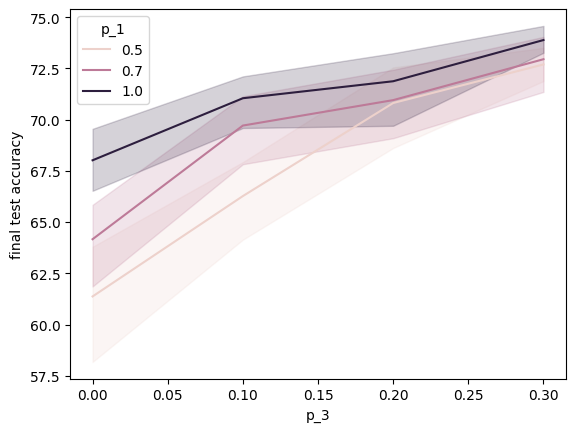

In [1]:

import wandb 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

project_name="Acc_vs_size_better_DEEP-R_MOSAIC"

api = wandb.Api()
entity = "theoballetberdoulou"
runs = api.runs(path=entity + "/" + project_name)

accuracy_list, config_list = [], []
for run in runs :
    print(run.name)

    accuracy_list.append(run.summary._json_dict["final test accuracy"])
    config_list.append({k: v for k, v in run.config.items() if not k.startswith("_")})

def extract(list, str):
    return_list = []
    for i in range(len(list)) : 
        return_list.append(list[i][str])
    return return_list

df = pd.DataFrame({"final test accuracy": accuracy_list, "p_1": extract(config_list, "p_1"), "p_3":extract(config_list, "p_3")})

print(df)

sns.lineplot(df, x="p_3", y="final test accuracy", hue="p_1")
plt.savefig('data/Acc_vs_Proba.svg', format='svg')

In [2]:
#over all p1
import wandb 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np


project_name="Acc_vs_size_better_DEEP-R_MOSAIC"

api = wandb.Api()
entity = "theoballetberdoulou"
runs = api.runs(path=entity + "/" + project_name)

accuracy_list, config_list = [], []
for run in runs :
    print(run.name)

    sum_dict = run.summary._json_dict
    output_list = ["final test accuracy", "validation accuracy", "NT_size", "R_0_size", "R_1_size"]
    accuracy_list.append({k:sum_dict[k] for k in output_list})
    config_list.append({k: v for k, v in run.config.items() if not k.startswith("_")})

df_fc_1 = pd.DataFrame(accuracy_list)
df_fc_1["mem count"] = 25 * (df_fc_1["NT_size"]+ 32*32) + (25 + 11) * df_fc_1["R_0_size"] + (50 + 10) * df_fc_1["R_1_size"]

decent-sweep-252
toasty-sweep-251
solar-sweep-250
rare-sweep-249
gentle-sweep-248
prime-sweep-247
youthful-sweep-246
olive-sweep-245
decent-sweep-244
flowing-sweep-243
fine-sweep-242
neat-sweep-241
revived-sweep-240
balmy-sweep-239
comic-sweep-238
worthy-sweep-237
hearty-sweep-236
exalted-sweep-235
fresh-sweep-234
stellar-sweep-233
celestial-sweep-232
stilted-sweep-231
exalted-sweep-230
whole-sweep-229
robust-sweep-228
eager-sweep-227
swept-sweep-226
bumbling-sweep-225
stellar-sweep-224
azure-sweep-223
toasty-sweep-222
comfy-sweep-221
trim-sweep-220
comic-sweep-219
hardy-sweep-218
clear-sweep-217
sweepy-sweep-216
comfy-sweep-215
solar-sweep-214
vibrant-sweep-213
stoic-sweep-212
winter-sweep-211
stoic-sweep-210
ancient-sweep-209
effortless-sweep-208
desert-sweep-207
bumbling-sweep-206
woven-sweep-205
fresh-sweep-204
visionary-sweep-203
soft-sweep-202
eternal-sweep-201
eager-sweep-200
magic-sweep-199
prime-sweep-198
solar-sweep-197
ancient-sweep-196
stilted-sweep-195
olive-sweep-194
prou

smart-sweep-155
grateful-sweep-154
effortless-sweep-153
solar-sweep-152
amber-sweep-151
cool-sweep-150
dashing-sweep-149
jumping-sweep-148
confused-sweep-147
zesty-sweep-146
silvery-sweep-145
restful-sweep-144
balmy-sweep-143
sage-sweep-141
misty-sweep-142
leafy-sweep-140
bumbling-sweep-139
stilted-sweep-138
lucky-sweep-137
charmed-sweep-136
dry-sweep-135
solar-sweep-134
genial-sweep-133
pious-sweep-132
light-sweep-131
rose-sweep-130
clear-sweep-129
stellar-sweep-128
cosmic-sweep-127
divine-sweep-126
treasured-sweep-125
celestial-sweep-124
solar-sweep-123
zesty-sweep-122
good-sweep-121
rose-sweep-120
flowing-sweep-119
dark-sweep-118
frosty-sweep-117
sparkling-sweep-116
eager-sweep-115
lively-sweep-114
fiery-sweep-113
sunny-sweep-112
treasured-sweep-111
valiant-sweep-110
helpful-sweep-109
winter-sweep-108
crimson-sweep-107
leafy-sweep-106
deep-sweep-105
wild-sweep-104
eternal-sweep-103
efficient-sweep-102
swift-sweep-101
northern-sweep-100
soft-sweep-99
driven-sweep-98
easy-sweep-97
dar

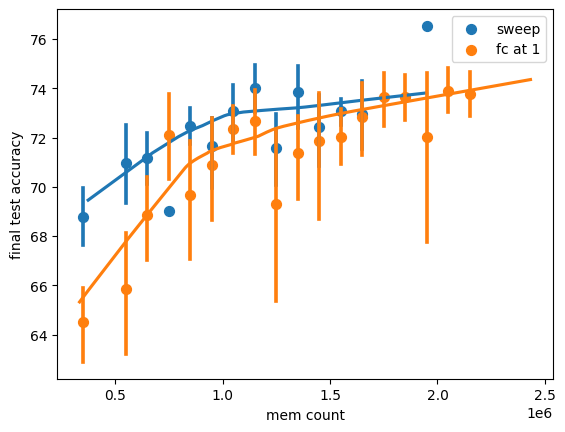

In [3]:
import wandb 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np
#fc at distance 1

project_name="Acc_vs_size_better_DEEP-R_MOSAIC_ICNCE"

api = wandb.Api()
entity = "theoballetberdoulou"
runs = api.runs(path=entity + "/" + project_name)

accuracy_list, config_list = [], []
for run in runs :
    print(run.name)

    sum_dict = run.summary._json_dict
    output_list = ["final test accuracy", "validation accuracy", "NT_size", "R_0_size", "R_1_size"]
    accuracy_list.append({k:sum_dict[k] for k in output_list})
    config_list.append({k: v for k, v in run.config.items() if not k.startswith("_")})

df = pd.DataFrame(accuracy_list)
df["mem count"] = 25 * (df["NT_size"]+ 32*32) + (25 + 11) * df["R_0_size"] + (50 + 10) * df["R_1_size"]

print(df)

sns.regplot(df, x="mem count", y="validation accuracy", x_bins=np.arange(0.25e6, 2.25e6, 0.1e6), lowess=True)
plt.savefig('data/Val_Acc_vs_size.png')
plt.clf()
sns.regplot(df, x="mem count", y="final test accuracy",label = "sweep", x_bins=np.arange(0.25e6, 2.25e6, 0.1e6), lowess=True)
sns.regplot(df_fc_1, x="mem count", y="final test accuracy", label="fc at 1",x_bins=np.arange(0.25e6, 2.25e6, 0.1e6), lowess=True)
plt.legend()

plt.savefig('data/Train_Acc_vs_size.png')

In [4]:
import wandb 
import pandas as pd 
import matplotlib.pyplot as plt 

#setup api to wandb
api = wandb.Api()
entity = "theoballetberdoulou"
project_name = "SLURM_base_MOSAIC"
sweep_id="5z1u452a"
runs = api.runs(path=entity + "/" + project_name, filters={"sweep" : sweep_id})

data = []
for run in runs:
    print(run.name)
    run_data = run.history().get(['test_acc_shd', 'beta', 'R0 min size', 'R1 min size', 'Nt min size'])
    data.append(run_data)

sweep_id="sd62zr90"
runs = api.runs(path=entity + "/" + project_name, filters={"sweep" : sweep_id})
for run in runs:
    print(run.name)
    run_data = run.history().get(['test_acc_shd', 'beta', 'R0 min size', 'R1 min size', 'Nt min size'])
    data.append(run_data)


df_mosaic_0 = pd.concat(data, axis=0)
df_mosaic_0["NT_size"] = df_mosaic_0['Nt min size']
df_mosaic_0["R_0_size"] = df_mosaic_0['R0 min size']
df_mosaic_0["R_1_size"] = df_mosaic_0['R1 min size']
df_mosaic_0["mem count"] = 25 * (df_mosaic_0["NT_size"]) + (25 + 11) * df_mosaic_0["R_0_size"] + (50 + 10) * df_mosaic_0["R_1_size"]
proposed_architecture = 25 * (160*32 + 32*32) + (25 + 11) * (64*64) + (50 + 10) * (128* 128)
proposed_architecture_opt = 25 * (140*32 + 32*32) + (25 + 11) * (64*64) + (50 + 10) * (96* 96)
sns.set_theme(style="whitegrid")

plt.clf()
sns.regplot(df, x="mem count", y="final test accuracy", x_estimator=np.mean, lowess=True)
sns.regplot(df_mosaic_0, x="mem count", y="test_acc_shd", x_estimator=np.mean ,lowess=True )
plt.axvline(proposed_architecture, color='red', linestyle='--')
plt.axvline(proposed_architecture_opt, color='green', linestyle='--')
plt.savefig("data/original_vs_new.png")

pleasant-sweep-40
effortless-sweep-39
earthy-sweep-38
vital-sweep-37
noble-sweep-36
rich-sweep-35
rich-sweep-32
happy-sweep-33
clean-sweep-34
effortless-sweep-31
laced-sweep-29


0.0002009047220831048
6.306894501233431e-05


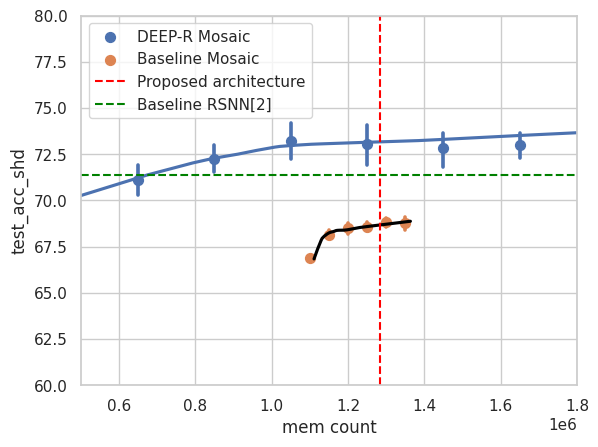

In [14]:

sns.set_theme(style="whitegrid")

plt.clf()
sns.regplot(df, x="mem count", y="final test accuracy",x_bins=np.arange(0.25e6, 2.25e6, 0.2e6),  lowess=True, label="DEEP-R Mosaic")
sns.regplot(df_mosaic_0, x="mem count", y="test_acc_shd", x_bins=np.arange(0.25e6, 2.25e6, 0.05e6), lowess=True, line_kws=dict(color="black"), label="Baseline Mosaic" )
plt.axvline(proposed_architecture, color='red', label ='Proposed architecture', linestyle='--')
plt.axhline(71.4, color='green', label ='Baseline RSNN[2]', linestyle='--')
#plt.fill_between([0.5e6, 2e6], 71.4 -1.9, 71.4 + 1.9, color='green', alpha=0.2, label="" )
plt.xlim([0.5e6, 1.8e6])
plt.ylim([60, 80])
plt.legend()
plt.savefig("data/original_vs_new.svg", format="svg")

print(np.max(df['final test accuracy']/df['mem count']))
print(np.max(df_mosaic_0['test_acc_shd']/df_mosaic_0['mem count']))

volcanic-sweep-120
serene-sweep-119
glad-sweep-118
giddy-sweep-117
fancy-sweep-116
cosmic-sweep-115
helpful-sweep-114
scarlet-sweep-113
easy-sweep-112
hearty-sweep-111
comic-sweep-110
visionary-sweep-109
atomic-sweep-108
atomic-sweep-107
sparkling-sweep-106
smooth-sweep-105
laced-sweep-104
major-sweep-103
bright-sweep-102
whole-sweep-101
upbeat-sweep-100
comfy-sweep-99
fluent-sweep-98
light-sweep-97
warm-sweep-96
usual-sweep-95
dauntless-sweep-94
morning-sweep-93
light-sweep-92
azure-sweep-91
summer-sweep-90
different-sweep-89
ethereal-sweep-88
icy-sweep-87
amber-sweep-86
sweepy-sweep-85
robust-sweep-84
playful-sweep-83
youthful-sweep-82
snowy-sweep-81
fine-sweep-80
dazzling-sweep-79
glowing-sweep-78
sandy-sweep-77
stellar-sweep-76
glamorous-sweep-75
blooming-sweep-74
brisk-sweep-73
firm-sweep-72
daily-sweep-71
gallant-sweep-70
sweepy-sweep-69
sleek-sweep-68
ancient-sweep-67
dutiful-sweep-66
silvery-sweep-65
dutiful-sweep-64
unique-sweep-63
wandering-sweep-62
devoted-sweep-61
deep-swee

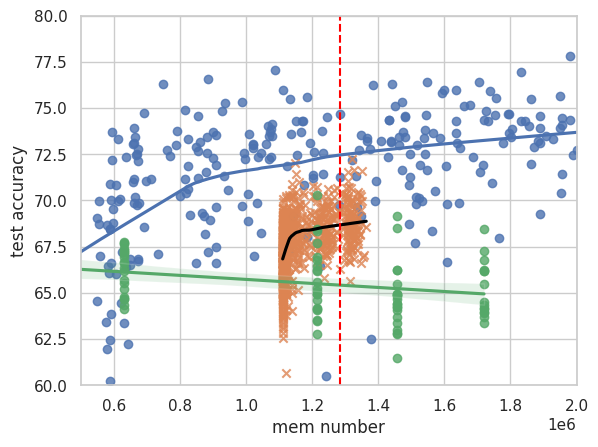

In [12]:
sweep_id="ui2gptp5"
project_name="FC_RSNN"

api = wandb.Api()
entity = "theoballetberdoulou"
runs = api.runs(path=entity + "/" + project_name, filters={"sweep" : sweep_id})

accuracy_list, config_list = [], []
for run in runs :
    print(run.name)
    output_list = ["test accuracy", "mem number"]
    accuracy_list.append(run.summary._json_dict)
    config_list.append({k: v for k, v in run.config.items() if not k.startswith("_")})

df_fc = pd.DataFrame(accuracy_list)
print(df_fc)
df_fc["test accuracy"] = df_fc["test accuracy"] * 100

sns.set_theme(style="whitegrid")

plt.clf()
sns.regplot(df, x="mem count", y="final test accuracy", lowess=True)
sns.regplot(df_mosaic_0, x="mem count", y="test_acc_shd", marker='x', lowess=True, line_kws=dict(color="black") )
sns.regplot(df_fc, x="mem number", y="test accuracy")
plt.axvline(proposed_architecture, color='red', linestyle='--')
plt.xlim([0.5e6, 2e6])
plt.ylim([60, 80])
plt.savefig("data/original_vs_new_vs_fc.png")
